### Importing Libraries

In [22]:
import numpy as np 
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt
import pmdarima as pm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import statsmodels.api as sm 
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX 
from prophet import Prophet

from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_percentage_error as mape
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import (   mean_absolute_error as mae,
                                mean_squared_error as mse,
                                mean_absolute_percentage_error as mape )

import warnings 
warnings.filterwarnings('ignore')

In [23]:
plt.rcParams['figure.figsize'] = (27, 10)

### Problem Statement

Ad Ease is an ads and marketing based company helping businesses elicit maximum clicks @ minimum cost. AdEase is an ad infrastructure to help businesses promote themselves easily, effectively, and economically. The interplay of 3 AI modules - Design, Dispense, and Decipher, come together to make it this an end-to-end 3 step process digital advertising solution for all.

You are working in the Data Science team of Ad ease trying to understand the per page view report for different wikipedia pages for 550 days, and forecasting the number of views so that you can predict and optimize the ad placement for your clients. You are provided with the data of 145k wikipedia pages and daily view count for each of them. Your clients belong to different regions and need data on how their ads will perform on pages in different languages.

> Data Dictionary:

There are two csv files given

**train_1.csv**: In the csv file, each row corresponds to a particular article and each column corresponds to a particular date. The values are the number of visits on that date.

The page name contains data in this format:

*SPECIFIC NAME _ LANGUAGE.wikipedia.org _ ACCESS TYPE _ ACCESS ORIGIN*

having information about the page name, the main domain, the device type used to access the page, and also the request origin(spider or browser agent)

**Exog_Campaign_eng**: This file contains data for the dates which had a campaign or significant event that could affect the views for that day. The data is just for pages in English.

There’s 1 for dates with campaigns and 0 for remaining dates. It is to be treated as an exogenous variable for models when training and forecasting data for pages in English

### Functions

In [24]:
def basic_info(df):

    """
    Takes a DataFrame as input, and gives the basic info like shape, missing values count, duplicated rows, unique values and dtypes of the features
    
    Args:
        df (pandas.DataFrame): The DataFrame for which you want the details of

    Returns: 
        None 
    """
    print(f"shape of the date : \n\trows = {df.shape[0]}, columns = {df.shape[1]}\n")
    missing_val_count = df.isna().sum().sum()
    print(f"missing values: \n\tcount = {missing_val_count}")
    if missing_val_count != 0:
        missing_data = df.isna().sum().reset_index().rename({"index" : "feature", 0 : "missing_val_count"}, axis = 1)
        missing_data["missing_val_percentage"] = np.round((missing_data["missing_val_count"] / df.shape[0]) * 100, 2)
        missing_data = missing_data.sort_values(by = "missing_val_count", ascending = False)
        display(missing_data)

    print(f"duplicated records: \n\tcount = {df.duplicated().sum()}\n")
    print(f"Unique Values : ")
    nunique_vals = df.nunique().reset_index().rename({"index" : "feature", 0 : "nunique_vals"}, axis = 1)
    display(nunique_vals)

    display(df.dtypes.reset_index().rename(columns = {"index" : "fetaure", 0 : "data type"}))

In [25]:
def train_test_shape(train, test):
    
    """
    Takes two DataFrame's as input, and gives the shapes of the respective DataFrame
    
    Args:
        train (pandas.DataFrame): The training DataFrame
        test (pandas.DataFrame): The testing DataFrame

    Returns: 
        None 
    """
    
    print(f"The shape of train data = {train.shape} ")
    print(f"The shape of test data = {test.shape} ")

In [26]:
def page_encode(page):

    """
    Takes a String as input, and gives the hidden information present in the string like Language, access, origin, domain
    
    Args:
        page (String): Name of the wikipedia page
      
    Returns: 
        dict: A dictionary which contains information of language, access, origin and domain 
    """
    
    page_details = page.split(".org_")
    if len(page_details) > 2:
        page_details = page_details[-2: ]

    language, access, origin, domain = "No Match", "No Match", "No Match", "No Match"

    for _ in range(0,len(page_details)):
        text = page_details[_]
        if _ == 0:
            text = text.split(".")
            domain = text[-1]
            if len(text) > 2:
                text = text[-2]
            else:
                text = text[0]    
            language = text.split("_")[-1]   

        else:
            data = text.split("_")
            access = data[0]  
            origin = data[1]

    page_data = {
        "language" : language,
        "domain" : domain,
        "access" : access,
        "origin" : origin
    }        
    
    return page_data


In [27]:
def ts_data(lang_data, _):

    """
    takes a DataFrame with respect to one language, set's index to Date and finds the Month, Year, Day of the wikipedia page
    
    Args:
        lang_data (pandas.DataFrame) :  A DataFrame which is grouped by language (test or train)
        _ (int): index of the required language in the lang_data DataFrame

    Returns: 
        pandas.DataFrame: A DataFrame of the given langauge, with Date as index  
    """
    
    ts = lang_data.iloc[_, :].reset_index()
    ts.rename(columns = {_: "Adviews", "index" : "Date"}, inplace = True)
    ts = ts.loc[1:,:]
    ts["Date"] = pd.to_datetime(ts["Date"])
    ts["dayName"] = ts["Date"].dt.day_name()
    ts["month"] = ts["Date"].dt.month
    ts["year"] = ts["Date"].dt.year
    ts.set_index("Date", inplace = True)

    return ts

In [28]:
def resid_stats(resid):
    
    """
    Takes residuals of the Time Series Decomposition and gives mean and median
    
    Args:
        resid (pandas.core.series.Series): residuals of the time series decomposition
      
    Returns: 
        None
    """
    print(f"model\n  mean = {resid.mean()}")
    print(f"  std = {resid.std()}")

In [29]:
def adfuller_test(time_series_data):

    """
    Takes a time series data and checks if it is Stationary or not
    
    Args:
        time_series_data (pandas.Series): A series of time series data
      
    Returns: 
        None
    """

    p_val = adfuller(time_series_data)[1]
    if p_val <= 0.05:
        print('Sequence is stationary')
    else:
        print('Sequence is not stationary')

In [30]:
def performance(actual, pred):

    """
    Takes two pd.Series as input and prints several evaluation metrics scores
    
    Args:
        actual (pandas.Series): the actual values that present in the data
        pred (pandas.Series): the predicted values (by model) with respect to the actual values 
      
    Returns: 
        None
    """

    actual = np.array(actual)
    pred = np.array(pred)
    print('MAE :', round(mae(actual, pred), 3))
    print('RMSE :', round(mse(actual, pred)**0.5, 3))
    print('MAPE:', round(mape(actual, pred), 3))

In [31]:
def data_transformation(df):

    """
    Takes a DataFrame as input and changes the features names accroding the facebook prophet model's requirement
    
    Args:
        df (pandas.DataFrame): The DataFrame which is needed to be changed as per facebook prophet's model
        
    Returns: 
        pandas.DataFrame : The Date index is changed to a feature ("ds"), target is changed to "y" (and all the features are dropped except exog variable)
    """

    df = df.reset_index().copy()
    df['ds'] = pd.to_datetime(df['Date'])
    df['y'] = df['Adviews']
    df = df[['ds', 'y', 'exog']]
    print(f"{'-' * 50}")
    return df

In [32]:
def plot_complete_data(df, is_exog = False, is_weekend = False, is_test_data = False):

    """
    Takes a DataFrame as input and plot the data completely, indicates if there is any weekend/ campaign 
    
    Args:
        df (pandas.DataFrame): The DataFrame which is needed to be plotted
        is_exog (boolean): include's exog (campaign) values in the plot (if True, then it plots a red vertical line in the plot if there is any campaign)
        is_weekend (boolean): include's weekend (campaign) data in the plot (if True, then it plots a yellow vertical line in the plot if the day is Saturday/Sunday)
        is_test_data (boolean): if True, then it plots the test data or else no 
        
    Returns: 
        None
    """
    
    campaigns = df.loc[df.exog==1].index
    if is_exog == True:
        for campaign in campaigns:
            plt.axvline(x=campaign, color='#FA8072')
    if is_weekend == True:
        weekend = df.iloc[np.where((df["dayName"] == "Saturday") | (df["dayName"] == "Sunday"))].index
        for wend in weekend:
            plt.axvline(x = wend, color = "#FFFF00")        
    df.Adviews.plot(style='-*')
    plt.title("complete data")
    plt.show()

    if is_test_data == False:
        plt.plot(df.loc["2016-07-15":"2016-09-10", :].index, df.loc["2016-07-15":"2016-09-10",:].Adviews, '-*')
        for x in df.loc["2016-07-15":"2016-09-10", :].query('exog==1').index:
            plt.axvline(x=x, color='red', alpha = 0.4)
        plt.xticks(df.loc["2016-07-15":"2016-09-10", :].index, df.loc["2016-07-15":"2016-09-10",:].dayName,rotation = 90)  
        plt.title("closer look")
        plt.show()

In [33]:
def plot_data_weekly(df):

    """
    Takes a DataFrame as input and plot the weekday wise by taking average views on the given weekday
    
    Args:
        df (pandas.DataFrame): The DataFrame which is needed to be plotted
        
    Returns: 
        None
    """

    weekday_list = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

    plot_data = df.groupby(by = ["dayName"])["Adviews"].apply("mean")
    plot_data.index = pd.Categorical(plot_data.index, categories=weekday_list, ordered=True)
    plot_data.sort_index().plot(style = "-*")
    plt.title("week data")
    plt.show()

In [34]:
def plot_data_monthly(df, is_monthly = True, is_quater = False):

    """
    Takes a DataFrame as input and plot the data montly wise and quaterly wise
    
    Args:
        df (pandas.DataFrame): The DataFrame which is needed to be plotted
        is_monthly (boolean): plots the data with respect to the month (it averages all the views per month)
        is_quater (boolean): plots the data with respect to the quater (it averages all the views per quater)
        
    Returns: 
        None
    """
    
    
    month_names = ['January', 'February', 'March', 'April', 'May', 'June',
            'July', 'August', 'September', 'October', 'November', 'December']
    month_wise_data = df.groupby(by = ["month"])["Adviews"].apply("mean").sort_index()
    
    if is_monthly == True:
        month_wise_data.plot(style = "-*")
        for q in [3,6,9,12]:
            plt.axvline(x = q, color = "#FA8072")   
        plt.xticks(range(1,13), month_names,rotation = 90)
        plt.title("month data")
        plt.show()
    
    if is_quater == True:
        month_wise_data = month_wise_data.reset_index()
        quaters = ["Q1", "Q2", "Q3", "Q4"]
        info = {}
        for i in range(0, len(quaters)):
            s = i * 3
            info[quaters[i]] = month_wise_data.iloc[s:s+3,1].mean()
        info = pd.Series(info) 
        info.plot(style = "-*")
        plt.xticks(range(0,4), quaters)
        plt.title("quaterly wise")
        plt.show() 

In [35]:
def prophet_model(train, test, period, is_exog = True, is_plot = False, is_parameter = False):

    """
    takes training data, test data as input and builds a prophet model and check's the MAPE score
    
    Args:
        train (pandas.DataFrame): The training DataFrame (model is built on this)
        test (pandas.DataFrame): The test DataFrame (model is evaluated on this with MAPE)
        is_exog (boolean): if True, then it includes exog feature (campaign) data to build the model
        is_plot (boolean): if True, then it plots the predicted data with respect to the test data
        is_parameter (boolean): if True, then a parametrised prophet model is built or normal model it built
        
    Returns: 
        prophet.forecaster.Prophet : the model which is build
        pandas.core.frame.DataFrame: the forecasted values
        float: the mape value with respect to forecasted values and actual test values
        
    """

    if is_parameter == True:
        print(f"model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'")
        model = Prophet(interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, 
                changepoint_prior_scale=4)
    else:
        model = Prophet()

    train = data_transformation(train)
    test = data_transformation(test)

    start_date = test.ds.min()
    end_date = test.ds.max()
    
    if is_exog == True:
        print(f"exog paramater considered - 'Campaign'")
        model.add_regressor('exog')

    model.fit(train) 
    future = model.make_future_dataframe(periods = period,freq = "D")
    forecast = model.predict(test)

    if is_plot:
        plt.plot(forecast['ds'], forecast['yhat'],'-*', label = 'Predictions')
        plt.plot(test.ds, test['y'], '-*', label = 'Actual')
        for x in test[test['exog'] == 1].ds:
            plt.axvline(x=x, color='red', alpha = 0.5);
        plt.xlim(pd.to_datetime(start_date), pd.to_datetime(end_date))
        plt.legend()
        plt.show()

    performance(test.y, forecast.yhat)

    return model, forecast, mape(test.y, forecast.yhat)

In [36]:
def lr_model_transformation(df):

    """
    takes a DataFrame and transfroms the data as per linear regression data

    finds previous 30 days views, and makes them as separate feature and develop new features such as last_week_avg_level, last_2week_avg_level, sale_wrt_dow, last_month_avg_level
    
    Args:
        df (pandas.DataFrame): The DataFrame (train + test)
        
    Returns: 
        pandas.core.frame.DataFrame: the transfromed DataFrame
        
    """

    df = df.reset_index()
    print(f"shape at begining = {df.shape}")

    df["Date"] = pd.to_datetime(df["Date"])
    df["weekday"] = np.where(((df["dayName"] == "Friday") | (df["dayName"] == "Thursday") | (df["dayName"] == "Wednesday") | (df["dayName"] == "Tuesday") | (df["dayName"] == "Monday")), "working_day", "weekend")
    intmdt = pd.get_dummies(df['weekday']).astype("int")
    df = pd.concat([df, intmdt],axis =1 )

    for i in range(1,32):
        df["Lag_{}".format(i)] = df['Adviews'].shift(i)
    df.dropna(inplace = True) 

    lis = ['Lag_{}'.format(i) for i in range(1,8)]
    df['last_week_avg_level'] = df.loc[:,lis].sum(axis=1)/7

    lis = ['Lag_{}'.format(i) for i in range(1,32)]
    df['last_month_avg_level'] = df.loc[:,lis].sum(axis=1)/31

    lis = ["Lag_{}".format(i) for i in range(1,15)]
    df['last_2week_avg_level'] = df.loc[:,lis].sum(axis = 1)/14

    df['sale_wrt_dow'] = df.groupby('weekday')['Adviews'].transform('mean')
    df[['sale_wrt_dow', 'weekday']].drop_duplicates()

    print(f"shape at end = {df.shape}")

    df = df[['Adviews', 'Lag_1', 'last_week_avg_level', 'last_month_avg_level',
          'last_2week_avg_level', 'sale_wrt_dow', 'exog', 'weekend', 'month']]
    print(f"training data")

    display(df.head())

    for col in df.columns:
        if df[col].dtype == "O":
            df[col] = df[col].astype("float")

    return df

### Reading Data and getting basic info

In [37]:
df = pd.read_csv("train_1.csv")
df.head()

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
0,2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,...,32.0,63.0,15.0,26.0,14.0,20.0,22.0,19.0,18.0,20.0
1,2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,...,17.0,42.0,28.0,15.0,9.0,30.0,52.0,45.0,26.0,20.0
2,3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,...,3.0,1.0,1.0,7.0,4.0,4.0,6.0,3.0,4.0,17.0
3,4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,...,32.0,10.0,26.0,27.0,16.0,11.0,17.0,19.0,10.0,11.0
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,48.0,9.0,25.0,13.0,3.0,11.0,27.0,13.0,36.0,10.0


In [38]:
exog = pd.read_csv("Exog_Campaign_eng.csv")
exog.head()

,Exog
0,0
1,0
2,0
3,0
4,0


In [39]:
basic_info(df)

shape of the date : 
	rows = 145063, columns = 551

missing values: 
	count = 6192931


,feature,missing_val_count,missing_val_percentage
2,2015-07-02,20816,14.35
1,2015-07-01,20740,14.30
7,2015-07-07,20664,14.24
5,2015-07-05,20659,14.24
4,2015-07-04,20654,14.24
...,...,...,...
550,2016-12-31,3465,2.39
539,2016-12-20,3268,2.25
540,2016-12-21,3236,2.23
543,2016-12-24,3189,2.20


duplicated records: 
	count = 0

Unique Values : 


,feature,nunique_vals
0,Page,145063
1,2015-07-01,6898
2,2015-07-02,6823
3,2015-07-03,6707
4,2015-07-04,6995
...,...,...
546,2016-12-27,8938
547,2016-12-28,8819
548,2016-12-29,8761
549,2016-12-30,8733


,fetaure,data type
0,Page,object
1,2015-07-01,float64
2,2015-07-02,float64
3,2015-07-03,float64
4,2015-07-04,float64
...,...,...
546,2016-12-27,float64
547,2016-12-28,float64
548,2016-12-29,float64
549,2016-12-30,float64


In [40]:
basic_info(exog)

shape of the date : 
	rows = 550, columns = 1

missing values: 
	count = 0
duplicated records: 
	count = 548

Unique Values : 


,feature,nunique_vals
0,Exog,2


,fetaure,data type
0,Exog,int64


In [41]:
historic_dates = df.columns.tolist()[1:]
print(f"start date = {min(historic_dates)}")
print(f"end date = {max(historic_dates)}")
print(f"# of days = {(pd.to_datetime(max(historic_dates)) - pd.to_datetime(min(historic_dates))).days + 1}")
print(f"# of unique dates = {len(set(historic_dates))}")


start date = 2015-07-01
end date = 2016-12-31
# of days = 550
# of unique dates = 550


- there are 550 dates in both Ad Ease and exog campaign files
- the df consists of past 1.5 years of data
- there are no duplicated records
- there are so many missing values, and maybe anomalies (needed to be taken care)


In [42]:
df.describe()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
count,1.243230e+05,1.242470e+05,1.245190e+05,1.244090e+05,1.244040e+05,1.245800e+05,1.243990e+05,1.247690e+05,1.248190e+05,1.247210e+05,...,1.412100e+05,1.414790e+05,1.418740e+05,1.413190e+05,1.411450e+05,1.413620e+05,1.412410e+05,1.412370e+05,1.414280e+05,1.415980e+05
mean,1.195857e+03,1.204004e+03,1.133676e+03,1.170437e+03,1.217769e+03,1.290273e+03,1.239137e+03,1.193092e+03,1.197992e+03,1.189651e+03,...,1.394096e+03,1.377482e+03,1.393099e+03,1.523740e+03,1.679607e+03,1.678302e+03,1.633966e+03,1.684308e+03,1.467943e+03,1.478282e+03
std,7.275352e+04,7.421515e+04,6.961022e+04,7.257351e+04,7.379612e+04,8.054448e+04,7.576288e+04,6.820002e+04,7.149717e+04,7.214536e+04,...,8.574880e+04,7.732794e+04,8.478533e+04,8.752210e+04,9.794534e+04,9.232482e+04,9.185831e+04,9.014266e+04,8.155481e+04,8.873567e+04
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.300000e+01,1.300000e+01,1.200000e+01,1.300000e+01,1.400000e+01,1.100000e+01,1.300000e+01,1.300000e+01,1.400000e+01,1.400000e+01,...,2.200000e+01,2.200000e+01,2.000000e+01,2.100000e+01,2.200000e+01,2.300000e+01,2.400000e+01,2.300000e+01,2.300000e+01,2.100000e+01
50%,1.090000e+02,1.080000e+02,1.050000e+02,1.050000e+02,1.130000e+02,1.130000e+02,1.150000e+02,1.170000e+02,1.150000e+02,1.130000e+02,...,1.490000e+02,1.430000e+02,1.320000e+02,1.450000e+02,1.600000e+02,1.620000e+02,1.630000e+02,1.600000e+02,1.540000e+02,1.360000e+02
75%,5.240000e+02,5.190000e+02,5.040000e+02,4.870000e+02,5.400000e+02,5.550000e+02,5.510000e+02,5.540000e+02,5.490000e+02,5.450000e+02,...,6.070000e+02,5.980000e+02,5.690000e+02,6.280000e+02,6.590000e+02,6.680000e+02,6.540000e+02,6.490000e+02,6.350000e+02,5.610000e+02
max,2.038124e+07,2.075219e+07,1.957397e+07,2.043964e+07,2.077211e+07,2.254467e+07,2.121089e+07,1.910791e+07,1.999385e+07,2.020182e+07,...,2.420108e+07,2.253925e+07,2.505662e+07,2.586575e+07,2.834288e+07,2.691699e+07,2.702505e+07,2.607382e+07,2.436397e+07,2.614954e+07


In [43]:
exog.describe()

,Exog
count,550.000000
mean,0.098182
std,0.297831
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


### Data Preprocessing

In [44]:
df.iloc[:,1:] = df.iloc[:,1:].interpolate(method = "linear", axis = 1)
df.fillna(0, inplace = True)

In [45]:
print(f"# of missing values = {df.isna().sum().sum()}")

# of missing values = 0


In [46]:
# taking last 50 dates for testing purpose
train_df = df.iloc[:,0: -50]
pages = df.iloc[:, 0]
test_df = df.iloc[:,-50:]
test_df = pd.concat([pages, test_df], axis = 1)

train_exog = exog.iloc[0: -50,:]
test_exog = exog.iloc[-50:,:]

In [47]:
train_test_shape(train_df, test_df)

The shape of train data = (145063, 501) 
The shape of test data = (145063, 51) 


In [48]:
train_test_shape(train_exog, test_exog)

The shape of train data = (500, 1) 
The shape of test data = (50, 1) 


In [49]:
wiki_data = train_df.Page.apply(page_encode).tolist()
wd_train = pd.DataFrame(wiki_data)

In [50]:
wiki_data = test_df.Page.apply(page_encode).tolist()
wd_test = pd.DataFrame(wiki_data)

In [51]:
train_test_shape(wd_train, wd_test)

The shape of train data = (145063, 4) 
The shape of test data = (145063, 4) 


In [52]:
wd_train.head()

,language,domain,access,origin
0,zh,wikipedia,all-access,spider
1,zh,wikipedia,all-access,spider
2,zh,wikipedia,all-access,spider
3,zh,wikipedia,all-access,spider
4,zh,wikipedia,all-access,spider


In [53]:
wd_test.head()

,language,domain,access,origin
0,zh,wikipedia,all-access,spider
1,zh,wikipedia,all-access,spider
2,zh,wikipedia,all-access,spider
3,zh,wikipedia,all-access,spider
4,zh,wikipedia,all-access,spider


In [54]:
basic_info(wd_train)

shape of the date : 
	rows = 145063, columns = 4

missing values: 
	count = 0
duplicated records: 
	count = 145027

Unique Values : 


,feature,nunique_vals
0,language,9
1,domain,3
2,access,3
3,origin,2


,fetaure,data type
0,language,object
1,domain,object
2,access,object
3,origin,object


In [55]:
basic_info(wd_test)

shape of the date : 
	rows = 145063, columns = 4

missing values: 
	count = 0


duplicated records: 
	count = 145027

Unique Values : 


,feature,nunique_vals
0,language,9
1,domain,3
2,access,3
3,origin,2


,fetaure,data type
0,language,object
1,domain,object
2,access,object
3,origin,object


In [56]:
train_df = pd.concat([train_df, wd_train], axis = 1)
train_df.head()

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-11-06,2016-11-07,2016-11-08,2016-11-09,2016-11-10,2016-11-11,language,domain,access,origin
0,2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,...,8.0,67.0,13.0,41.0,10.0,21.0,zh,wikipedia,all-access,spider
1,2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,...,21.0,14.0,14.0,54.0,5.0,10.0,zh,wikipedia,all-access,spider
2,3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,...,10.0,2.0,2.0,2.0,7.0,3.0,zh,wikipedia,all-access,spider
3,4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,...,12.0,13.0,9.0,8.0,21.0,16.0,zh,wikipedia,all-access,spider
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,10.0,22.0,11.0,8.0,4.0,10.0,zh,wikipedia,all-access,spider


In [57]:
test_df = pd.concat([test_df, wd_test], axis = 1)
test_df.head()

,Page,2016-11-12,2016-11-13,2016-11-14,2016-11-15,2016-11-16,2016-11-17,2016-11-18,2016-11-19,2016-11-20,...,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31,language,domain,access,origin
0,2NE1_zh.wikipedia.org_all-access_spider,13.0,8.0,15.0,14.0,12.0,6.0,11.0,10.0,42.0,...,14.0,20.0,22.0,19.0,18.0,20.0,zh,wikipedia,all-access,spider
1,2PM_zh.wikipedia.org_all-access_spider,12.0,11.0,14.0,28.0,23.0,20.0,9.0,12.0,11.0,...,9.0,30.0,52.0,45.0,26.0,20.0,zh,wikipedia,all-access,spider
2,3C_zh.wikipedia.org_all-access_spider,6.0,4.0,2.0,4.0,6.0,5.0,4.0,4.0,3.0,...,4.0,4.0,6.0,3.0,4.0,17.0,zh,wikipedia,all-access,spider
3,4minute_zh.wikipedia.org_all-access_spider,38.0,13.0,14.0,17.0,26.0,14.0,10.0,9.0,23.0,...,16.0,11.0,17.0,19.0,10.0,11.0,zh,wikipedia,all-access,spider
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,13.0,11.0,8.0,6.0,10.0,14.0,6.0,9.0,6.0,...,3.0,11.0,27.0,13.0,36.0,10.0,zh,wikipedia,all-access,spider


In [58]:
train = train_df.drop(["domain", "access", "origin", "Page"], axis = 1).groupby(by  = ["language"]).mean().reset_index()
train.head()

,language,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2016-11-02,2016-11-03,2016-11-04,2016-11-05,2016-11-06,2016-11-07,2016-11-08,2016-11-09,2016-11-10,2016-11-11
0,commons,108.083468,111.695785,109.054370,90.206273,100.332196,114.722901,119.759947,132.519033,115.015569,...,174.877550,186.311723,199.179547,240.843697,236.558506,300.902285,303.417911,290.177458,243.624493,220.585159
1,de,714.968405,705.240535,676.883812,621.151996,722.081525,794.836112,770.818268,782.083606,752.944125,...,922.736121,856.458188,842.769562,825.722975,1010.231323,985.036622,953.435453,1264.114589,987.775396,1003.936814
2,en,3513.862203,3502.540258,3325.387138,3462.089869,3575.560857,3849.772101,3643.582132,3437.916938,3517.505219,...,4904.286032,5087.559632,4733.162811,4977.083594,5352.545899,5406.996244,5462.196339,7542.380012,6188.241090,5563.481242
3,es,1085.972919,1037.828910,954.431796,896.069961,974.515374,1110.646130,1082.588483,1050.691722,1030.860554,...,1350.861783,1377.442996,1220.309267,1052.975001,1270.300822,1459.032773,1621.213642,2126.096797,1639.681569,1379.456944
4,fr,475.150994,478.203960,459.840994,491.515491,482.563026,502.747798,485.967661,477.043032,472.065229,...,643.457501,617.272973,612.099791,697.268349,778.267414,674.487297,688.931761,944.495447,725.074327,793.140204


In [59]:
test = test_df.drop(["domain", "access", "origin", "Page"], axis = 1).groupby(by  = ["language"]).mean().reset_index()
test.head()

,language,2016-11-12,2016-11-13,2016-11-14,2016-11-15,2016-11-16,2016-11-17,2016-11-18,2016-11-19,2016-11-20,...,2016-12-22,2016-12-23,2016-12-24,2016-12-25,2016-12-26,2016-12-27,2016-12-28,2016-12-29,2016-12-30,2016-12-31
0,commons,228.519642,235.115492,278.911467,228.999375,243.225807,263.513261,223.161812,199.510110,194.439078,...,212.093375,248.973786,210.538092,251.539472,274.239328,240.713799,268.028371,240.574406,259.837073,228.101090
1,de,895.726806,1014.490667,1025.692073,935.081811,958.720455,920.717240,873.667501,883.376870,968.222083,...,839.324405,849.618240,821.341811,1291.677355,1217.076081,1095.681785,1043.227173,1005.221435,959.830472,903.575403
2,en,5404.457792,5941.058161,6007.381334,5361.094590,5201.260594,4961.940883,4754.252736,4806.653421,4956.617150,...,5007.963664,4693.297998,4981.760967,5150.455602,5780.340042,6050.637316,5870.194673,6255.093361,5211.760603,5137.844574
3,es,1118.633974,1306.751228,1526.485346,1562.552412,1460.879661,1363.635113,1199.925963,994.196039,1122.601840,...,983.646868,935.170185,880.400576,903.740834,1195.500891,1133.389386,1178.315599,1112.197815,821.700295,787.406497
4,fr,817.358565,760.157057,739.838836,695.380410,680.064019,642.403200,610.092791,661.870013,767.077086,...,652.047063,639.502984,618.258198,666.682100,936.926866,858.425226,774.165515,752.725668,700.745178,646.271543


In [60]:
languages = train.language.unique().tolist()
tsa_train = {}
for _ in range(0,len(languages)):
    tsa_train[languages[_]] = ts_data(train, _)

In [61]:
languages = test.language.unique().tolist()
tsa_test = {}
for _ in range(0,len(languages)):
    tsa_test[languages[_]] = ts_data(test, _)

In [62]:
tsa_train["en"]

,Adviews,dayName,month,year
Date,,,,
2015-07-01,3513.862203,Wednesday,7,2015
2015-07-02,3502.540258,Thursday,7,2015
2015-07-03,3325.387138,Friday,7,2015
2015-07-04,3462.089869,Saturday,7,2015
2015-07-05,3575.560857,Sunday,7,2015
...,...,...,...,...
2016-11-07,5406.996244,Monday,11,2016
2016-11-08,5462.196339,Tuesday,11,2016
2016-11-09,7542.380012,Wednesday,11,2016


- we can observe some seasonality for language es and en (weekly)
- and bi-weekly for ja (let's get into more details later)

In [63]:
for language in languages:
    tsa_train[language]["exog"] = train_exog.values 
    tsa_test[language]["exog"] = test_exog.values 

model
  mean = -2.790343762889416
  std = 212.30689927912857


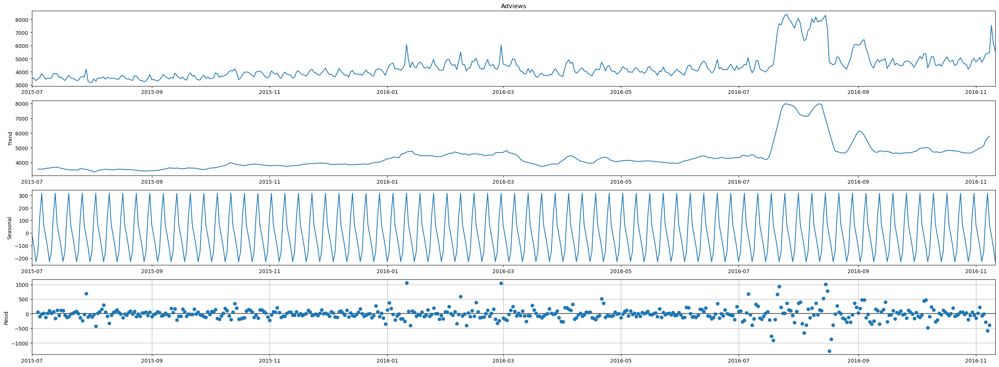

In [64]:
import statsmodels.api as sm 

model = sm.tsa.seasonal_decompose(tsa_train["en"].Adviews, model = "additive")
model.plot();

model.resid.hist(bins = 100)
resid_stats(model.resid)

### EDA

<Axes: xlabel='language'>

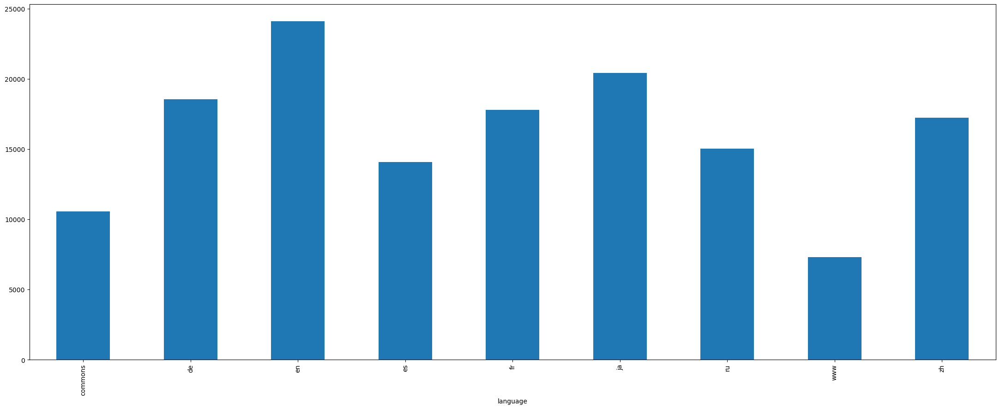

In [65]:
train_df.groupby(by = ["language"])["Page"].apply("count").plot(kind = "bar")

<Axes: xlabel='access'>

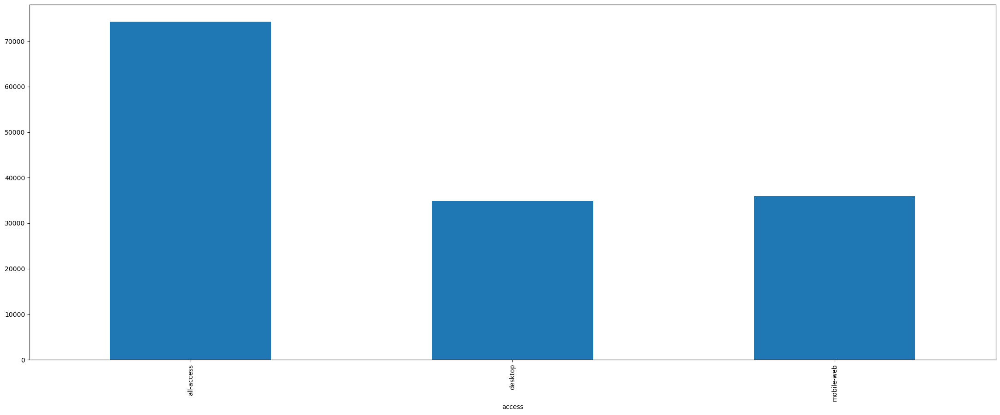

In [66]:
train_df.groupby(by = ["access"])["Page"].apply("count").plot(kind = "bar")

<Axes: xlabel='origin'>

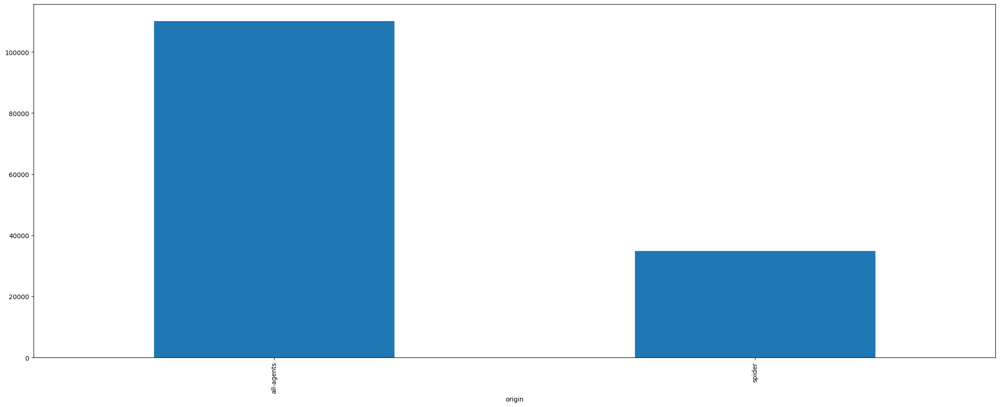

In [67]:
train_df.groupby(by = ["origin"])["Page"].apply("count").plot(kind = "bar")

<Axes: xlabel='domain'>

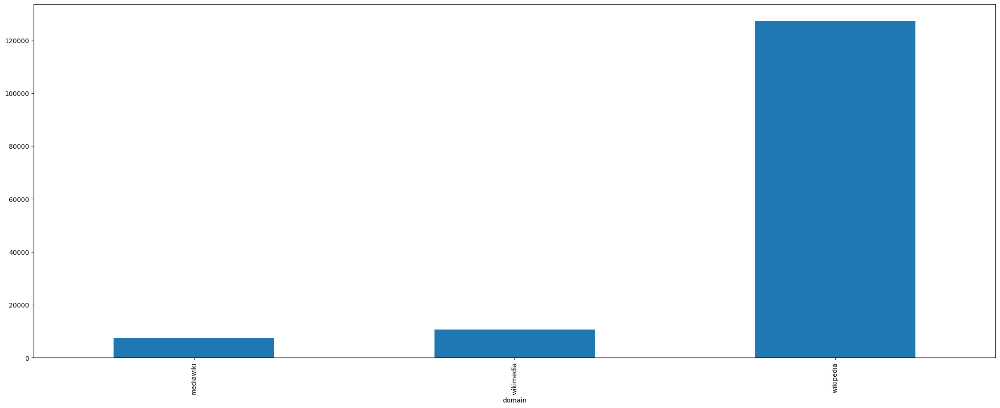

In [68]:
train_df.groupby(by = ["domain"])["Page"].apply("count").plot(kind = "bar")

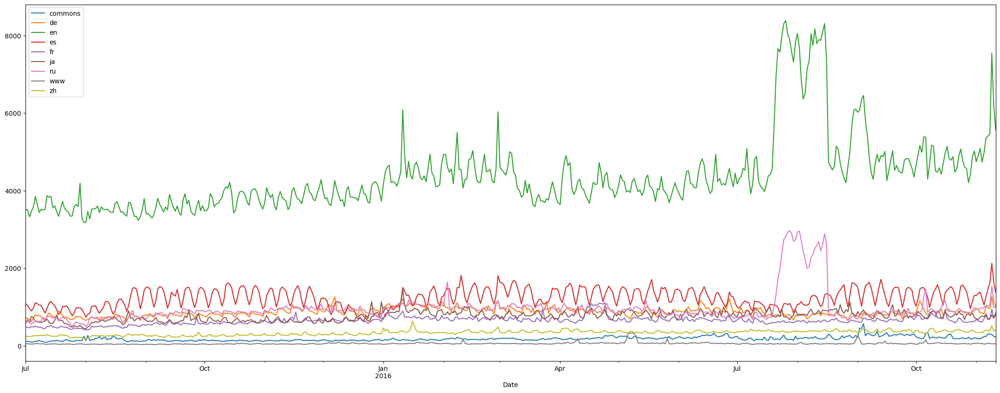

In [69]:
for language in tsa_train.keys():
    tsa_train[language].Adviews.plot(label = language)
plt.legend()
plt.show()

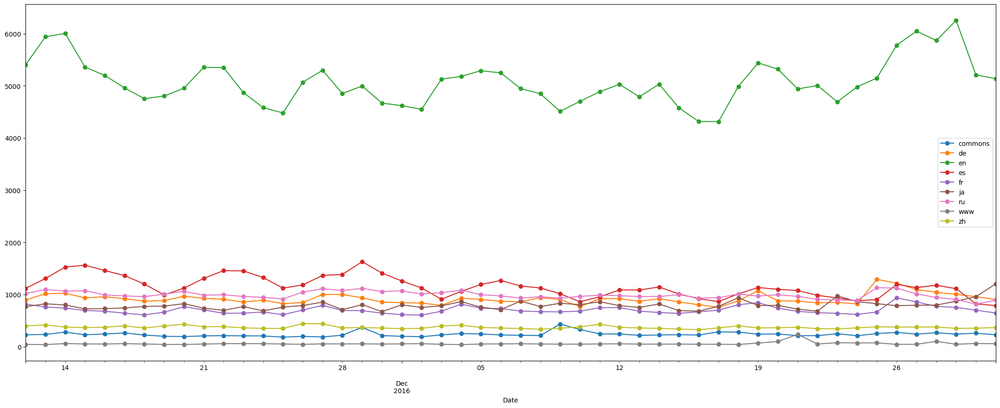

In [70]:
for language in tsa_test.keys():
    tsa_test[language].Adviews.plot(label = language, style = "-o")

plt.legend()
plt.show()

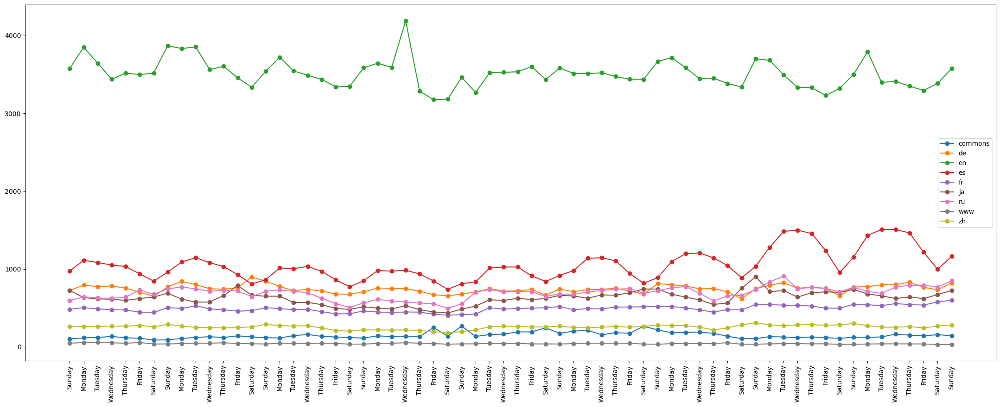

In [71]:
for language in tsa_train.keys():
    plt.plot(range(0,64),tsa_train[language].Adviews[4:68], '-o', label = language)
    plt.xticks(range(0,64), tsa_train[language].dayName[4:68],rotation = 90)

plt.legend()
plt.show()

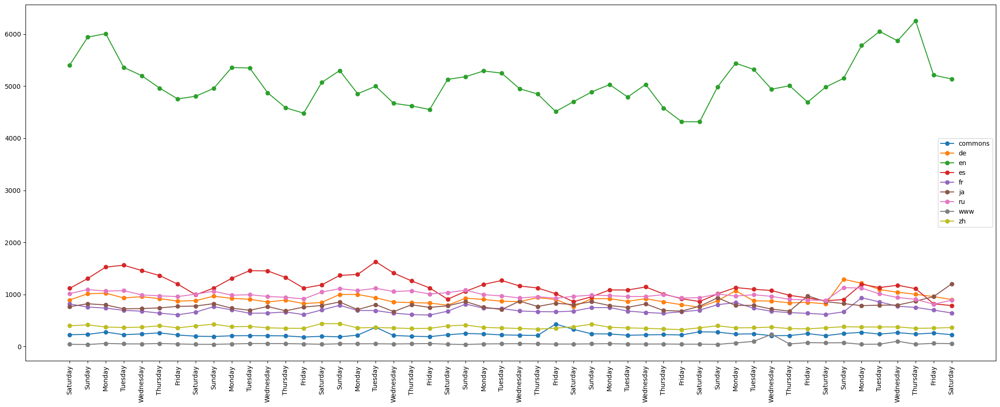

In [72]:
for language in tsa_test.keys():
    plt.plot(range(0,50),tsa_test[language].Adviews, '-o', label = language)
    plt.xticks(range(0,50), tsa_test[language].dayName,rotation = 90)

plt.legend()
plt.show()

#### commons

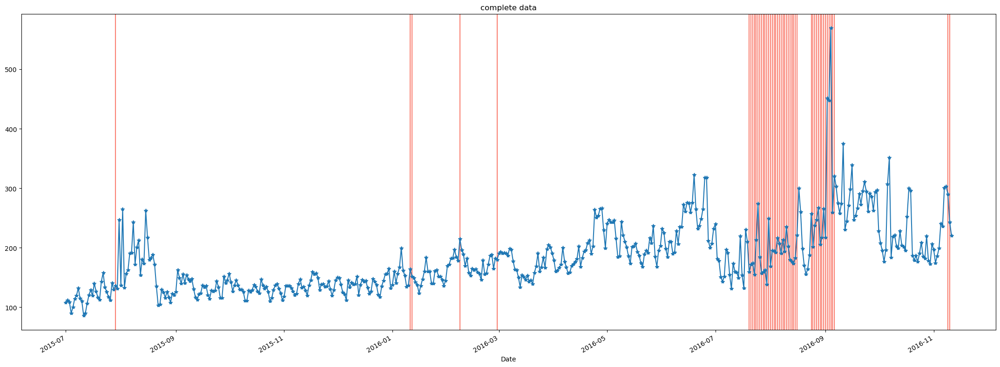

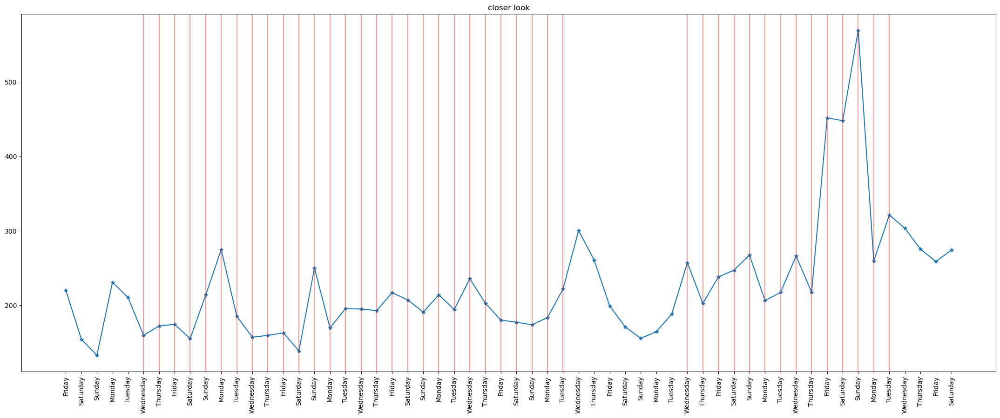

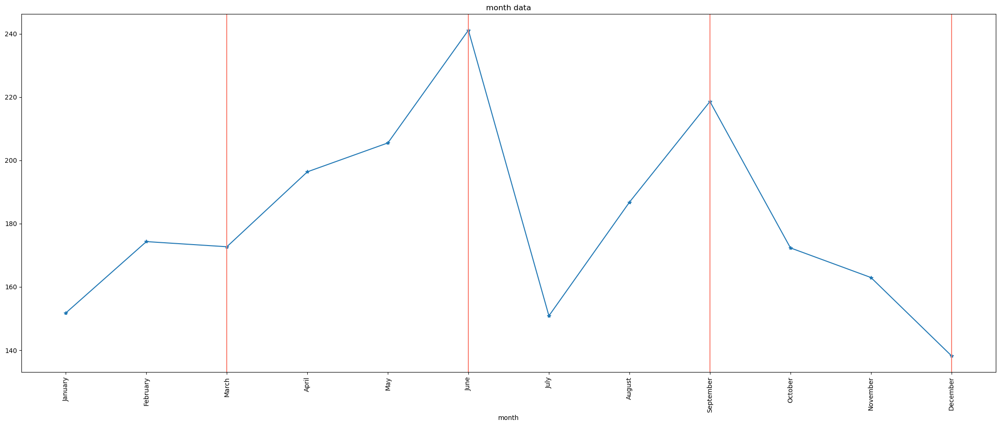

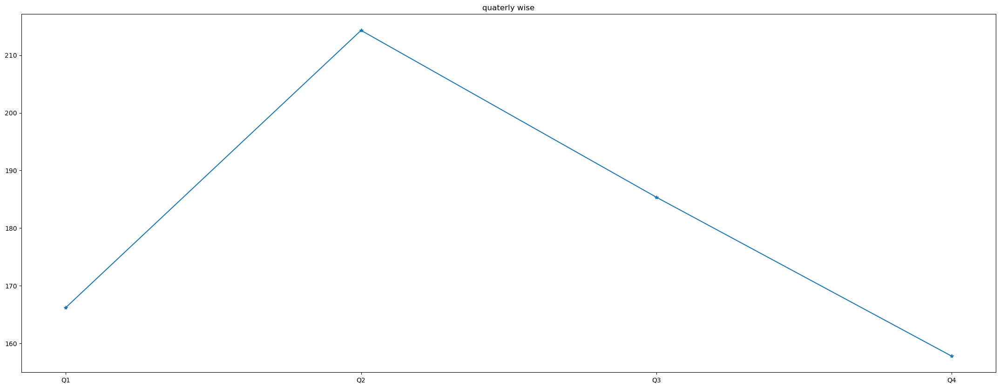

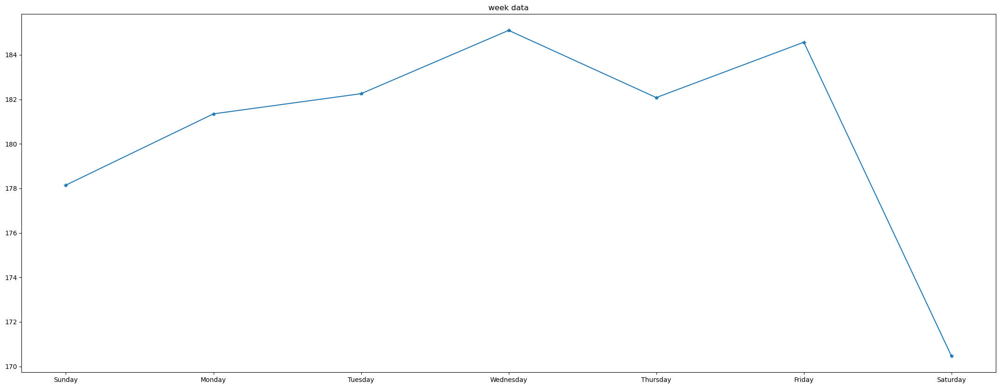

In [73]:
plot_complete_data(tsa_train["commons"], is_exog = True)
# plot_complete_data(tsa_train["commons"], is_weekend = True)
plot_data_monthly(tsa_train["commons"], is_monthly = True, is_quater = True)
plot_data_weekly(tsa_train["commons"])

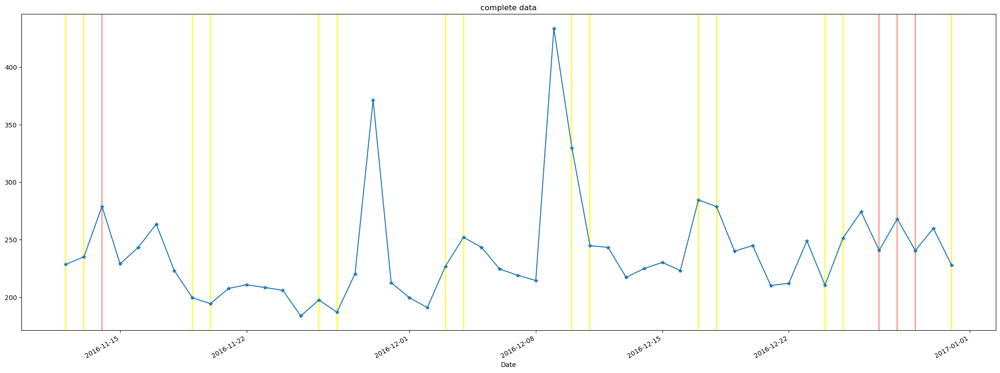

In [74]:
plot_complete_data(tsa_test["commons"], is_exog = True, is_weekend = True, is_test_data = True)

#### de

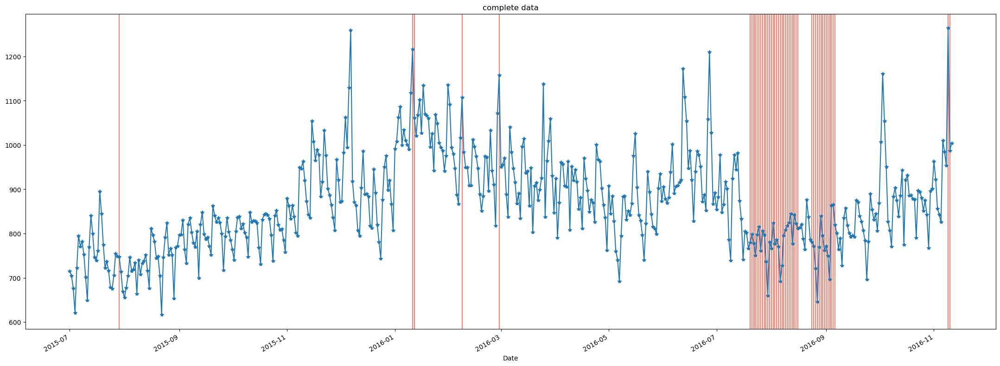

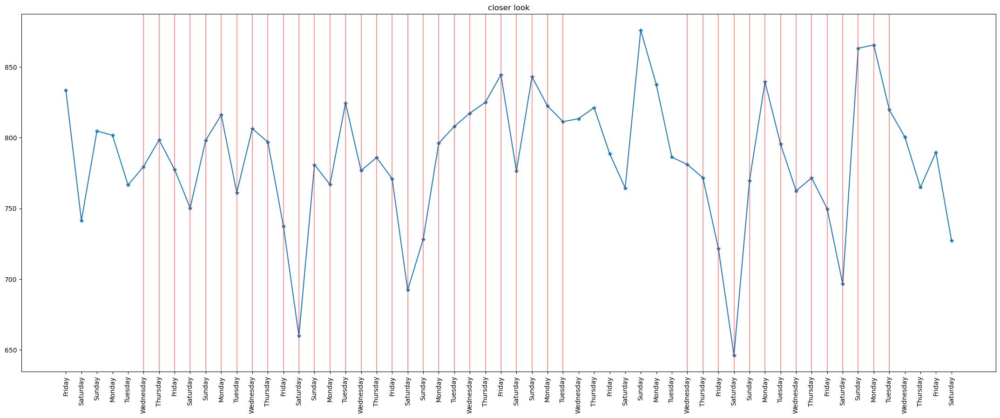

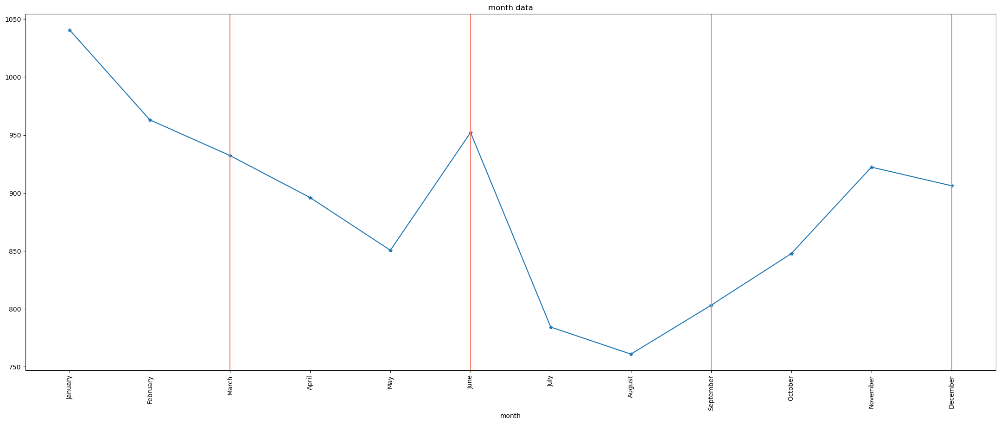

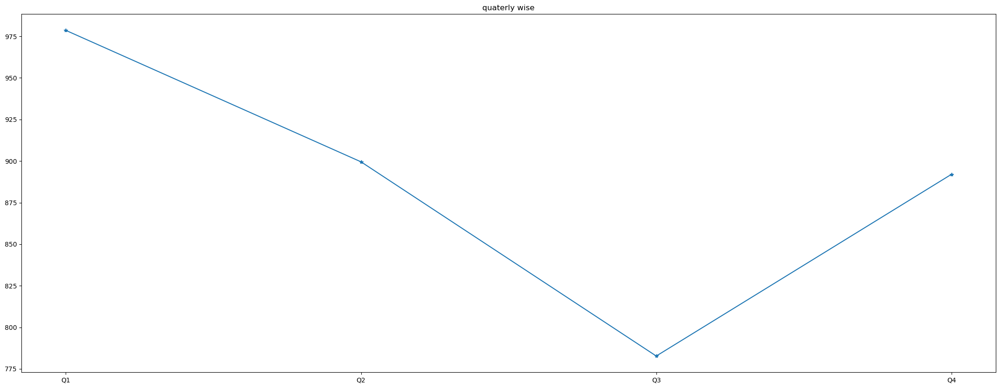

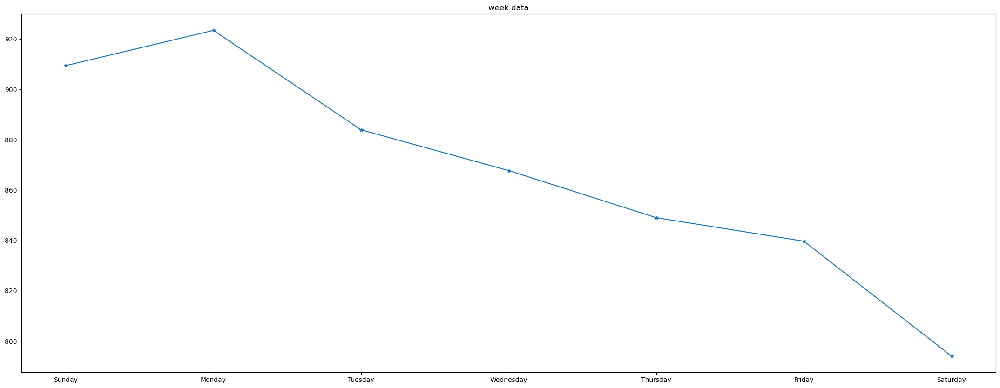

In [75]:
plot_complete_data(tsa_train["de"], is_exog = True)
# plot_complete_data(tsa_train["de"], is_weekend = True)
plot_data_monthly(tsa_train["de"], is_monthly = True, is_quater = True)
plot_data_weekly(tsa_train["de"])

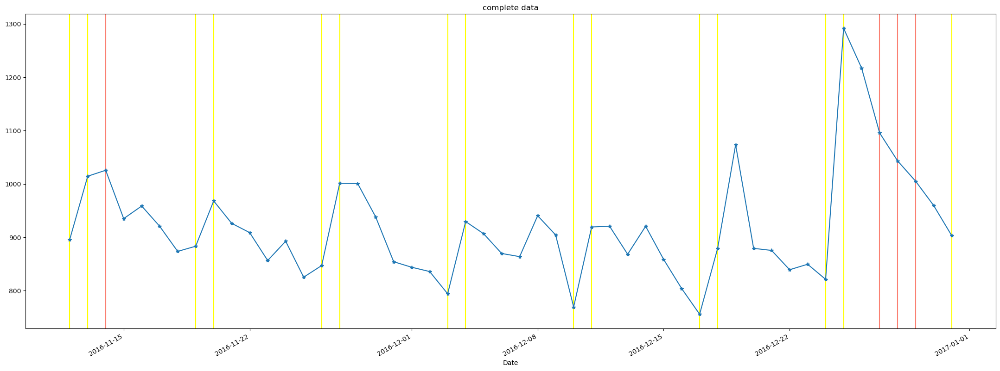

In [76]:
plot_complete_data(tsa_test["de"], is_exog = True, is_weekend = True, is_test_data = True)

#### en

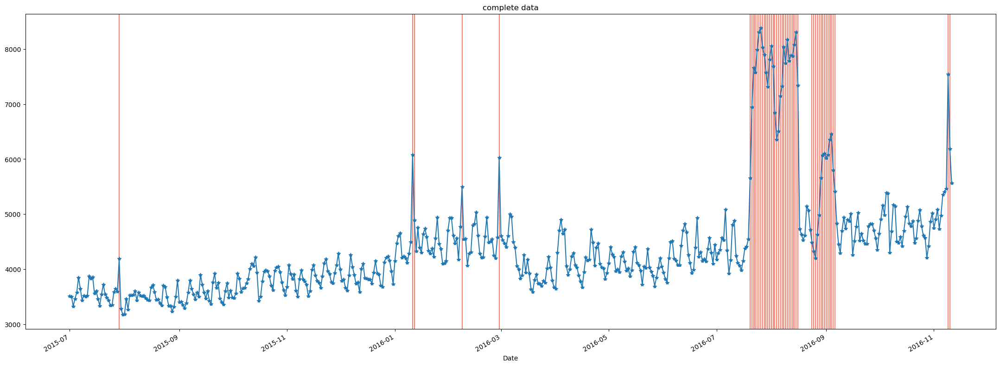

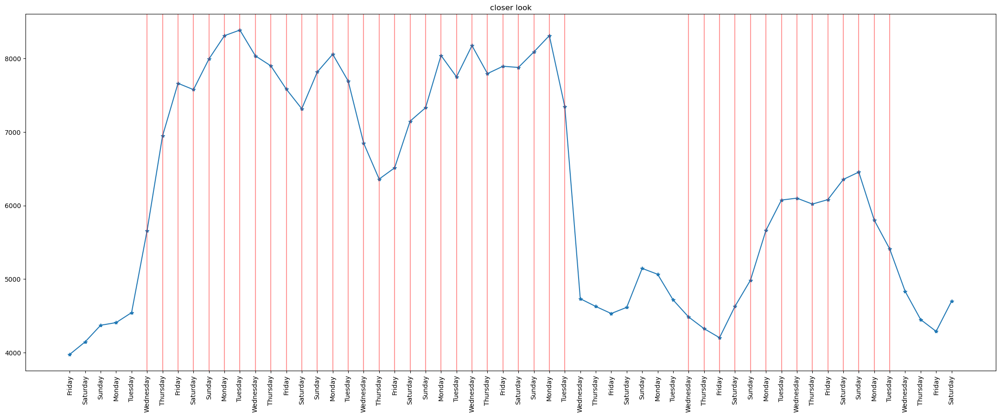

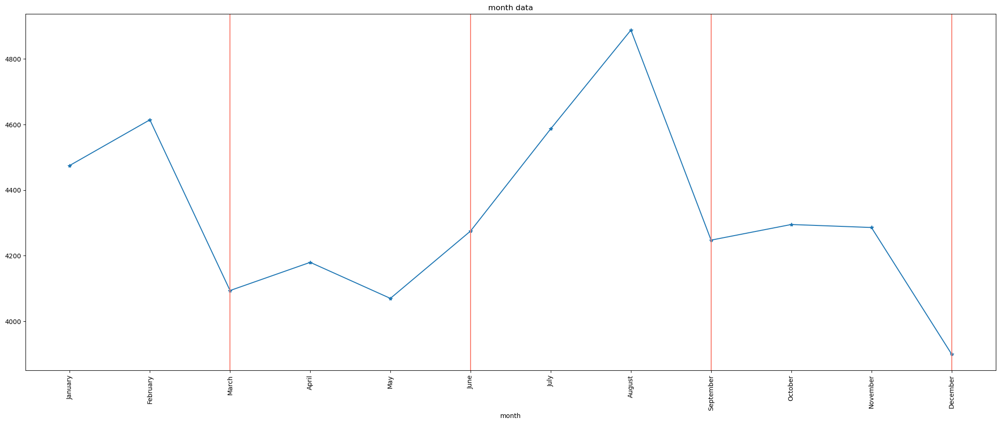

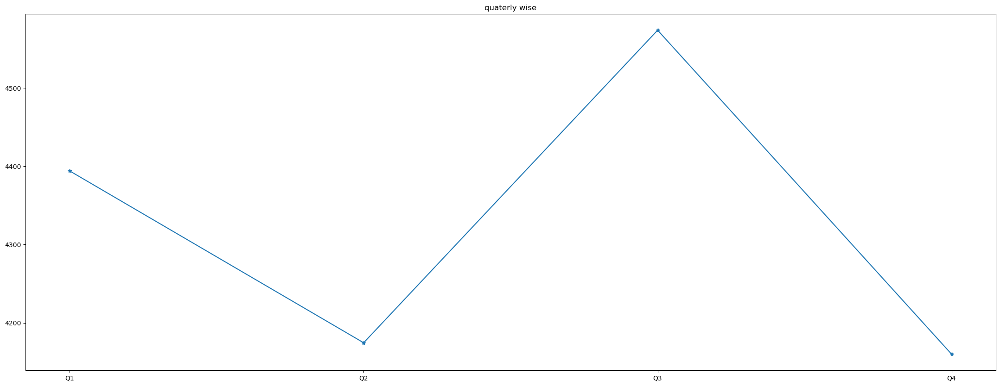

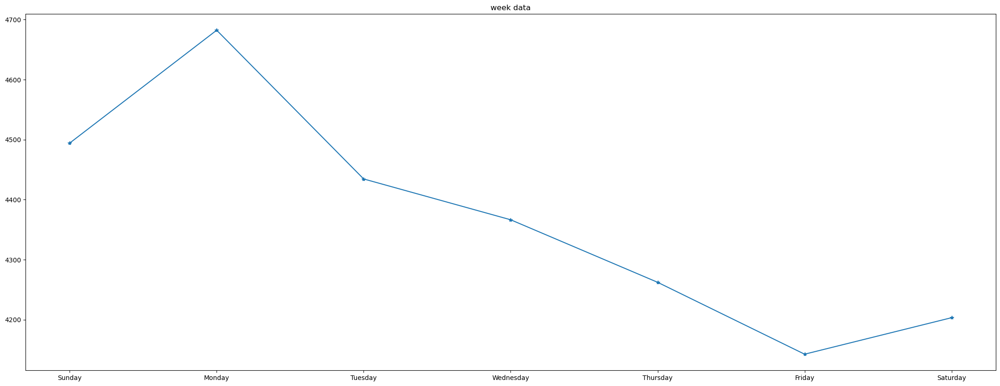

In [77]:
plot_complete_data(tsa_train["en"], is_exog = True)
# plot_complete_data(tsa_train["en"], is_weekend = True)
plot_data_monthly(tsa_train["en"], is_monthly = True, is_quater = True)
plot_data_weekly(tsa_train["en"])

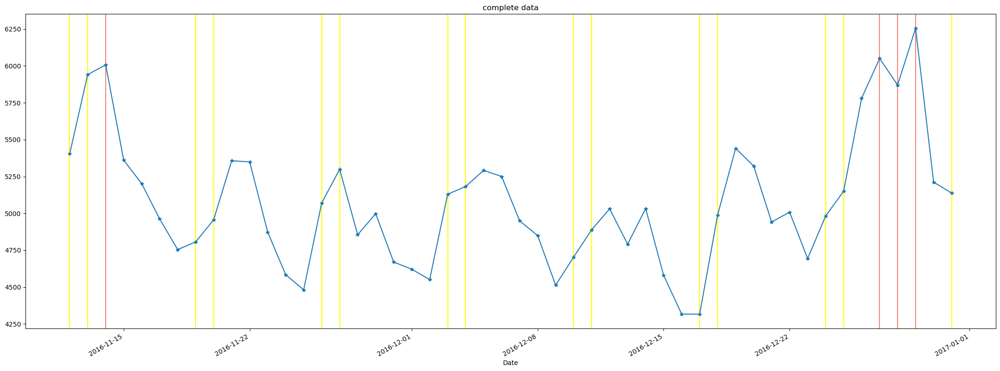

In [78]:
plot_complete_data(tsa_test["en"], is_exog = True, is_weekend = True, is_test_data = True)

#### es

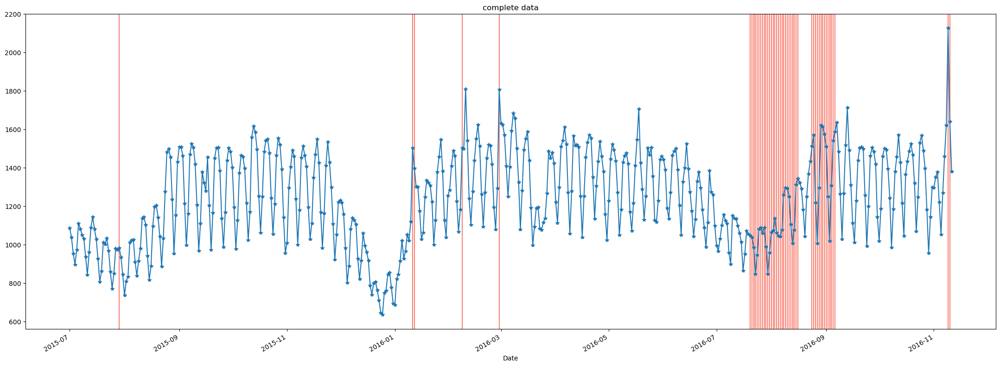

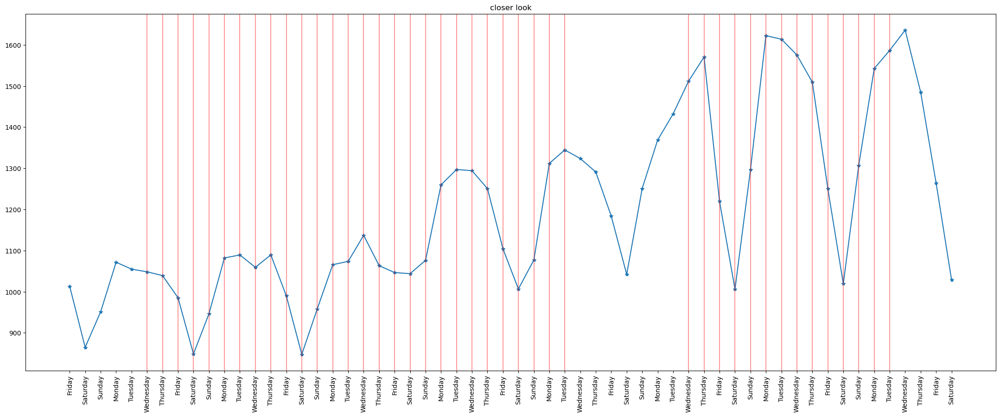

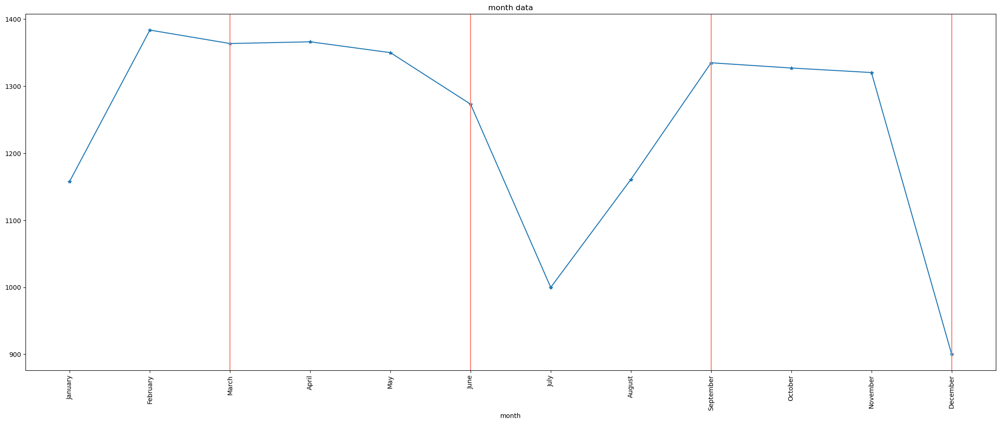

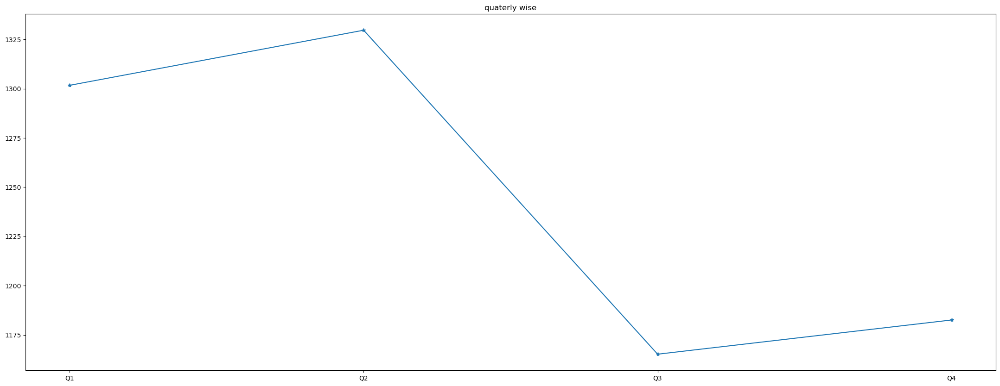

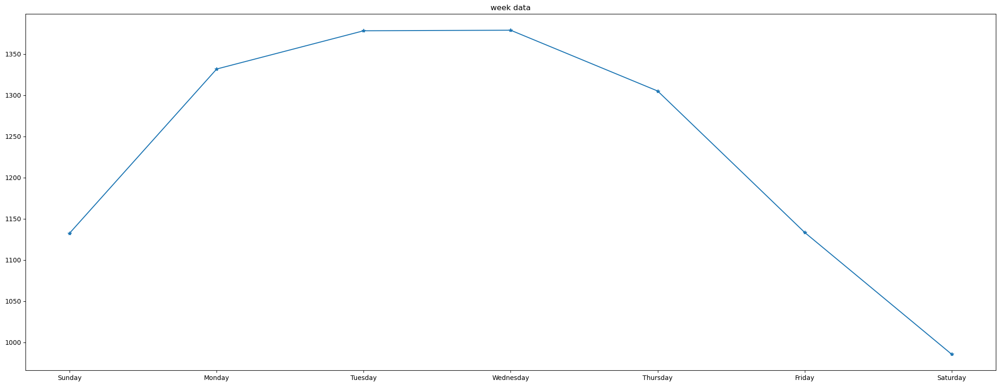

In [79]:
plot_complete_data(tsa_train["es"], is_exog = True)
# plot_complete_data(tsa_train["es"], is_weekend = True)
plot_data_monthly(tsa_train["es"], is_monthly = True, is_quater = True)
plot_data_weekly(tsa_train["es"])

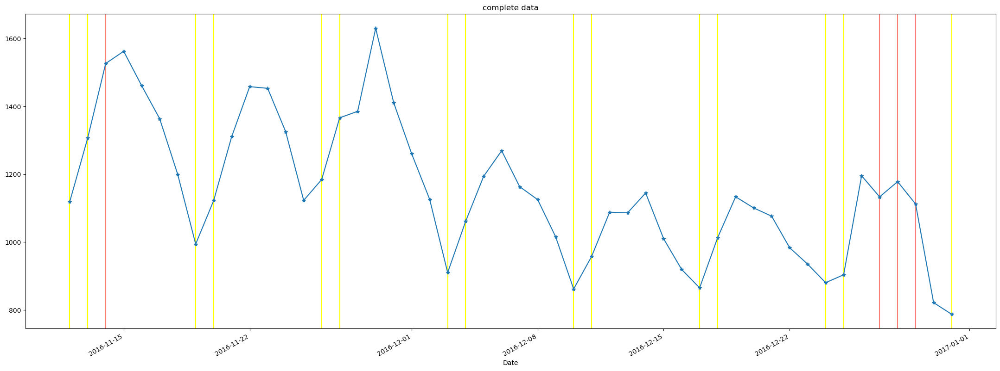

In [80]:
plot_complete_data(tsa_test["es"], is_exog = True, is_weekend = True, is_test_data = True)

#### fr

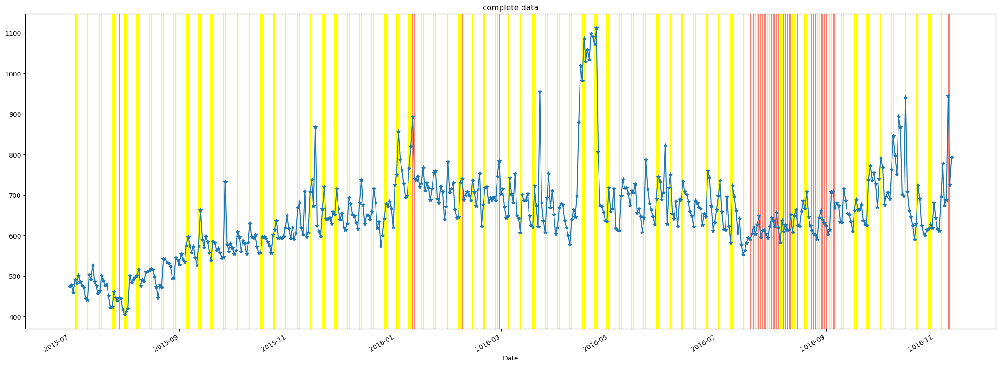

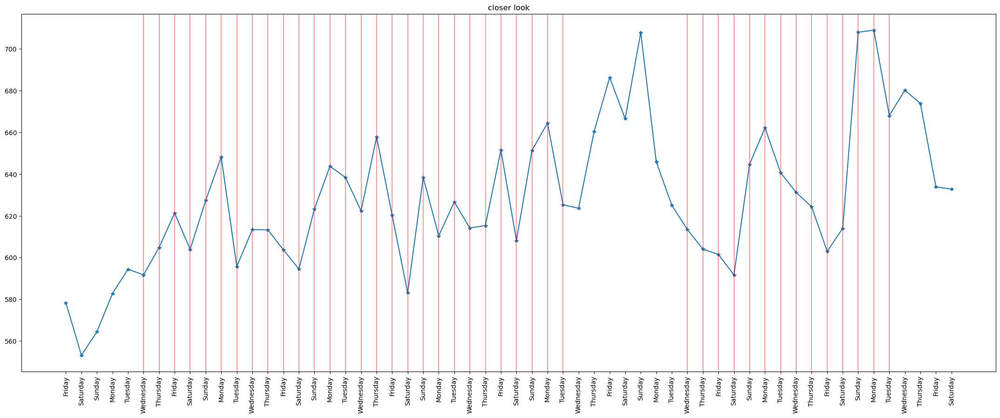

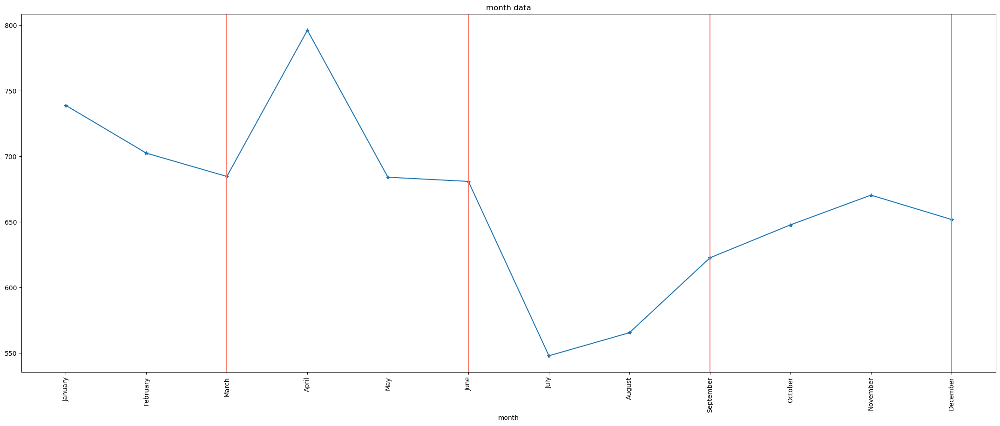

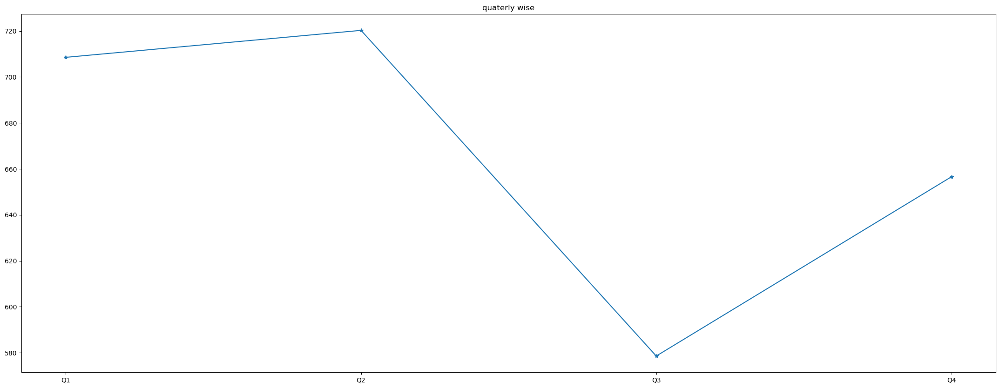

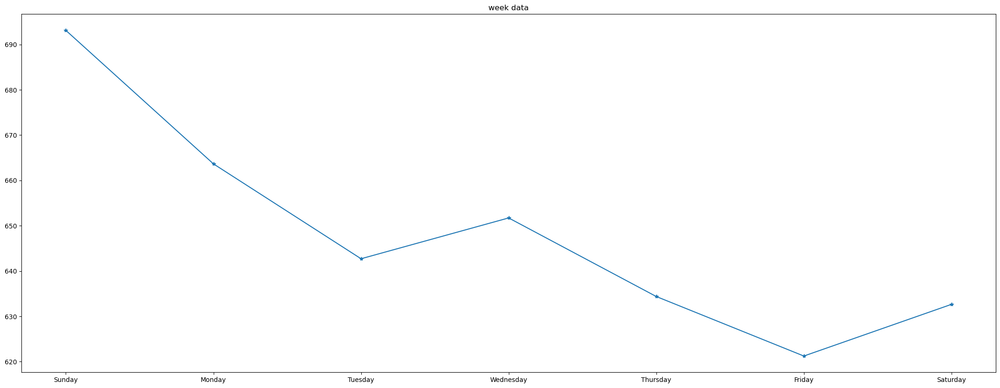

In [81]:
plot_complete_data(tsa_train["fr"], is_exog = True, is_weekend = True)
plot_data_monthly(tsa_train["fr"], is_monthly = True, is_quater = True)
plot_data_weekly(tsa_train["fr"])

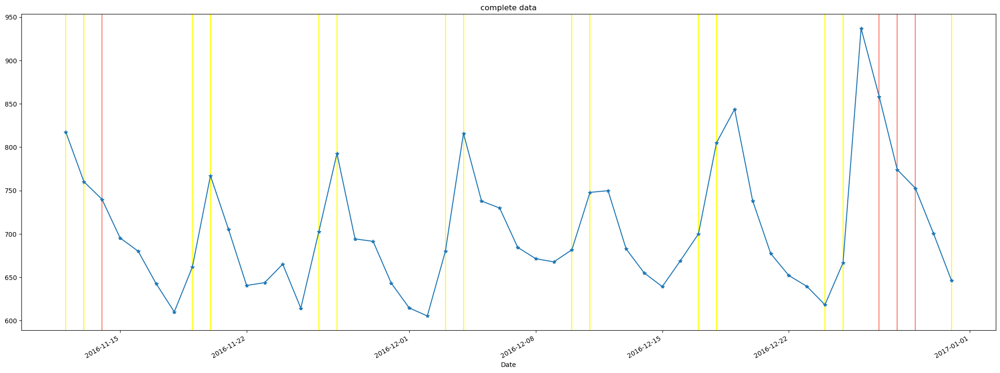

In [82]:
plot_complete_data(tsa_test["fr"], is_exog = True, is_weekend = True, is_test_data = True)

#### ja

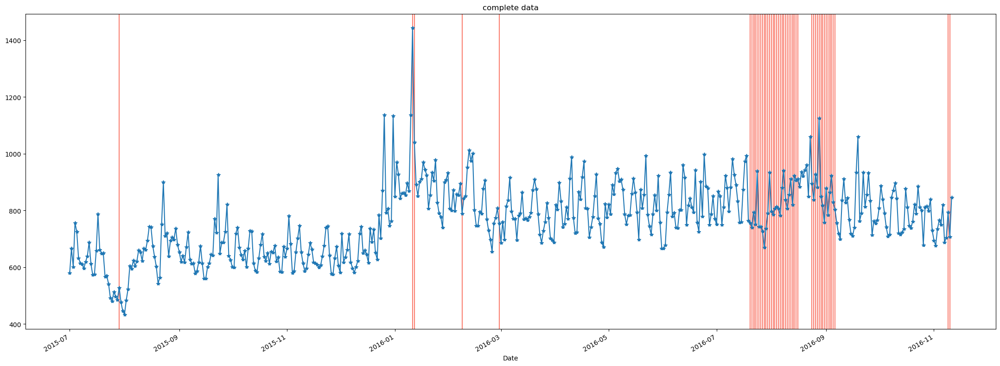

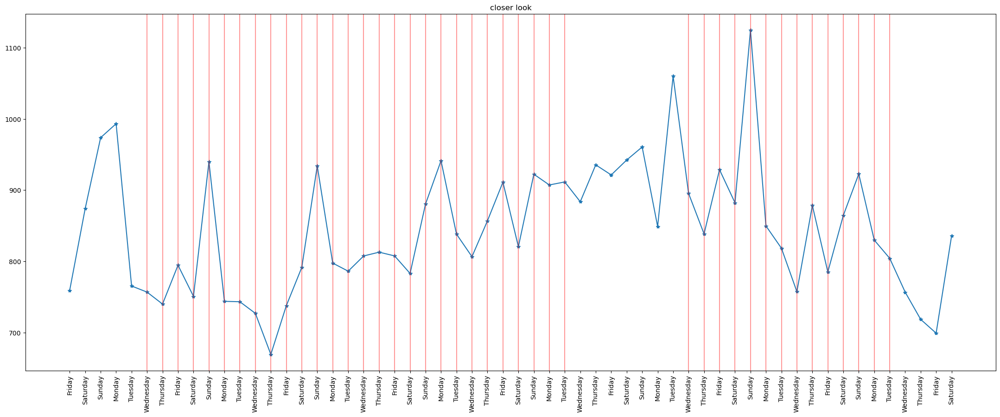

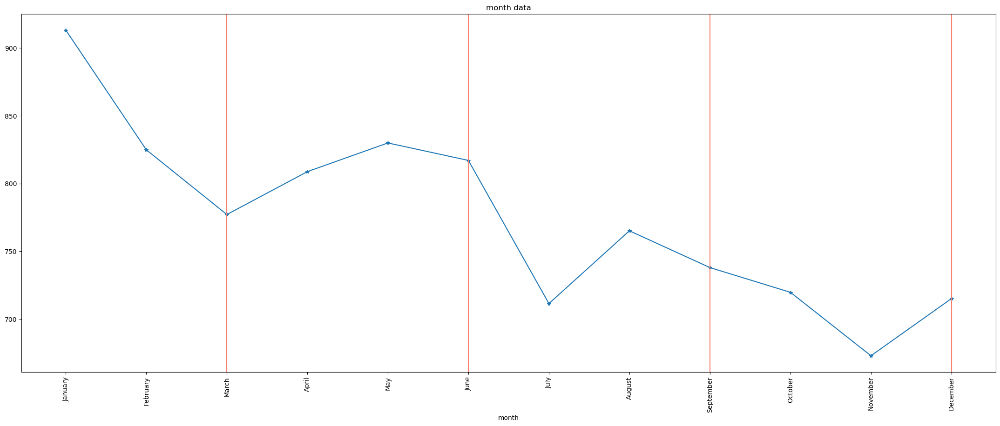

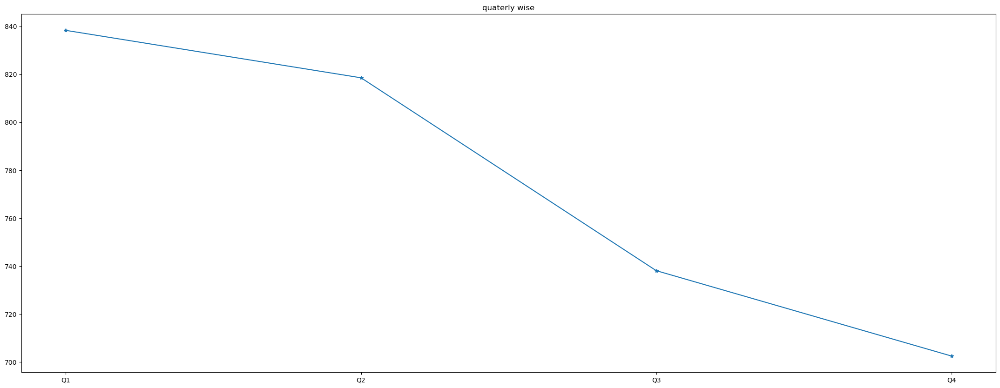

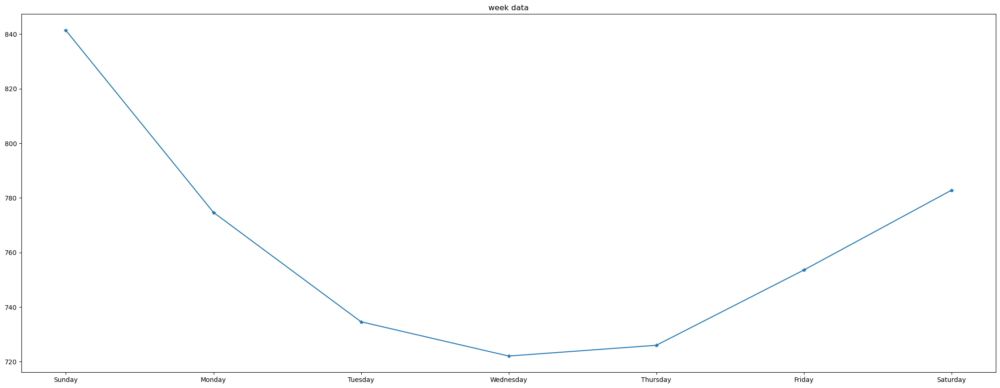

In [83]:
plot_complete_data(tsa_train["ja"], is_exog = True)
plot_data_monthly(tsa_train["ja"], is_monthly = True, is_quater = True)
plot_data_weekly(tsa_train["ja"])

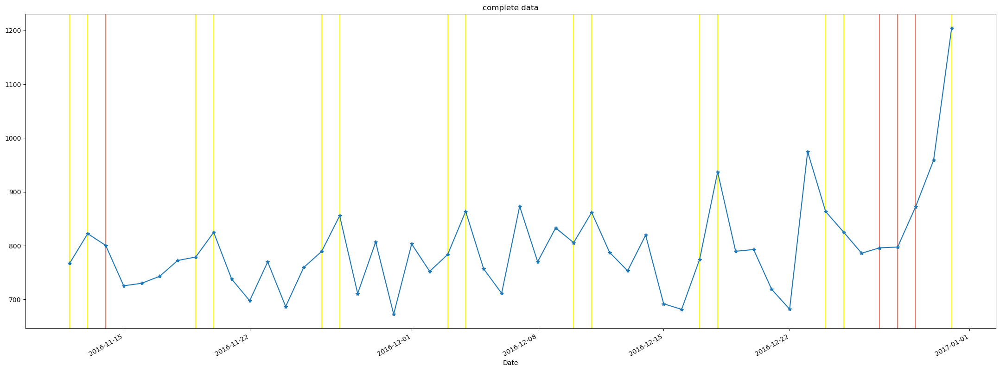

In [84]:
plot_complete_data(tsa_test["ja"], is_exog = True, is_weekend = True, is_test_data = True)

#### ru

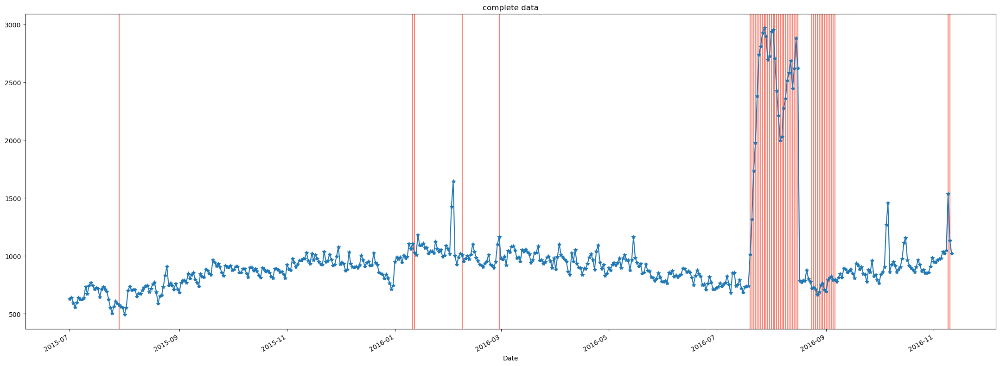

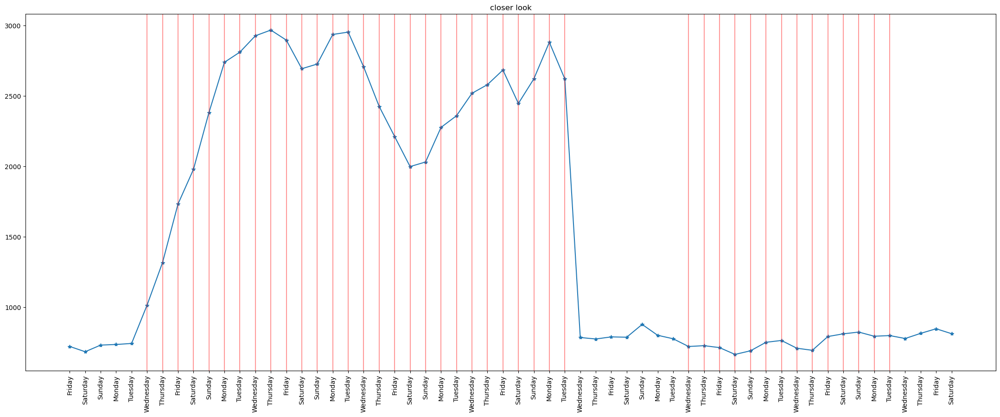

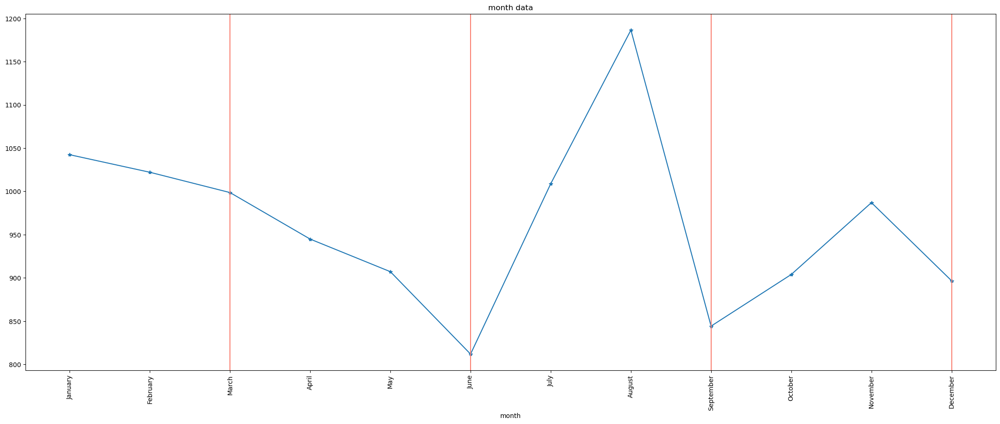

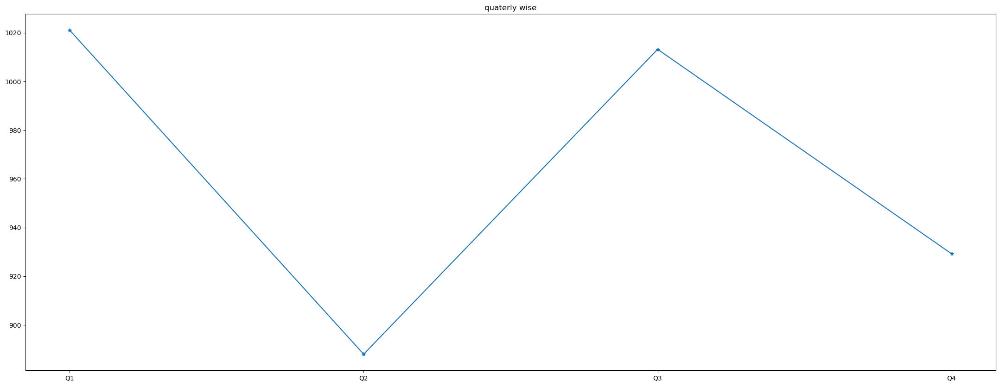

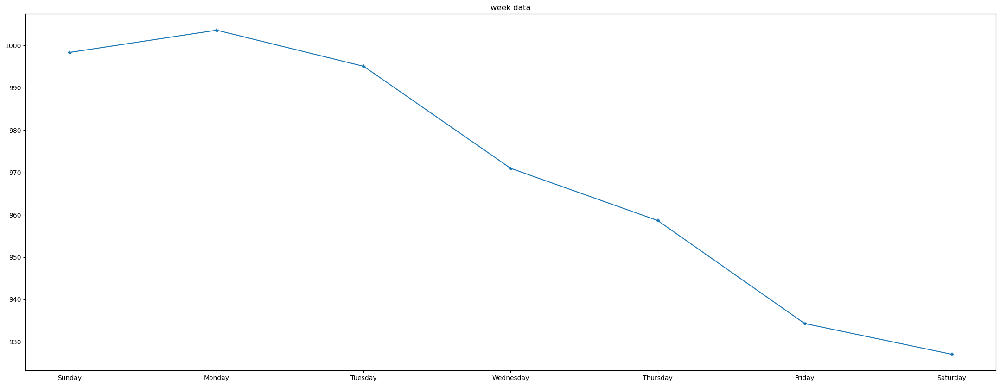

In [85]:
plot_complete_data(tsa_train["ru"], is_exog = True)
# plot_complete_data(tsa_train["ru"], is_weekend = True)
plot_data_monthly(tsa_train["ru"], is_monthly = True, is_quater = True)
plot_data_weekly(tsa_train["ru"])

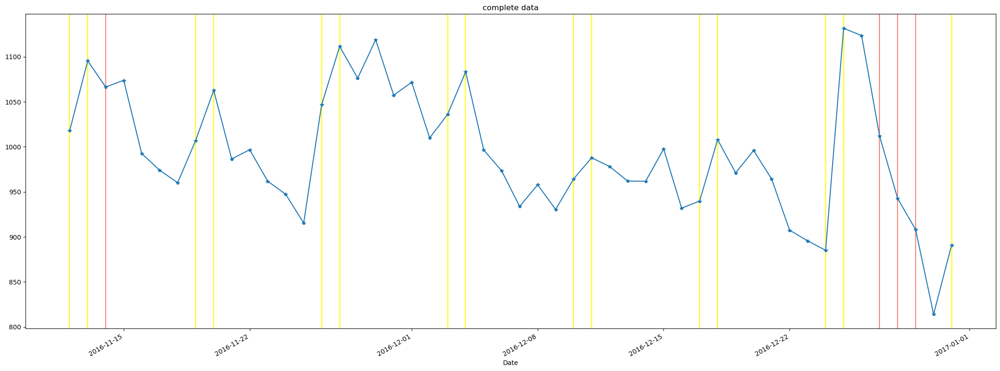

In [86]:
plot_complete_data(tsa_test["ru"], is_exog = True, is_weekend = True, is_test_data = True)

#### www

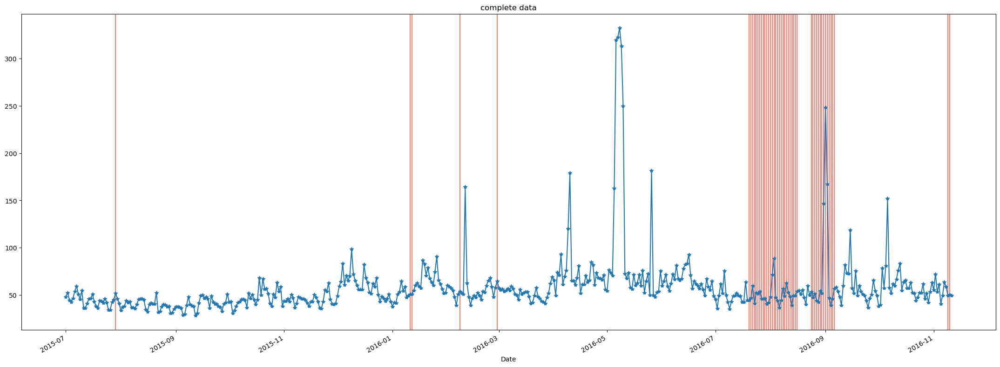

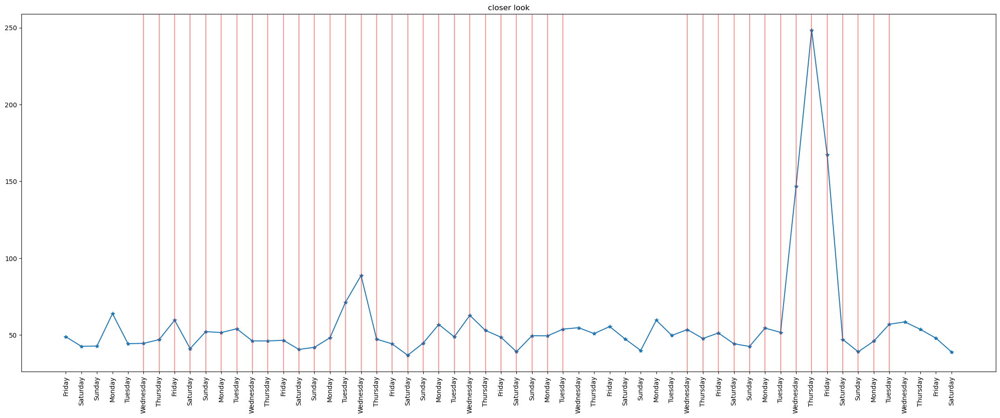

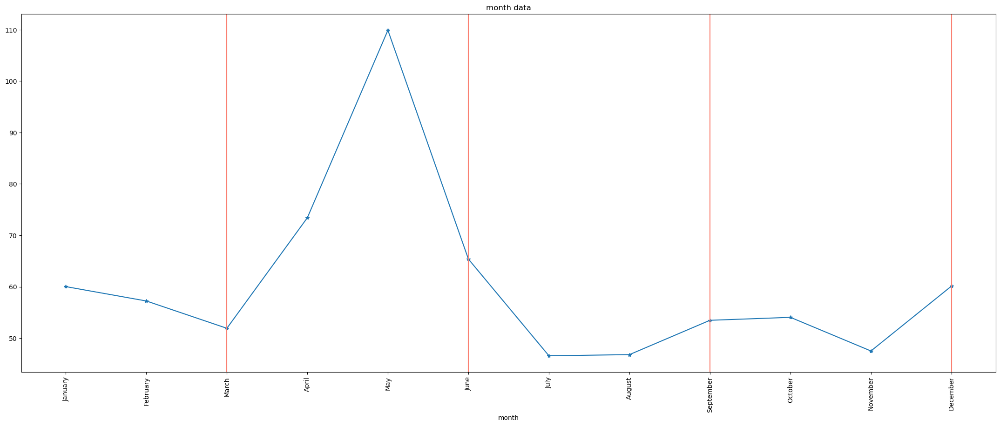

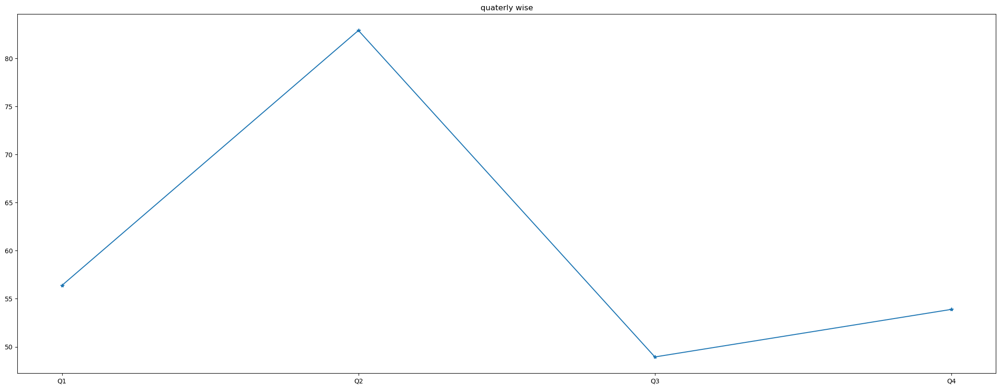

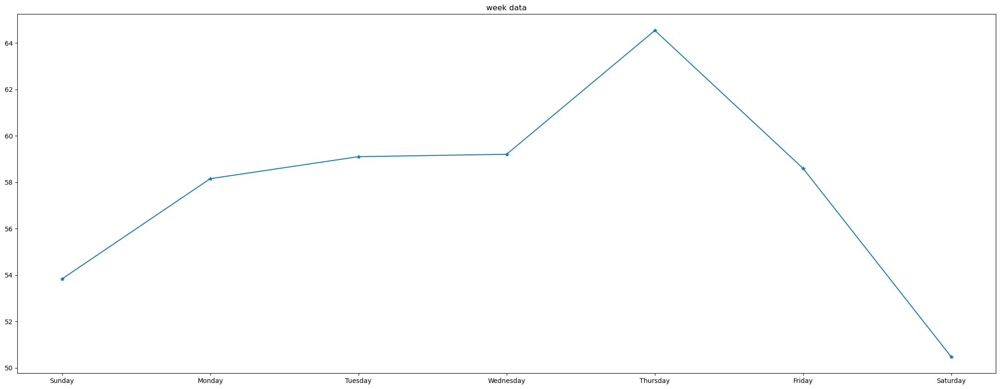

In [87]:
plot_complete_data(tsa_train["www"], is_exog = True)
# plot_complete_data(tsa_train["www"], is_weekend = True)
plot_data_monthly(tsa_train["www"], is_monthly = True, is_quater = True)
plot_data_weekly(tsa_train["www"])

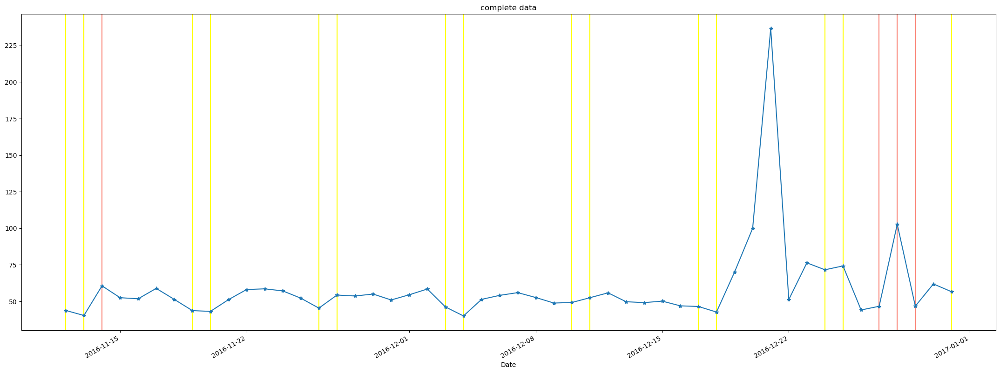

In [88]:
plot_complete_data(tsa_test["www"], is_exog = True, is_weekend = True, is_test_data = True)

#### zh

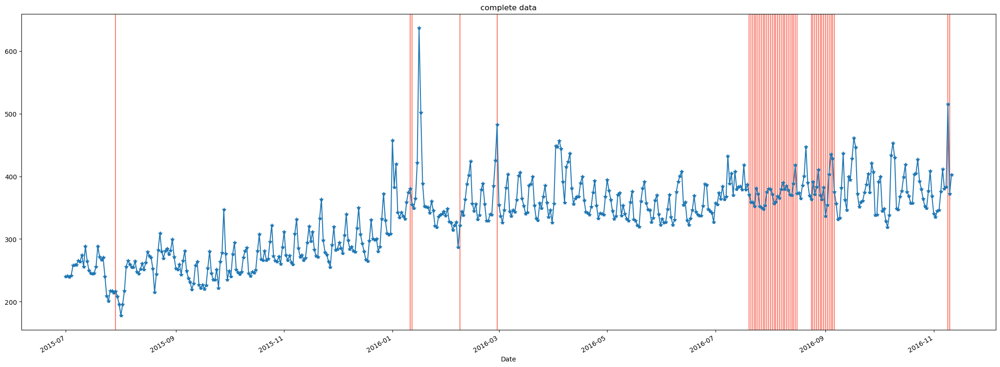

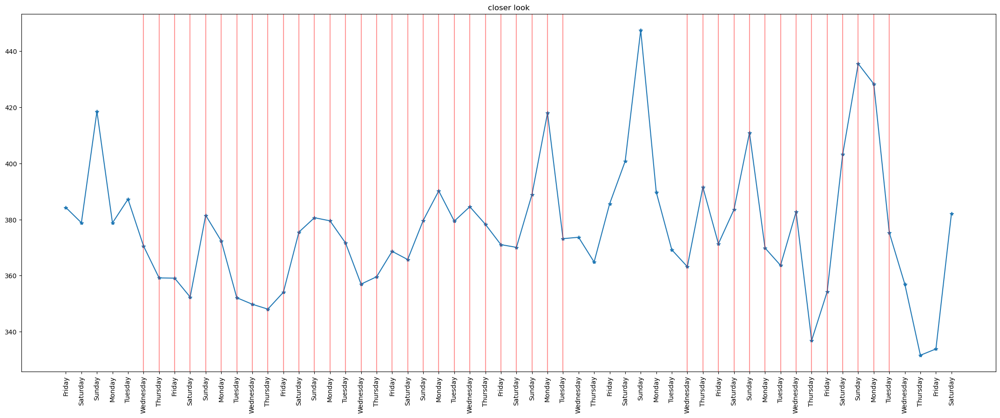

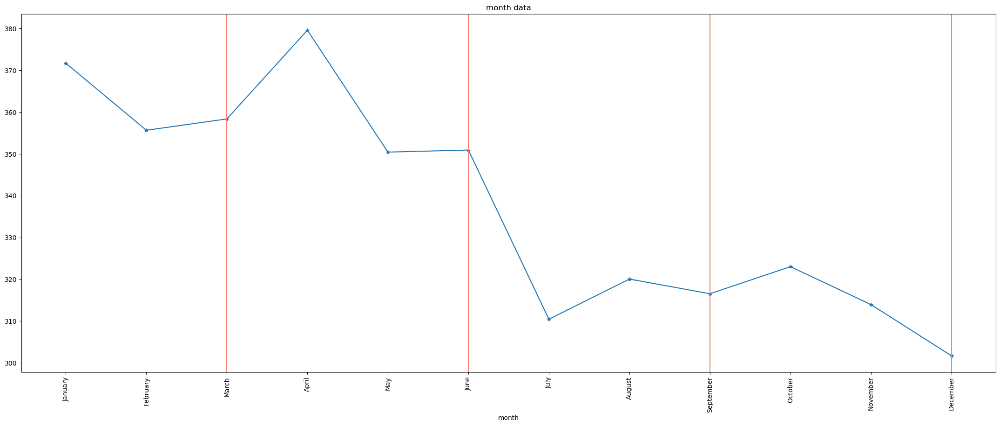

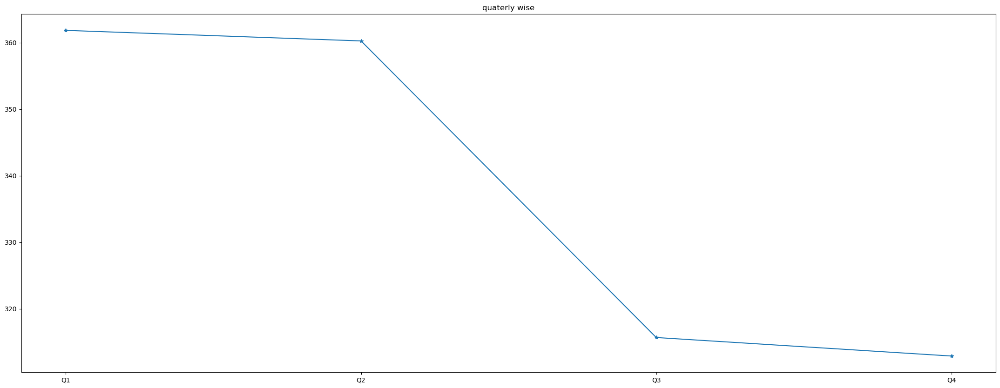

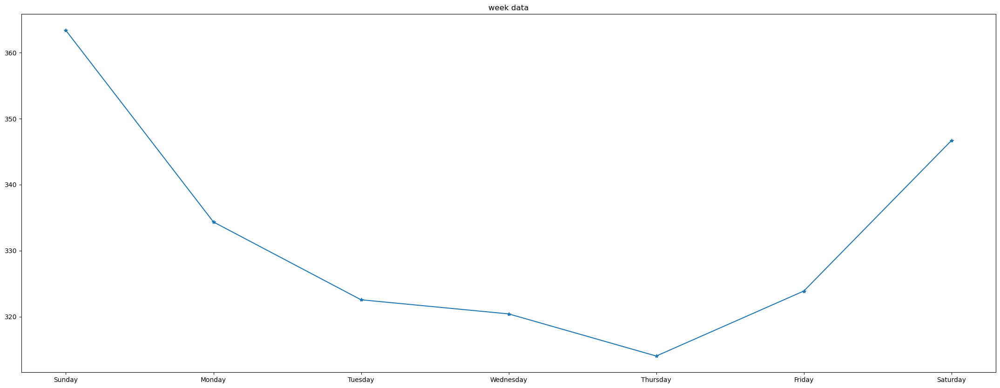

In [89]:
plot_complete_data(tsa_train["zh"], is_exog = True)
# plot_complete_data(tsa_train["zh"], is_weekend = True)
plot_data_monthly(tsa_train["zh"], is_monthly = True, is_quater = True)
plot_data_weekly(tsa_train["zh"])

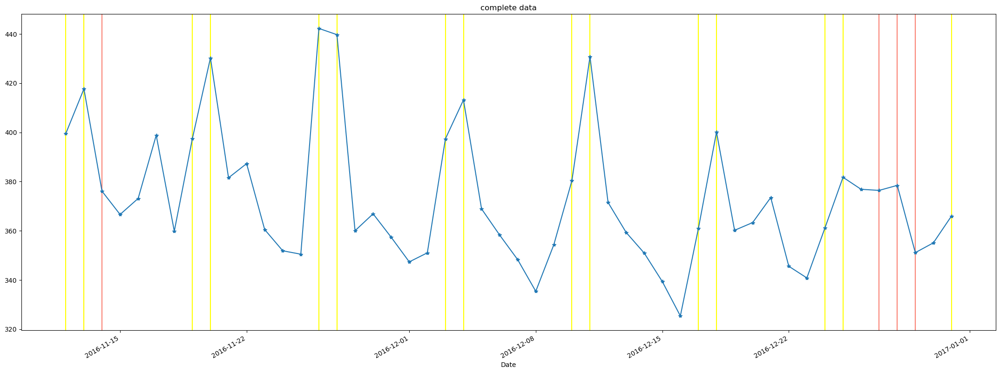

In [90]:
plot_complete_data(tsa_test["zh"], is_exog = True, is_weekend = True, is_test_data = True)

#### insights

> Commons
   - the campaign thing seems not effecting the views very much
   - it seems like the views are having weekly seasonality (views are increasing from **Sunday** (start of the week), and decresing by **Saturday** (end of week)) 
   - in **Quater-2** there are more views on average and in month of **June** there are highest views 
   - there are more number of views on **Wednesday**

> de
   - here the campaigns are showing some impact, there is some negative correlation with campaigns and view 
   - but at some points it got positive correlation, but there is negative correlation mostly
   - it seems like the views are having weekly seasonality (views are increasing from **Sunday** (start of the week), and decresing by **Saturday** (end of week)) 
   - in **Quater-1** there are more views on average and in month of **January** there are highest views 
   - there are more number of views on **Monday**

> en
  - the campaign thing seems to have postive effect with the views very much
  - in **Quater-3** there are more views on average and in month of **August** there are highest views 
  - there are more number of views on **Monday** 

> es
   - the campaign thing seems not effecting the views very much
   - it seems like the views are having weekly seasonality (views are increasing from **Sunday** (start of the week), and decresing by **Saturday** (end of week)) 
   - in **Quater-2** there are more views on average and in month of **Febraury** there are highest views 
   - there are more number of views on **Wednesday**

> fr
   - when there are continous campaigns then there is negative effect, if not then there is positive impact
   - in middle there is some sudden spike in views for some days
   - the views are increasing on **weekends**
   - in **Quater-2** there are more views on average and in month of **April** there are highest views 
   - there are more number of views on **Sunday**

> ja
   - the campaigns are showing negative impact
   - there are more views on **weekends**
   - in **Quater-1** there are more views on average and in month of **January** there are highest views 
   - there are more number of views on **Sunday**

> ru
   - the campaigns are not showing any impact, but the views boosted suddenly with heavy campaigns but they're reduced again even with campaigns
   - the pages got more views on **weekstart**
   - in **Quater-1** there are more views on average and in month of **August** there are highest views 
   - there are more number of views on **Sunday**

> www
   -  most of the campaigns showed negative impact
   - it seems like the views are having weekly seasonality (views are increasing from **Sunday** (start of the week), and decresing by **Saturday** (end of week)) 
   - in **Quater-2** there are more views on average and in month of **May** there are highest views 
   - there are more number of views on **Thursday**

> zh 
   - the campaigns got no much impact
   - there are more views on **weekends**
   - in **Quater-1** there are more views on average and in month of **April** there are highest views 
   - there are more number of views on **Sunday**


### Model

In [91]:
adfuller_test(tsa_train["en"].Adviews)
tsa_train["en"].Adviews

Sequence is not stationary


Date
2015-07-01    3513.862203
2015-07-02    3502.540258
2015-07-03    3325.387138
2015-07-04    3462.089869
2015-07-05    3575.560857
                 ...     
2016-11-07    5406.996244
2016-11-08    5462.196339
2016-11-09    7542.380012
2016-11-10     6188.24109
2016-11-11    5563.481242
Name: Adviews, Length: 500, dtype: object

In [92]:
adfuller_test(tsa_train["en"].Adviews.diff(1)[1:])

Sequence is stationary


#### Seasonal check

<Axes: xlabel='Date'>

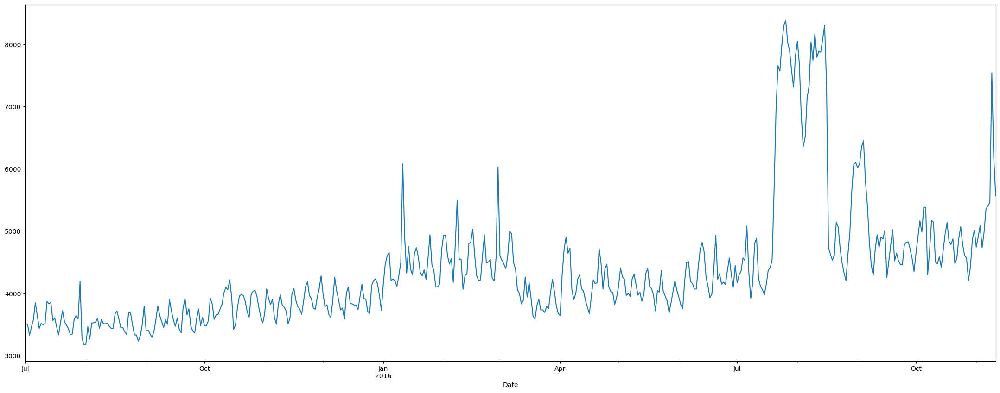

In [93]:
tsa_train["en"].Adviews.plot()

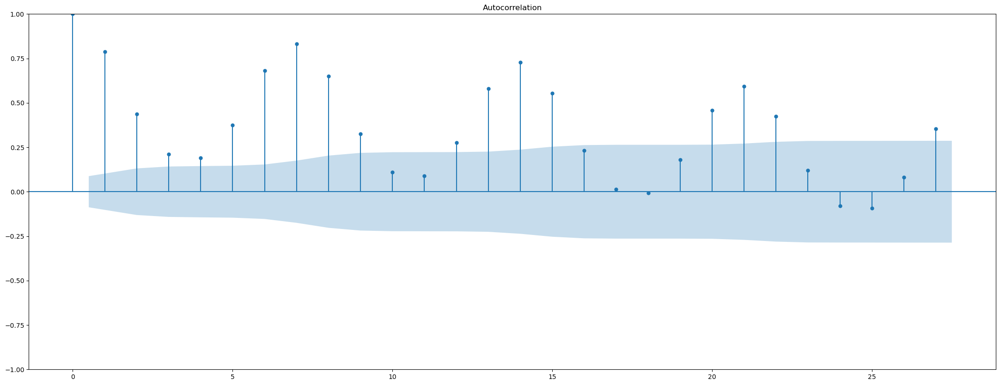

In [171]:
plot_acf(tsa_train["es"].Adviews);

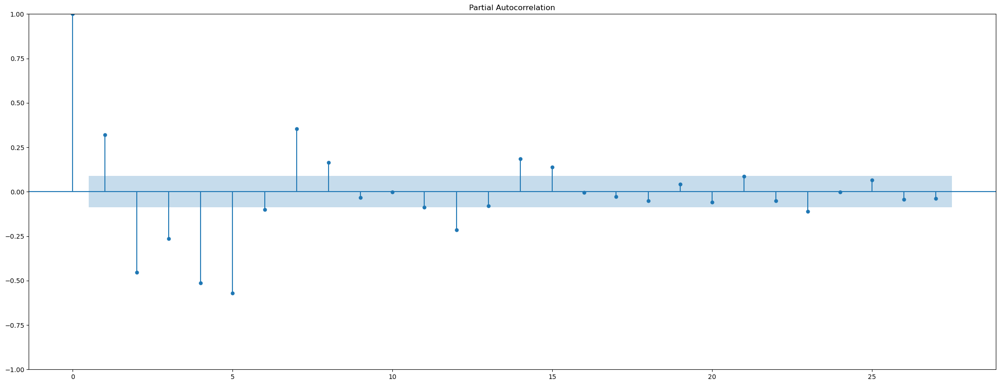

In [172]:
plot_pacf(tsa_train["es"].Adviews.diff(1).dropna());

#### SARIMAX

In [126]:
model = SARIMAX(tsa_train["en"]["Adviews"].astype("float"), order = (7,1,7), seasonal_order = (1,1,1,14))
model = model.fit(disp=False)

In [127]:
pred = model.forecast(steps = tsa_test["en"].shape[0])

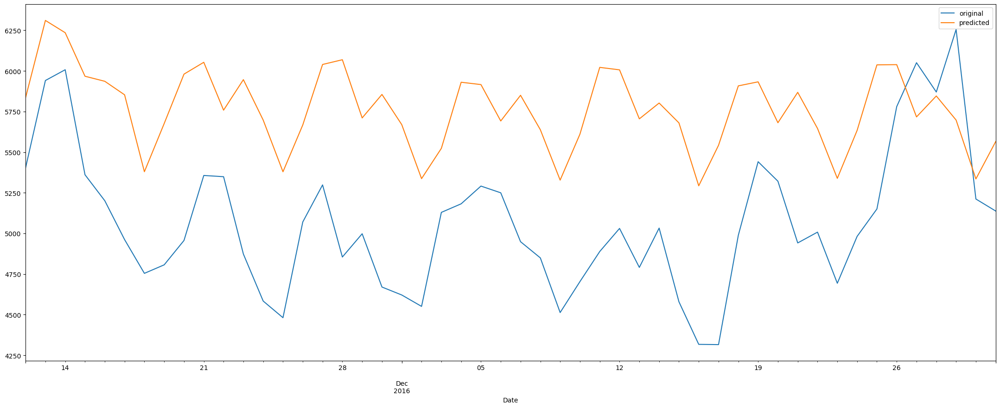

In [128]:
tsa_test["en"].Adviews.plot(label = "original")
pred.plot(label = "predicted")
plt.legend()
plt.show()

In [129]:
performance(tsa_test["en"].Adviews, pred)

MAE : 724.379
RMSE : 780.879
MAPE: 0.147


In [154]:
model = SARIMAX(tsa_train["en"].Adviews.astype("float"), exog = tsa_train["en"].exog, order = (6,1,6), seasonal_order = (2,1,2,14), enforce_invertibility=False)
model = model.fit(disp=False)

# model.forecast(steps=12)

In [155]:
exog_forecast = tsa_test["en"].exog
pred = model.predict(tsa_test["en"].index[0],tsa_test["en"].index[-1],exog = exog_forecast).rename('Forecast')

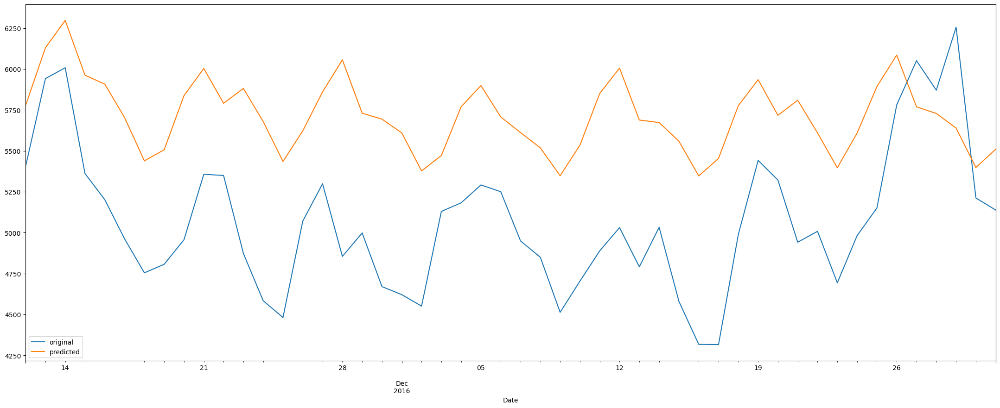

In [156]:
tsa_test["en"].Adviews.plot(label = "original")
pred.plot(label = "predicted")
plt.legend()
plt.show()

In [157]:
performance(tsa_test["en"].Adviews, pred)

MAE : 678.288
RMSE : 727.516
MAPE: 0.138


#### pmdarima

In [103]:
model = pm.auto_arima(tsa_train["en"].Adviews, seasonal = True, m = 7)
forecasts = model.predict(tsa_test["en"].shape[0]) 

performance(tsa_test["en"].Adviews, forecasts)

MAE : 945.49
RMSE : 1015.664
MAPE: 0.193


#### Prohpet model

##### model 1

------------------------------------------------------------------------------------------------------------------------------------------------------
commons
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,108.083468,Wednesday,7,2015,0
2015-07-02,111.695785,Thursday,7,2015,0
2015-07-03,109.05437,Friday,7,2015,0
2015-07-04,90.206273,Saturday,7,2015,0
2015-07-05,100.332196,Sunday,7,2015,0


23:06:51 - cmdstanpy - INFO - Chain [1] start processing
23:06:51 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------


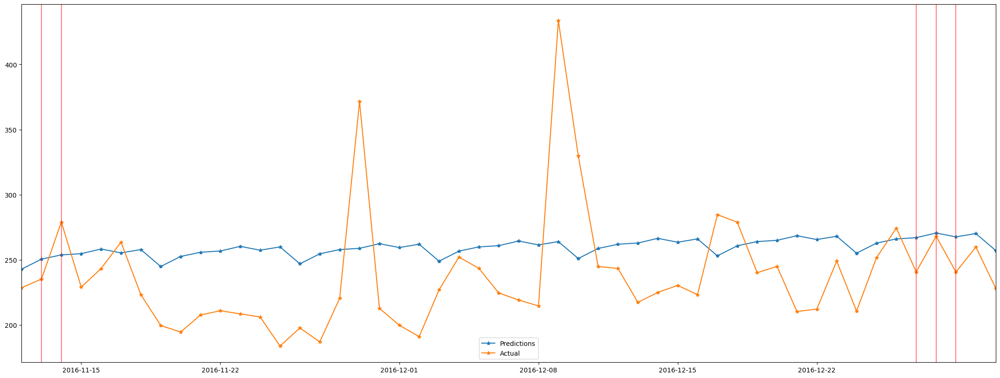

MAE : 39.215
RMSE : 48.665
MAPE: 0.167
------------------------------------------------------------------------------------------------------------------------------------------------------
de
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,714.968405,Wednesday,7,2015,0
2015-07-02,705.240535,Thursday,7,2015,0
2015-07-03,676.883812,Friday,7,2015,0
2015-07-04,621.151996,Saturday,7,2015,0
2015-07-05,722.081525,Sunday,7,2015,0


23:06:51 - cmdstanpy - INFO - Chain [1] start processing
23:06:51 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------


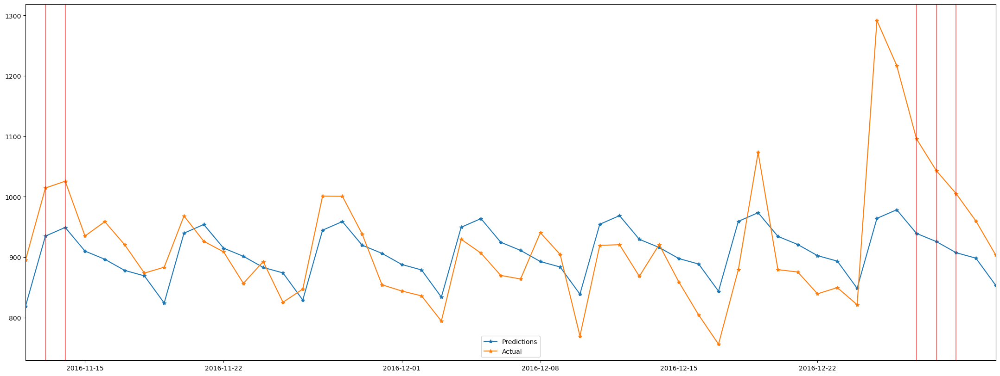

MAE : 60.92
RMSE : 81.742
MAPE: 0.063
------------------------------------------------------------------------------------------------------------------------------------------------------
en
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,3513.862203,Wednesday,7,2015,0
2015-07-02,3502.540258,Thursday,7,2015,0
2015-07-03,3325.387138,Friday,7,2015,0
2015-07-04,3462.089869,Saturday,7,2015,0
2015-07-05,3575.560857,Sunday,7,2015,0


23:06:51 - cmdstanpy - INFO - Chain [1] start processing
23:06:51 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------


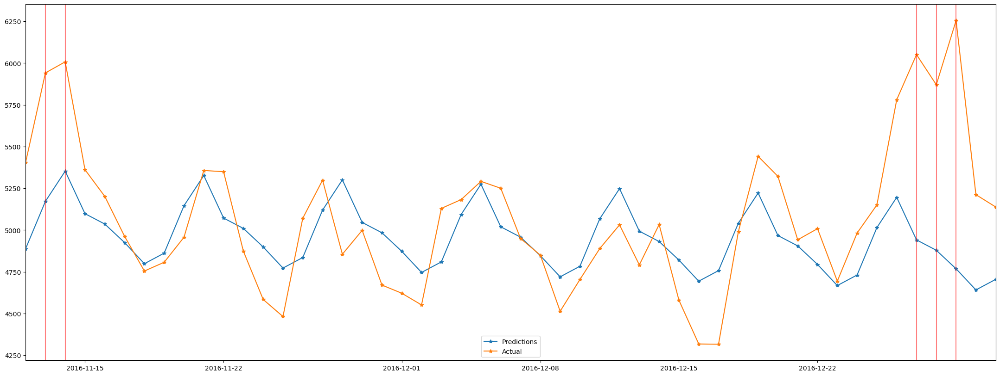

MAE : 291.808
RMSE : 412.815
MAPE: 0.055
------------------------------------------------------------------------------------------------------------------------------------------------------
es
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,1085.972919,Wednesday,7,2015,0
2015-07-02,1037.82891,Thursday,7,2015,0
2015-07-03,954.431796,Friday,7,2015,0
2015-07-04,896.069961,Saturday,7,2015,0
2015-07-05,974.515374,Sunday,7,2015,0


23:06:52 - cmdstanpy - INFO - Chain [1] start processing
23:06:52 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------


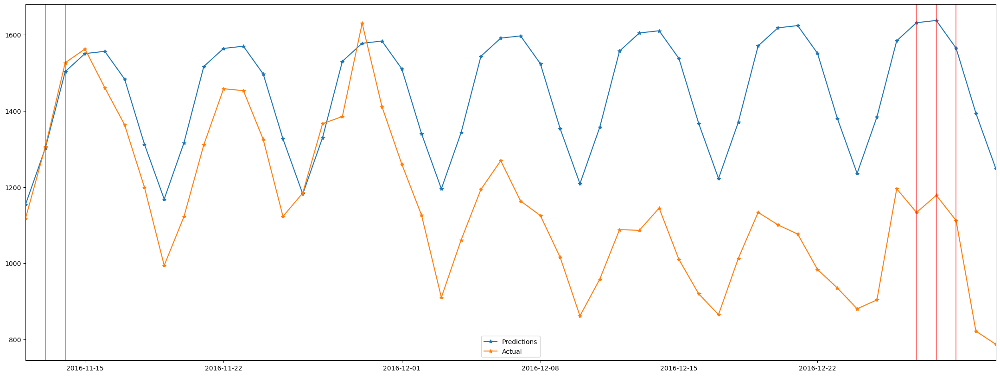

MAE : 298.565
RMSE : 345.403
MAPE: 0.285
------------------------------------------------------------------------------------------------------------------------------------------------------
fr
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,475.150994,Wednesday,7,2015,0
2015-07-02,478.20396,Thursday,7,2015,0
2015-07-03,459.840994,Friday,7,2015,0
2015-07-04,491.515491,Saturday,7,2015,0
2015-07-05,482.563026,Sunday,7,2015,0


23:06:52 - cmdstanpy - INFO - Chain [1] start processing
23:06:52 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------


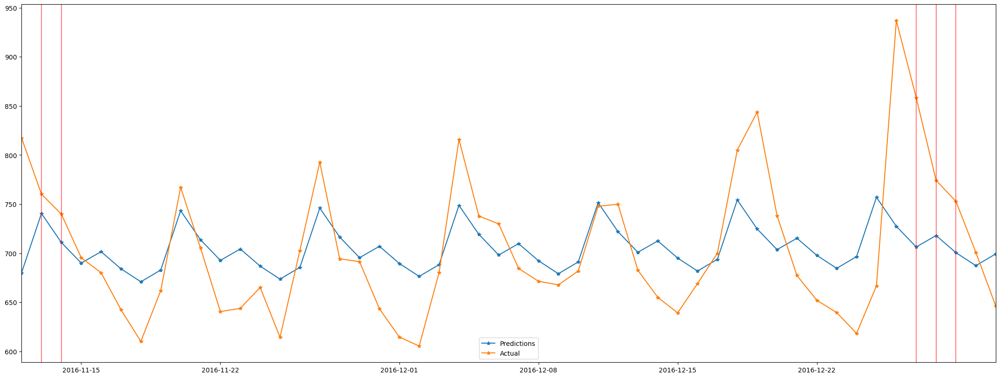

MAE : 45.496
RMSE : 60.632
MAPE: 0.063
------------------------------------------------------------------------------------------------------------------------------------------------------
ja
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,580.647056,Wednesday,7,2015,0
2015-07-02,666.674242,Thursday,7,2015,0
2015-07-03,602.292113,Friday,7,2015,0
2015-07-04,756.514843,Saturday,7,2015,0
2015-07-05,725.731734,Sunday,7,2015,0


23:06:53 - cmdstanpy - INFO - Chain [1] start processing
23:06:53 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------


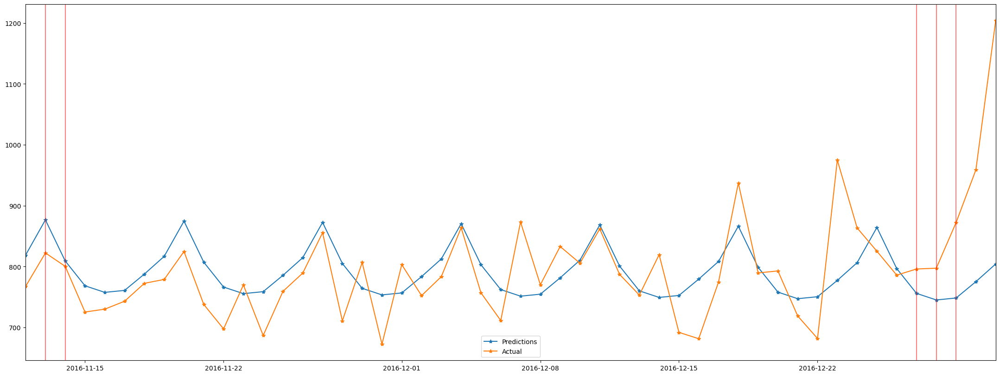

MAE : 56.513
RMSE : 85.034
MAPE: 0.068
------------------------------------------------------------------------------------------------------------------------------------------------------
ru
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,629.999601,Wednesday,7,2015,0
2015-07-02,640.905259,Thursday,7,2015,0
2015-07-03,594.028143,Friday,7,2015,0
2015-07-04,558.732475,Saturday,7,2015,0
2015-07-05,595.032932,Sunday,7,2015,0


23:06:53 - cmdstanpy - INFO - Chain [1] start processing
23:06:53 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------


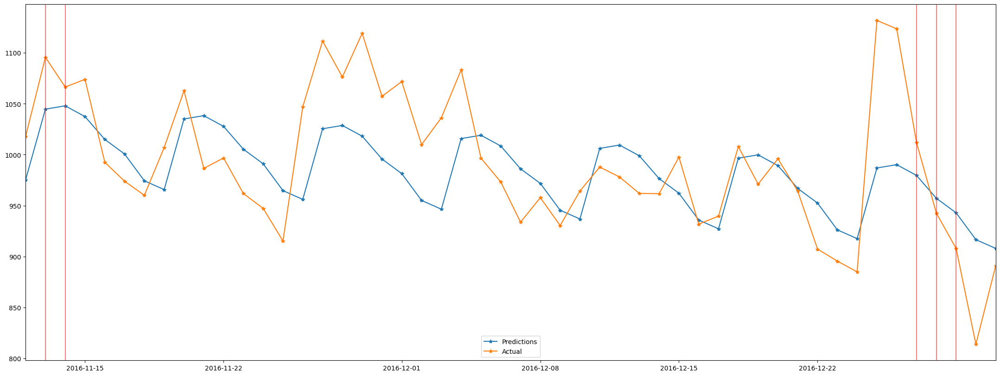

MAE : 42.94
RMSE : 53.406
MAPE: 0.043
------------------------------------------------------------------------------------------------------------------------------------------------------
www
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,47.90589,Wednesday,7,2015,0
2015-07-02,52.573963,Thursday,7,2015,0
2015-07-03,44.649614,Friday,7,2015,0
2015-07-04,42.331571,Saturday,7,2015,0
2015-07-05,46.391209,Sunday,7,2015,0


23:06:53 - cmdstanpy - INFO - Chain [1] start processing
23:06:53 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------


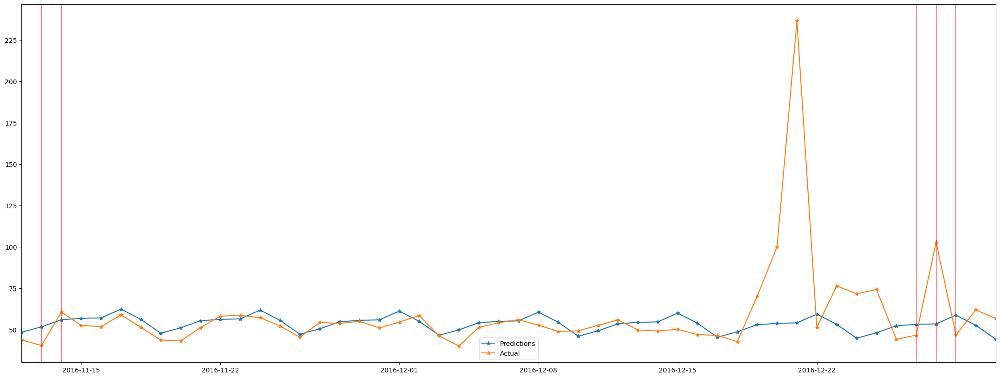

MAE : 11.747
RMSE : 28.855
MAPE: 0.147
------------------------------------------------------------------------------------------------------------------------------------------------------
zh
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,240.582042,Wednesday,7,2015,0
2015-07-02,240.971125,Thursday,7,2015,0
2015-07-03,239.358622,Friday,7,2015,0
2015-07-04,241.667788,Saturday,7,2015,0
2015-07-05,257.791433,Sunday,7,2015,0


23:06:54 - cmdstanpy - INFO - Chain [1] start processing
23:06:54 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------


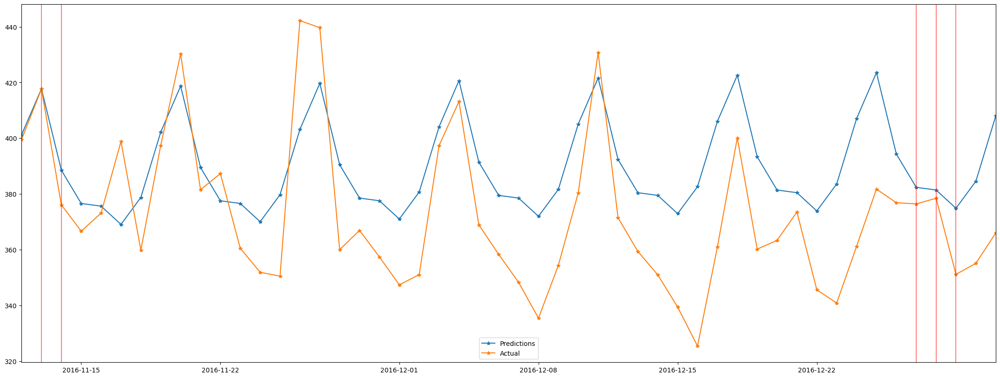

MAE : 22.014
RMSE : 25.683
MAPE: 0.061


In [104]:
prophet_model_used = {}
prophet_model_score = {}
for language in languages:
    print(f"{'-'*150}")
    print(f"{language}")
    print(f"{'-'*150}")
    display(tsa_train[language].head())

    model, forecast, mape_score =  prophet_model(train = tsa_train[language], test = tsa_test[language], period = tsa_test[language].shape[0], is_exog = False, is_parameter = False, is_plot = True)
    prophet_model_score[language] = mape_score
    prophet_model_used[language] = [{"is_exog" : False, "is_parameter" : False}]
    

##### model 2

------------------------------------------------------------------------------------------------------------------------------------------------------
commons
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,108.083468,Wednesday,7,2015,0
2015-07-02,111.695785,Thursday,7,2015,0
2015-07-03,109.05437,Friday,7,2015,0
2015-07-04,90.206273,Saturday,7,2015,0
2015-07-05,100.332196,Sunday,7,2015,0


23:06:54 - cmdstanpy - INFO - Chain [1] start processing
23:06:54 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


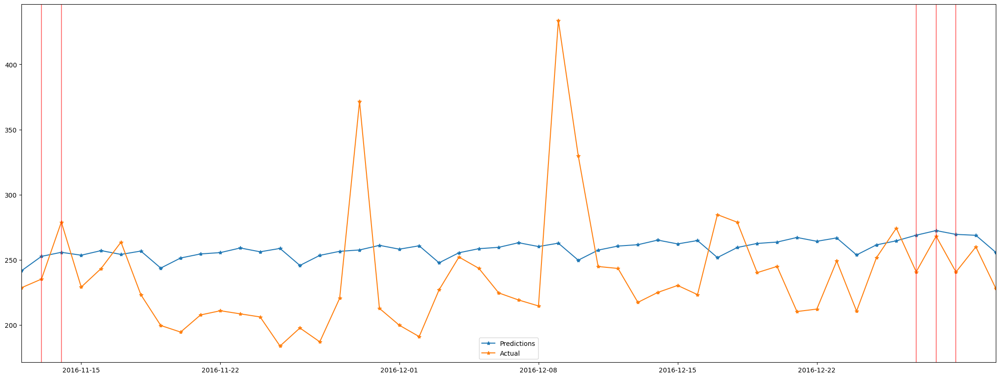

MAE : 38.543
RMSE : 48.192
MAPE: 0.164
------------------------------------------------------------------------------------------------------------------------------------------------------
de
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,714.968405,Wednesday,7,2015,0
2015-07-02,705.240535,Thursday,7,2015,0
2015-07-03,676.883812,Friday,7,2015,0
2015-07-04,621.151996,Saturday,7,2015,0
2015-07-05,722.081525,Sunday,7,2015,0


23:06:54 - cmdstanpy - INFO - Chain [1] start processing
23:06:54 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


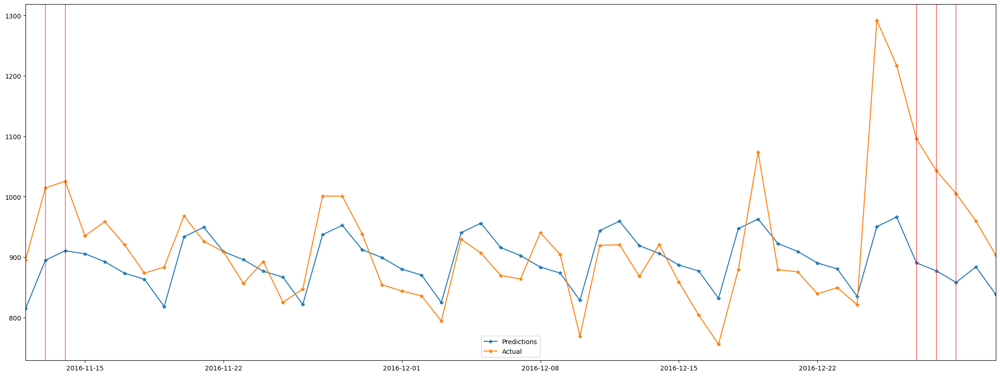

MAE : 63.957
RMSE : 89.317
MAPE: 0.066
------------------------------------------------------------------------------------------------------------------------------------------------------
en
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,3513.862203,Wednesday,7,2015,0
2015-07-02,3502.540258,Thursday,7,2015,0
2015-07-03,3325.387138,Friday,7,2015,0
2015-07-04,3462.089869,Saturday,7,2015,0
2015-07-05,3575.560857,Sunday,7,2015,0


23:06:55 - cmdstanpy - INFO - Chain [1] start processing
23:06:55 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


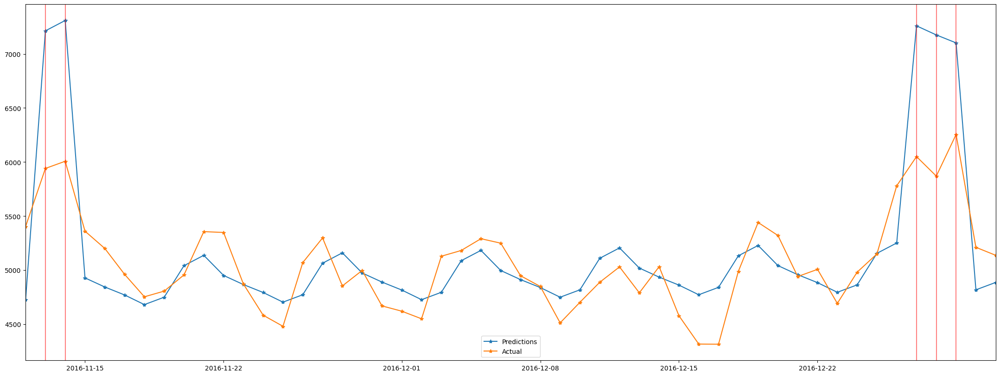

MAE : 313.218
RMSE : 454.451
MAPE: 0.059
------------------------------------------------------------------------------------------------------------------------------------------------------
es
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,1085.972919,Wednesday,7,2015,0
2015-07-02,1037.82891,Thursday,7,2015,0
2015-07-03,954.431796,Friday,7,2015,0
2015-07-04,896.069961,Saturday,7,2015,0
2015-07-05,974.515374,Sunday,7,2015,0


23:06:55 - cmdstanpy - INFO - Chain [1] start processing
23:06:55 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


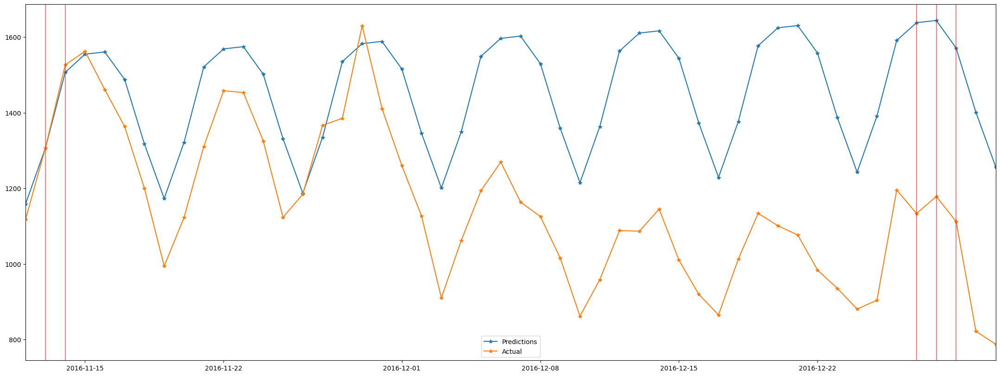

MAE : 303.218
RMSE : 350.632
MAPE: 0.289
------------------------------------------------------------------------------------------------------------------------------------------------------
fr
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,475.150994,Wednesday,7,2015,0
2015-07-02,478.20396,Thursday,7,2015,0
2015-07-03,459.840994,Friday,7,2015,0
2015-07-04,491.515491,Saturday,7,2015,0
2015-07-05,482.563026,Sunday,7,2015,0


23:06:55 - cmdstanpy - INFO - Chain [1] start processing
23:06:55 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


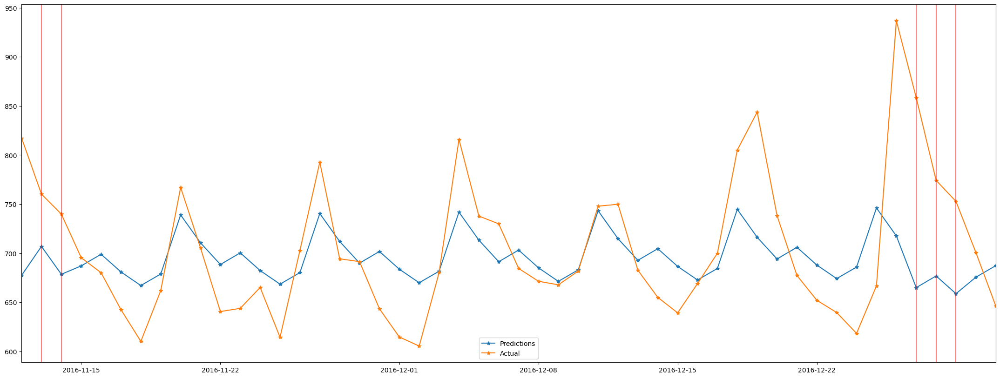

MAE : 47.6
RMSE : 65.385
MAPE: 0.065
------------------------------------------------------------------------------------------------------------------------------------------------------
ja
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,580.647056,Wednesday,7,2015,0
2015-07-02,666.674242,Thursday,7,2015,0
2015-07-03,602.292113,Friday,7,2015,0
2015-07-04,756.514843,Saturday,7,2015,0
2015-07-05,725.731734,Sunday,7,2015,0


23:06:56 - cmdstanpy - INFO - Chain [1] start processing
23:06:56 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


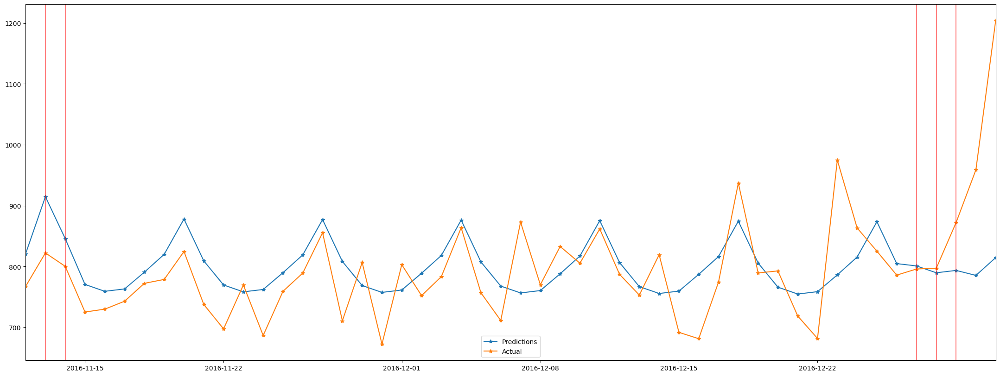

MAE : 56.997
RMSE : 83.333
MAPE: 0.069
------------------------------------------------------------------------------------------------------------------------------------------------------
ru
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,629.999601,Wednesday,7,2015,0
2015-07-02,640.905259,Thursday,7,2015,0
2015-07-03,594.028143,Friday,7,2015,0
2015-07-04,558.732475,Saturday,7,2015,0
2015-07-05,595.032932,Sunday,7,2015,0


23:06:56 - cmdstanpy - INFO - Chain [1] start processing
23:06:56 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


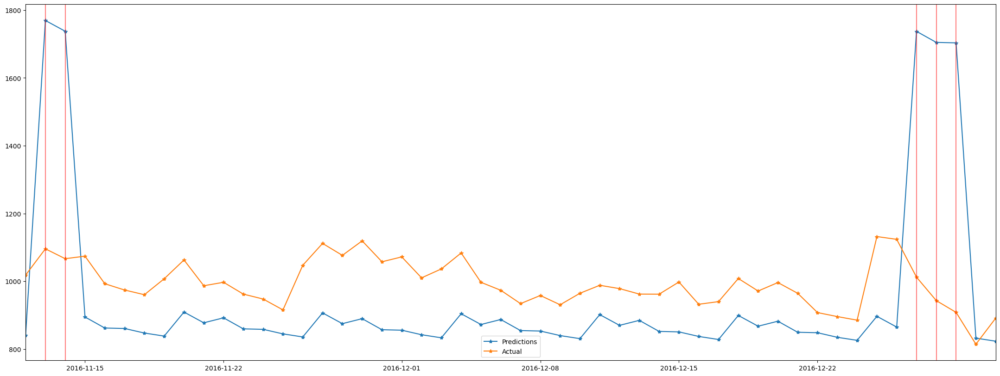

MAE : 190.347
RMSE : 266.576
MAPE: 0.189
------------------------------------------------------------------------------------------------------------------------------------------------------
www
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,47.90589,Wednesday,7,2015,0
2015-07-02,52.573963,Thursday,7,2015,0
2015-07-03,44.649614,Friday,7,2015,0
2015-07-04,42.331571,Saturday,7,2015,0
2015-07-05,46.391209,Sunday,7,2015,0


23:06:56 - cmdstanpy - INFO - Chain [1] start processing
23:06:57 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


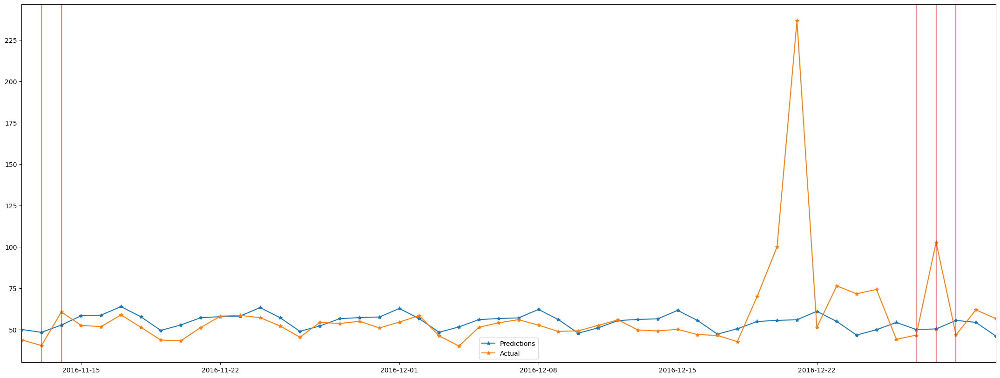

MAE : 12.092
RMSE : 28.661
MAPE: 0.156
------------------------------------------------------------------------------------------------------------------------------------------------------
zh
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,240.582042,Wednesday,7,2015,0
2015-07-02,240.971125,Thursday,7,2015,0
2015-07-03,239.358622,Friday,7,2015,0
2015-07-04,241.667788,Saturday,7,2015,0
2015-07-05,257.791433,Sunday,7,2015,0


23:06:57 - cmdstanpy - INFO - Chain [1] start processing
23:06:57 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


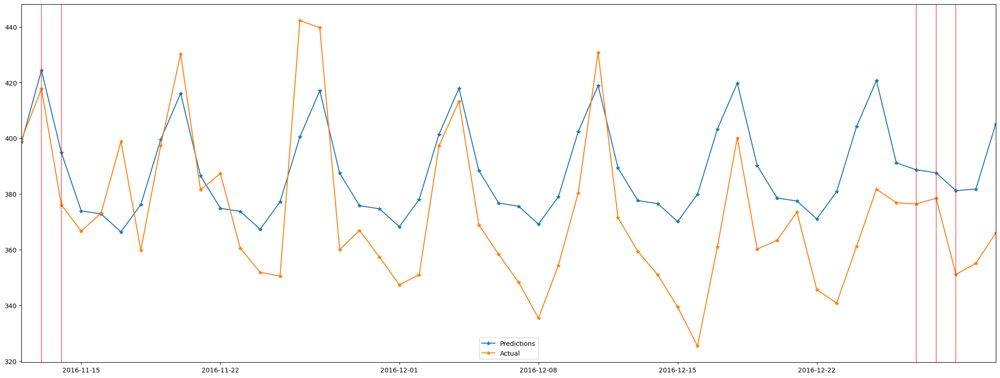

MAE : 20.825
RMSE : 24.275
MAPE: 0.057


In [105]:
for language in languages:
    print(f"{'-'*150}")
    print(f"{language}")
    print(f"{'-'*150}")
    display(tsa_train[language].head())
    
    model, forecast, mape_score =  prophet_model(train = tsa_train[language], test = tsa_test[language], period = tsa_test[language].shape[0], is_exog = True, is_parameter = False, is_plot = True)

    if mape_score < prophet_model_score[language]:
        prophet_model_score[language] = mape_score
        prophet_model_used[language] = [{"is_exog" : True, "is_parameter" : False}]

    

##### model 3

------------------------------------------------------------------------------------------------------------------------------------------------------
commons
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,108.083468,Wednesday,7,2015,0
2015-07-02,111.695785,Thursday,7,2015,0
2015-07-03,109.05437,Friday,7,2015,0
2015-07-04,90.206273,Saturday,7,2015,0
2015-07-05,100.332196,Sunday,7,2015,0


23:06:57 - cmdstanpy - INFO - Chain [1] start processing
23:06:57 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------


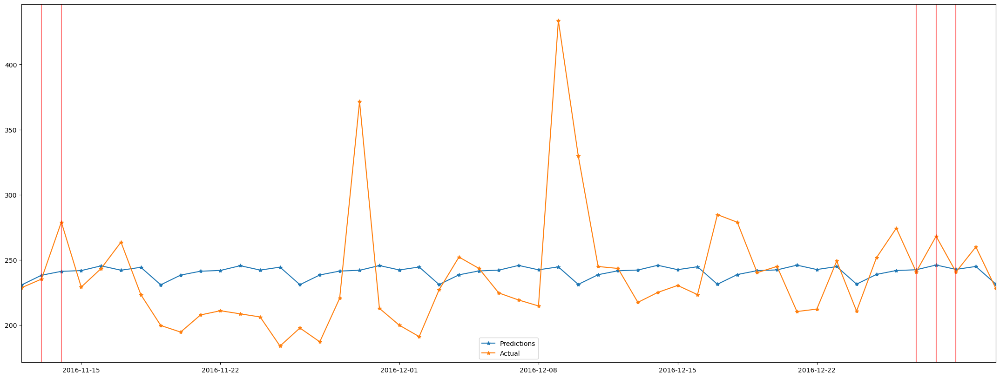

MAE : 29.638
RMSE : 44.459
MAPE: 0.119
------------------------------------------------------------------------------------------------------------------------------------------------------
de
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,714.968405,Wednesday,7,2015,0
2015-07-02,705.240535,Thursday,7,2015,0
2015-07-03,676.883812,Friday,7,2015,0
2015-07-04,621.151996,Saturday,7,2015,0
2015-07-05,722.081525,Sunday,7,2015,0


23:06:58 - cmdstanpy - INFO - Chain [1] start processing
23:06:58 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------


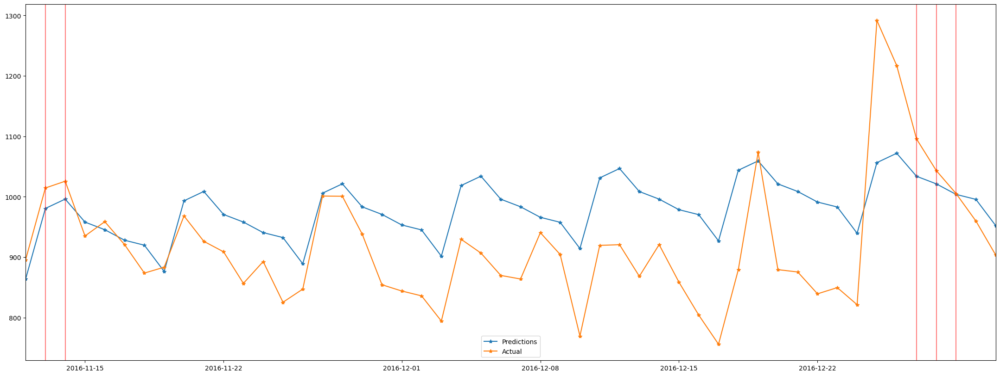

MAE : 83.499
RMSE : 100.242
MAPE: 0.094
------------------------------------------------------------------------------------------------------------------------------------------------------
en
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,3513.862203,Wednesday,7,2015,0
2015-07-02,3502.540258,Thursday,7,2015,0
2015-07-03,3325.387138,Friday,7,2015,0
2015-07-04,3462.089869,Saturday,7,2015,0
2015-07-05,3575.560857,Sunday,7,2015,0


23:06:58 - cmdstanpy - INFO - Chain [1] start processing
23:06:58 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------


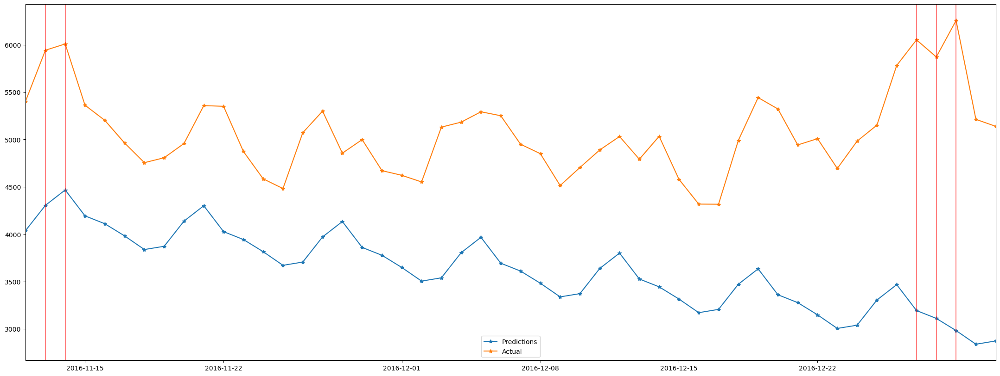

MAE : 1456.918
RMSE : 1556.32
MAPE: 0.283
------------------------------------------------------------------------------------------------------------------------------------------------------
es
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,1085.972919,Wednesday,7,2015,0
2015-07-02,1037.82891,Thursday,7,2015,0
2015-07-03,954.431796,Friday,7,2015,0
2015-07-04,896.069961,Saturday,7,2015,0
2015-07-05,974.515374,Sunday,7,2015,0


23:06:59 - cmdstanpy - INFO - Chain [1] start processing
23:06:59 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------


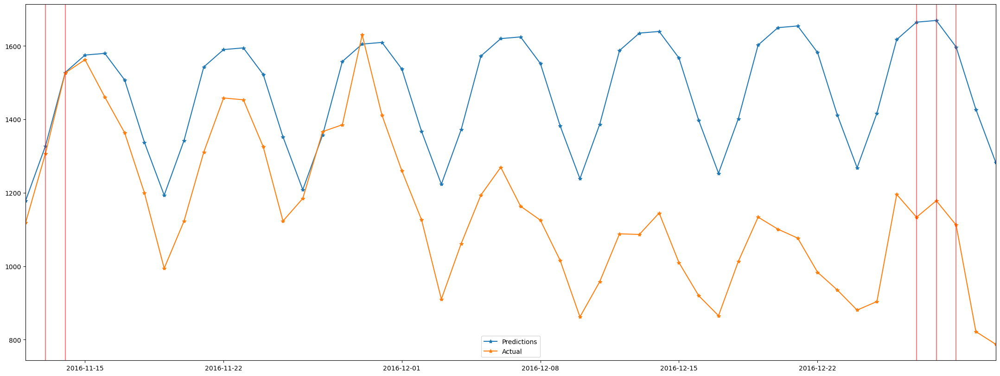

MAE : 323.228
RMSE : 371.154
MAPE: 0.308
------------------------------------------------------------------------------------------------------------------------------------------------------
fr
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,475.150994,Wednesday,7,2015,0
2015-07-02,478.20396,Thursday,7,2015,0
2015-07-03,459.840994,Friday,7,2015,0
2015-07-04,491.515491,Saturday,7,2015,0
2015-07-05,482.563026,Sunday,7,2015,0


23:06:59 - cmdstanpy - INFO - Chain [1] start processing
23:06:59 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------


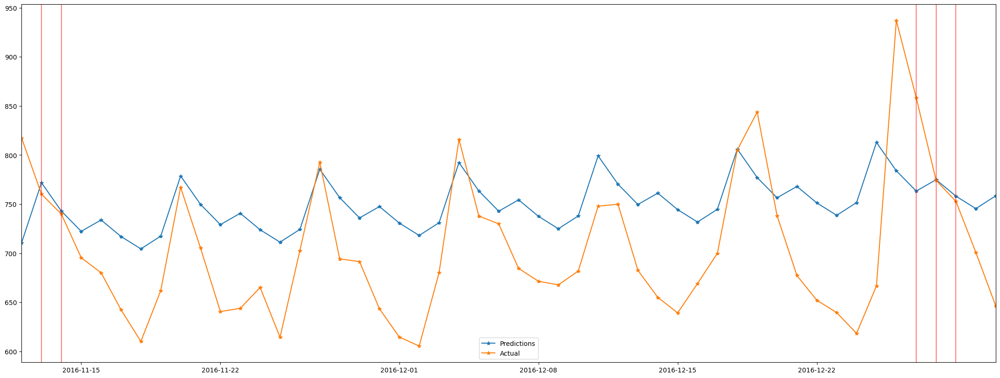

MAE : 63.537
RMSE : 75.175
MAPE: 0.093
------------------------------------------------------------------------------------------------------------------------------------------------------
ja
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,580.647056,Wednesday,7,2015,0
2015-07-02,666.674242,Thursday,7,2015,0
2015-07-03,602.292113,Friday,7,2015,0
2015-07-04,756.514843,Saturday,7,2015,0
2015-07-05,725.731734,Sunday,7,2015,0


23:06:59 - cmdstanpy - INFO - Chain [1] start processing
23:07:00 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------


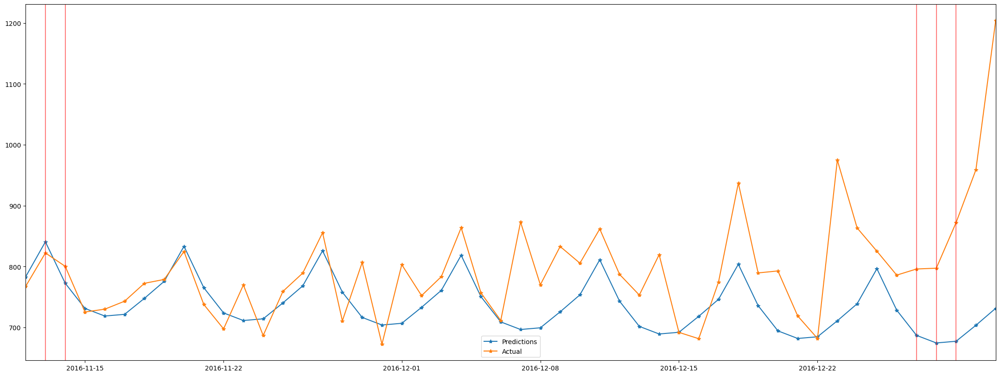

MAE : 68.175
RMSE : 108.127
MAPE: 0.078
------------------------------------------------------------------------------------------------------------------------------------------------------
ru
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,629.999601,Wednesday,7,2015,0
2015-07-02,640.905259,Thursday,7,2015,0
2015-07-03,594.028143,Friday,7,2015,0
2015-07-04,558.732475,Saturday,7,2015,0
2015-07-05,595.032932,Sunday,7,2015,0


23:07:00 - cmdstanpy - INFO - Chain [1] start processing
23:07:00 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------


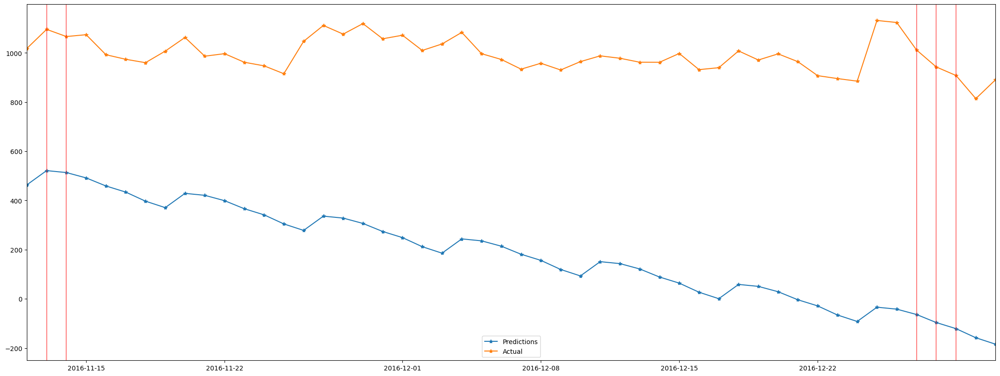

MAE : 809.317
RMSE : 827.409
MAPE: 0.821
------------------------------------------------------------------------------------------------------------------------------------------------------
www
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,47.90589,Wednesday,7,2015,0
2015-07-02,52.573963,Thursday,7,2015,0
2015-07-03,44.649614,Friday,7,2015,0
2015-07-04,42.331571,Saturday,7,2015,0
2015-07-05,46.391209,Sunday,7,2015,0


23:07:00 - cmdstanpy - INFO - Chain [1] start processing
23:07:00 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------


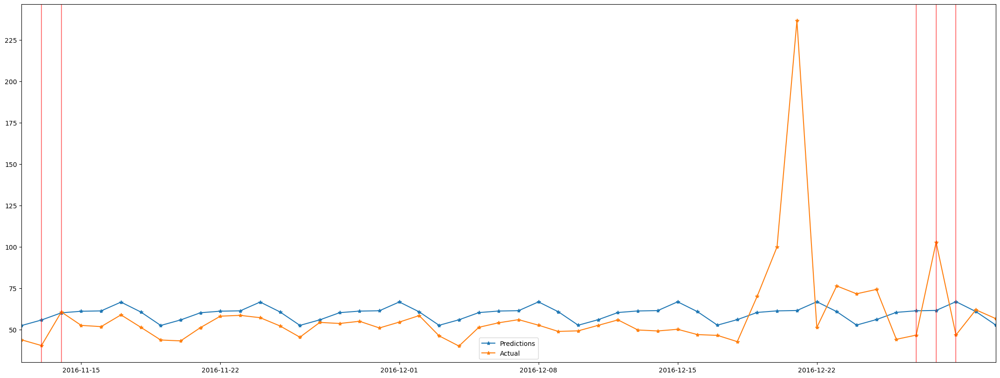

MAE : 14.061
RMSE : 28.043
MAPE: 0.206
------------------------------------------------------------------------------------------------------------------------------------------------------
zh
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,240.582042,Wednesday,7,2015,0
2015-07-02,240.971125,Thursday,7,2015,0
2015-07-03,239.358622,Friday,7,2015,0
2015-07-04,241.667788,Saturday,7,2015,0
2015-07-05,257.791433,Sunday,7,2015,0


23:07:01 - cmdstanpy - INFO - Chain [1] start processing
23:07:01 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------


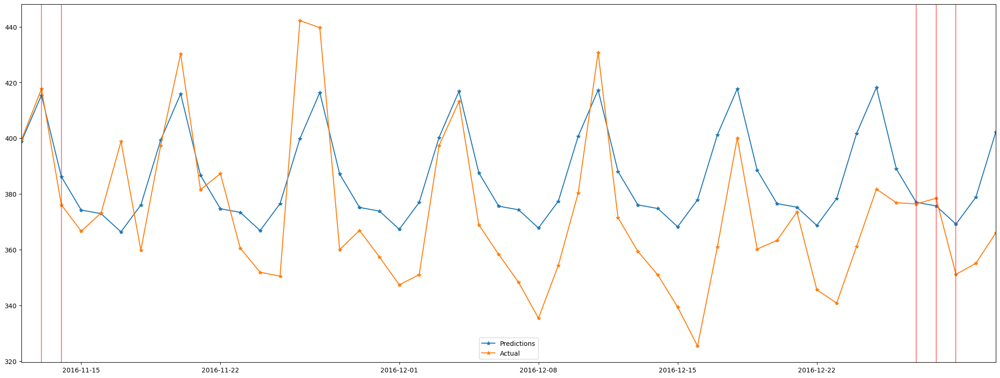

MAE : 18.985
RMSE : 22.734
MAPE: 0.052


In [106]:
for language in languages:
    print(f"{'-'*150}")
    print(f"{language}")
    print(f"{'-'*150}")
    display(tsa_train[language].head())

    # model, forecast, mape_score =  prophet_model(train = tsa_train[language], test = tsa_test[language], period = tsa_test[language].shape[0])
    # prophet_exog_score[language] = mape_score

    model, forecast, mape_score =  prophet_model(train = tsa_train[language], test = tsa_test[language], period = tsa_test[language].shape[0], is_exog = False, is_parameter = True, is_plot = True)

    if mape_score < prophet_model_score[language]:
        prophet_model_score[language] = mape_score
        prophet_model_used[language] = [{"is_exog" : False, "is_parameter" : True}]

In [107]:
type(forecast)

pandas.core.frame.DataFrame

##### model 4

------------------------------------------------------------------------------------------------------------------------------------------------------
commons
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,108.083468,Wednesday,7,2015,0
2015-07-02,111.695785,Thursday,7,2015,0
2015-07-03,109.05437,Friday,7,2015,0
2015-07-04,90.206273,Saturday,7,2015,0
2015-07-05,100.332196,Sunday,7,2015,0


23:07:01 - cmdstanpy - INFO - Chain [1] start processing
23:07:01 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


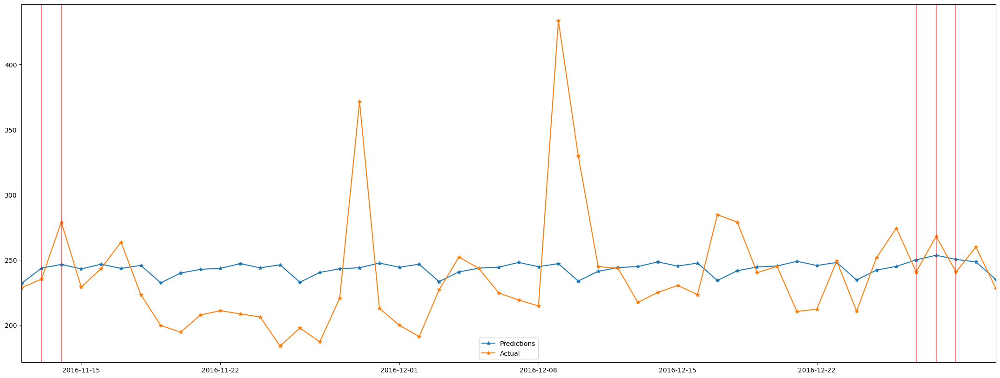

MAE : 30.323
RMSE : 44.459
MAPE: 0.123
------------------------------------------------------------------------------------------------------------------------------------------------------
de
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,714.968405,Wednesday,7,2015,0
2015-07-02,705.240535,Thursday,7,2015,0
2015-07-03,676.883812,Friday,7,2015,0
2015-07-04,621.151996,Saturday,7,2015,0
2015-07-05,722.081525,Sunday,7,2015,0


23:07:02 - cmdstanpy - INFO - Chain [1] start processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


23:07:02 - cmdstanpy - INFO - Chain [1] done processing


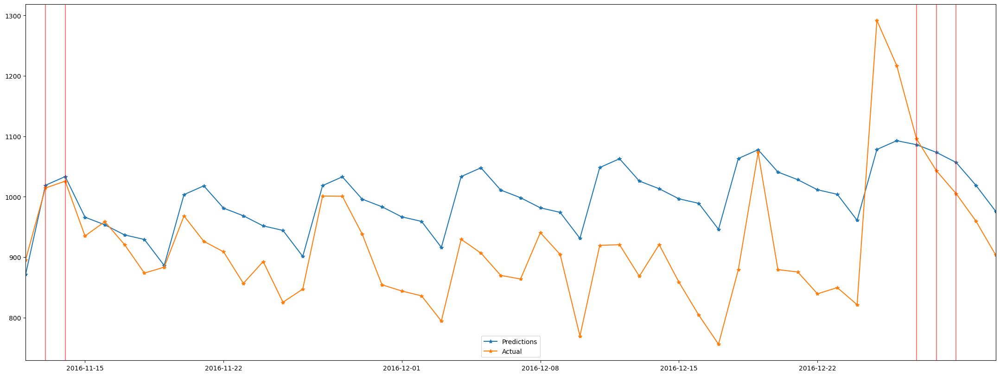

MAE : 93.027
RMSE : 110.46
MAPE: 0.105
------------------------------------------------------------------------------------------------------------------------------------------------------
en
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,3513.862203,Wednesday,7,2015,0
2015-07-02,3502.540258,Thursday,7,2015,0
2015-07-03,3325.387138,Friday,7,2015,0
2015-07-04,3462.089869,Saturday,7,2015,0
2015-07-05,3575.560857,Sunday,7,2015,0


23:07:02 - cmdstanpy - INFO - Chain [1] start processing
23:07:02 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


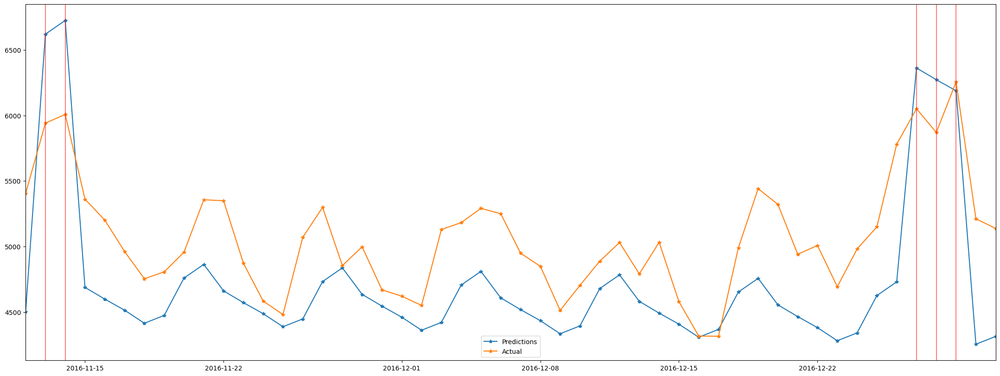

MAE : 435.128
RMSE : 504.763
MAPE: 0.084
------------------------------------------------------------------------------------------------------------------------------------------------------
es
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,1085.972919,Wednesday,7,2015,0
2015-07-02,1037.82891,Thursday,7,2015,0
2015-07-03,954.431796,Friday,7,2015,0
2015-07-04,896.069961,Saturday,7,2015,0
2015-07-05,974.515374,Sunday,7,2015,0


23:07:03 - cmdstanpy - INFO - Chain [1] start processing
23:07:03 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


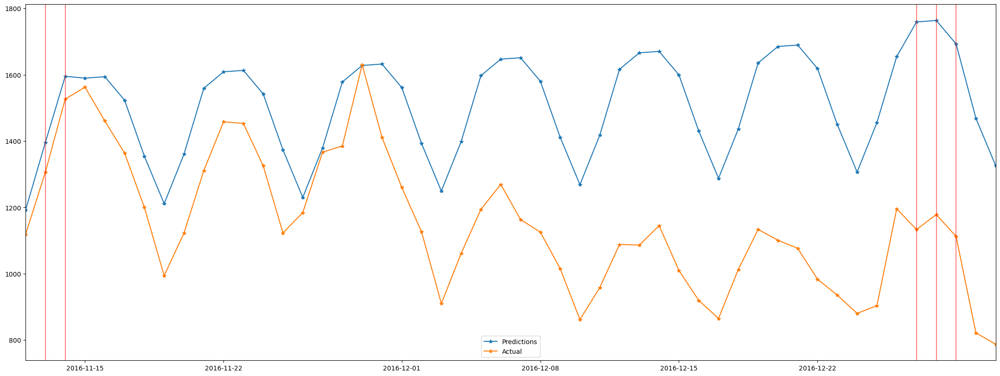

MAE : 354.701
RMSE : 403.574
MAPE: 0.337
------------------------------------------------------------------------------------------------------------------------------------------------------
fr
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,475.150994,Wednesday,7,2015,0
2015-07-02,478.20396,Thursday,7,2015,0
2015-07-03,459.840994,Friday,7,2015,0
2015-07-04,491.515491,Saturday,7,2015,0
2015-07-05,482.563026,Sunday,7,2015,0


23:07:03 - cmdstanpy - INFO - Chain [1] start processing
23:07:03 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


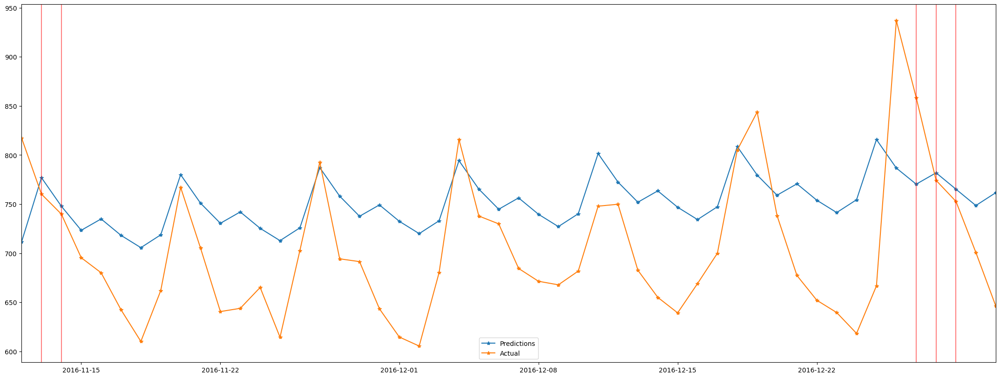

MAE : 65.298
RMSE : 76.375
MAPE: 0.096
------------------------------------------------------------------------------------------------------------------------------------------------------
ja
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,580.647056,Wednesday,7,2015,0
2015-07-02,666.674242,Thursday,7,2015,0
2015-07-03,602.292113,Friday,7,2015,0
2015-07-04,756.514843,Saturday,7,2015,0
2015-07-05,725.731734,Sunday,7,2015,0


23:07:04 - cmdstanpy - INFO - Chain [1] start processing
23:07:04 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


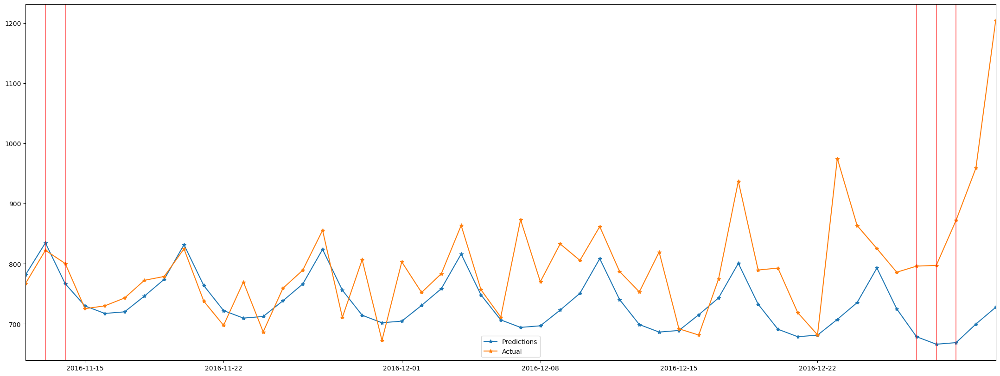

MAE : 70.105
RMSE : 110.26
MAPE: 0.081
------------------------------------------------------------------------------------------------------------------------------------------------------
ru
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,629.999601,Wednesday,7,2015,0
2015-07-02,640.905259,Thursday,7,2015,0
2015-07-03,594.028143,Friday,7,2015,0
2015-07-04,558.732475,Saturday,7,2015,0
2015-07-05,595.032932,Sunday,7,2015,0


23:07:04 - cmdstanpy - INFO - Chain [1] start processing
23:07:04 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


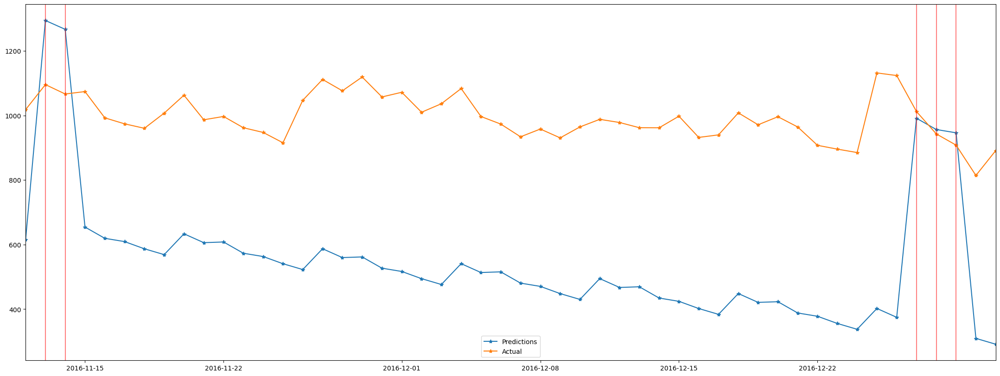

MAE : 461.293
RMSE : 484.674
MAPE: 0.466
------------------------------------------------------------------------------------------------------------------------------------------------------
www
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,47.90589,Wednesday,7,2015,0
2015-07-02,52.573963,Thursday,7,2015,0
2015-07-03,44.649614,Friday,7,2015,0
2015-07-04,42.331571,Saturday,7,2015,0
2015-07-05,46.391209,Sunday,7,2015,0


23:07:04 - cmdstanpy - INFO - Chain [1] start processing
23:07:05 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


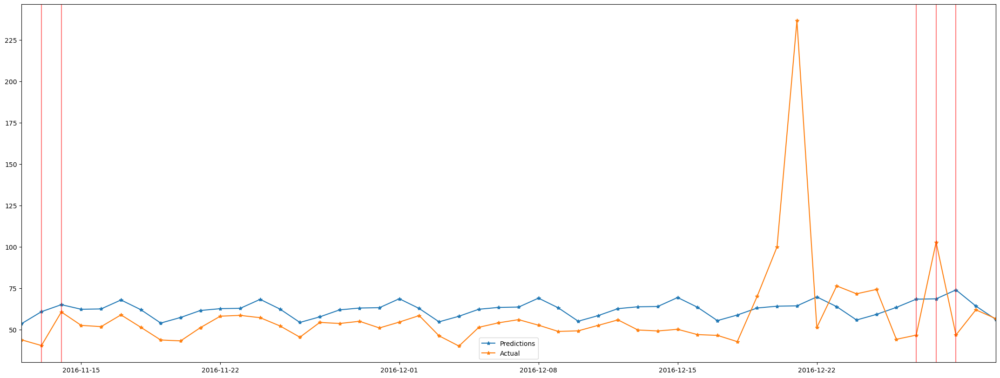

MAE : 15.47
RMSE : 28.136
MAPE: 0.239
------------------------------------------------------------------------------------------------------------------------------------------------------
zh
------------------------------------------------------------------------------------------------------------------------------------------------------


,Adviews,dayName,month,year,exog
Date,,,,,
2015-07-01,240.582042,Wednesday,7,2015,0
2015-07-02,240.971125,Thursday,7,2015,0
2015-07-03,239.358622,Friday,7,2015,0
2015-07-04,241.667788,Saturday,7,2015,0
2015-07-05,257.791433,Sunday,7,2015,0


23:07:05 - cmdstanpy - INFO - Chain [1] start processing
23:07:05 - cmdstanpy - INFO - Chain [1] done processing


model with parameters - 'interval_width=0.95, yearly_seasonality=False, weekly_seasonality=True, changepoint_prior_scale=4'
--------------------------------------------------
--------------------------------------------------
exog paramater considered - 'Campaign'


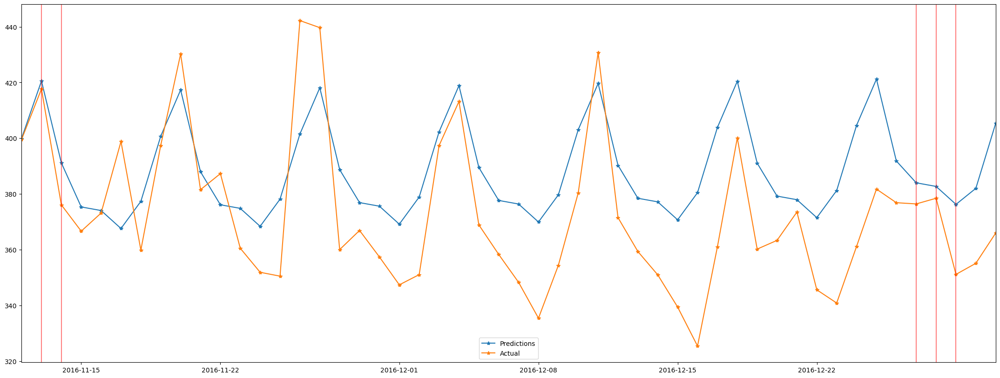

MAE : 20.853
RMSE : 24.408
MAPE: 0.057


In [108]:
for language in languages:
    print(f"{'-'*150}")
    print(f"{language}")
    print(f"{'-'*150}")
    display(tsa_train[language].head())

    model, forecast, mape_score =  prophet_model(train = tsa_train[language], test = tsa_test[language], period = tsa_test[language].shape[0], is_exog = True, is_parameter = True, is_plot = True)

    if mape_score < prophet_model_score[language]:
        prophet_model_score[language] = mape_score
        prophet_model_used[language] = [{"is_exog" : True, "is_parameter" : True}]

#### Linear Regression Model

------------------------------------------------------------------------------------------------------------------------------------------------------
commons
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,136.88843,246.800322,144.942827,123.773817,138.038009,184.294152,0,1,8
32,265.324677,136.88843,147.707892,124.703009,138.724322,184.294152,0,1,8
33,133.153338,265.324677,169.641768,129.65878,149.312201,191.646522,0,0,8
34,156.692473,133.153338,168.555364,130.436166,150.778381,191.646522,0,0,8
35,162.548957,156.692473,172.376661,132.580882,151.7241,191.646522,0,0,8


MAE : 26.506
RMSE : 45.21
MAPE: 0.1


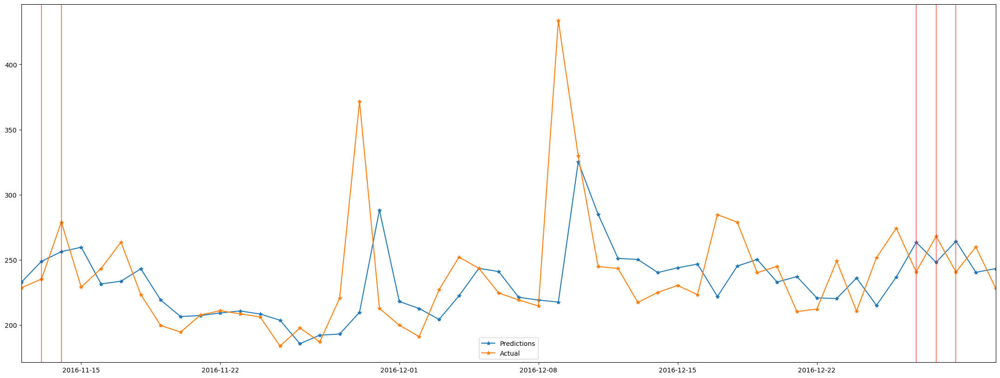

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
de
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,655.223663,669.012198,716.464424,739.774495,741.73901,864.010341,0,1,8
32,677.782211,655.223663,713.651334,737.847245,724.59215,864.010341,0,1,8
33,704.774545,677.782211,709.70367,736.961493,712.631216,885.471966,0,0,8
34,746.449572,704.774545,702.501234,737.861194,707.648347,885.471966,0,0,8
35,714.758075,746.449572,702.110908,741.903051,709.371883,885.471966,0,0,8


MAE : 57.38
RMSE : 88.486
MAPE: 0.06


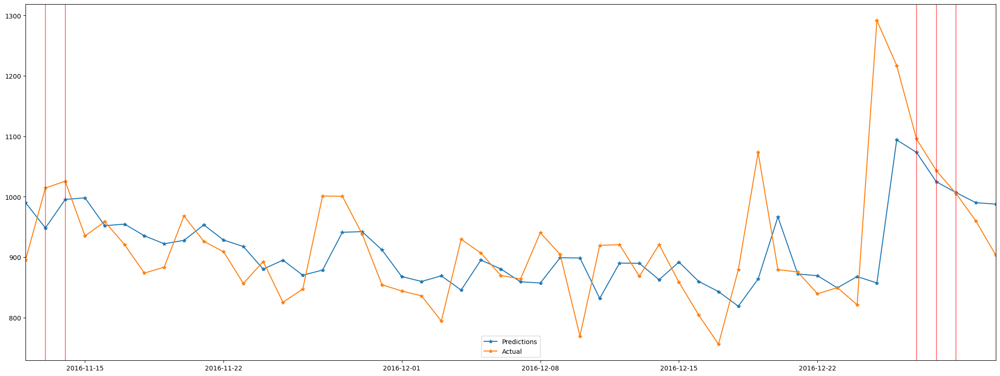

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
en
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,3181.523175,3175.953453,3545.024511,3556.260352,3515.813472,4464.755608,0,1,8
32,3463.016135,3181.523175,3521.381493,3545.539738,3504.824985,4464.755608,0,1,8
33,3267.752304,3463.016135,3503.852701,3544.264766,3499.282563,4493.547125,0,0,8
34,3522.545469,3267.752304,3450.15626,3542.405578,3466.911351,4493.547125,0,0,8
35,3527.43172,3522.545469,3440.511273,3544.355759,3465.35598,4493.547125,0,0,8


MAE : 232.092
RMSE : 313.173
MAPE: 0.045


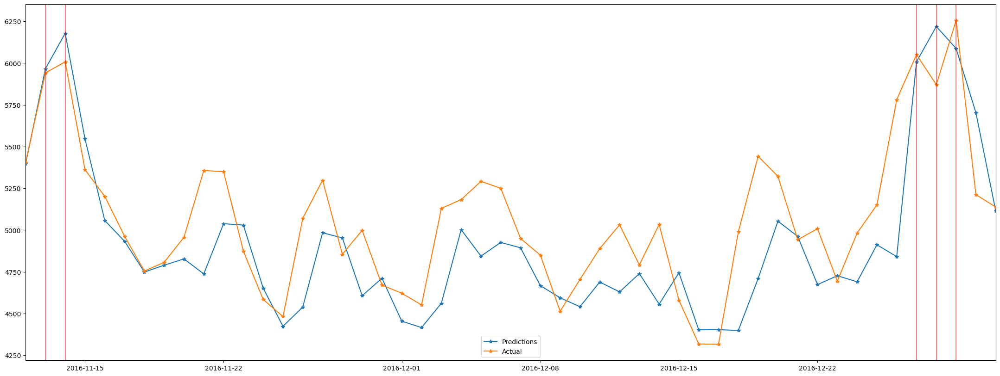

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
es
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,737.823286,844.793093,905.167858,971.540554,920.22348,1065.568342,0,1,8
32,809.903248,737.823286,900.412397,960.309921,915.340211,1065.568342,0,1,8
33,834.691379,809.903248,894.623286,952.95748,911.595241,1314.668939,0,0,8
34,1012.505375,834.691379,873.940922,949.094886,898.858406,1314.668939,0,0,8
35,1024.681296,1012.505375,879.698964,952.850867,899.505893,1314.668939,0,0,8


MAE : 89.893
RMSE : 118.793
MAPE: 0.082


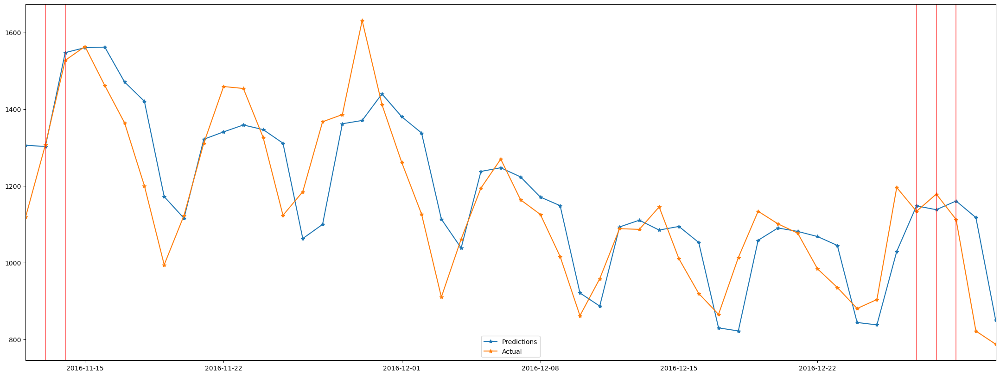

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
fr
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,405.557485,418.801385,440.572434,468.687521,455.281215,679.342496,0,1,8
32,412.956123,405.557485,437.86655,466.442569,451.138116,679.342496,0,1,8
33,420.303908,412.956123,431.059737,464.3378,444.737119,658.564698,0,0,8
34,501.359123,420.303908,427.314673,463.06241,439.751138,658.564698,0,0,8
35,483.681509,501.359123,435.937065,463.379946,441.46779,658.564698,0,0,8


MAE : 37.763
RMSE : 57.251
MAPE: 0.051


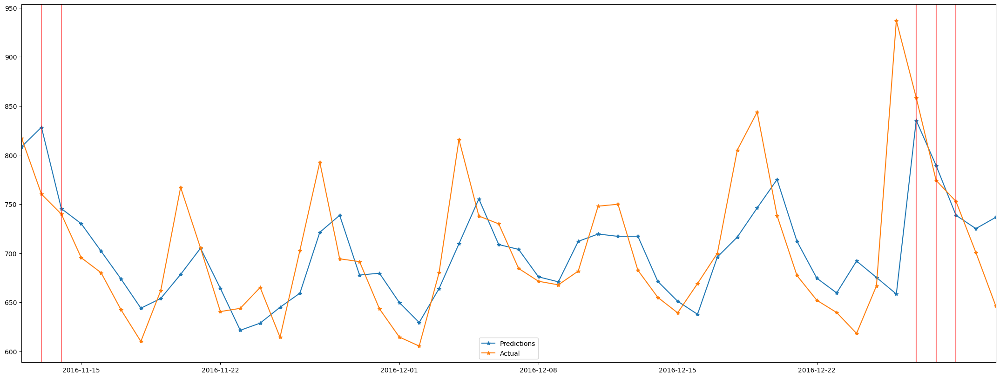

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
ja
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,433.998203,447.072908,489.940634,596.927102,540.205359,825.24792,0,1,8
32,484.147428,433.998203,483.356672,592.196493,523.887739,825.24792,0,1,8
33,522.978652,484.147428,479.086768,586.308532,512.069426,754.895518,0,0,8
34,604.349772,522.978652,482.829118,583.750033,503.012258,754.895518,0,0,8
35,595.014032,604.349772,499.789002,578.841482,505.621323,754.895518,0,0,8


MAE : 54.101
RMSE : 78.001
MAPE: 0.065


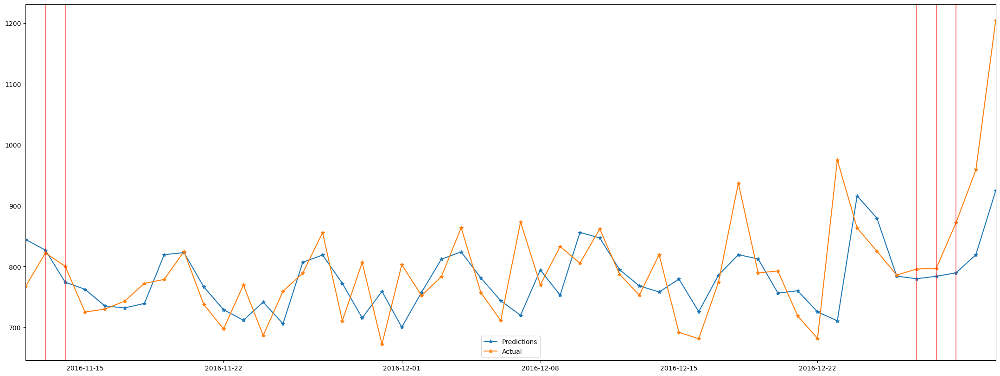

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
ru
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,494.441545,551.990731,565.252831,644.998026,616.298034,986.431048,0,1,8
32,551.781918,494.441545,563.726114,640.625186,605.660664,986.431048,0,1,8
33,700.334313,551.781918,561.940564,637.750239,594.173552,993.200674,0,0,8
34,736.717292,700.334313,574.872098,641.17947,591.970825,993.200674,0,0,8
35,704.54189,736.717292,596.181801,646.920916,593.764921,993.200674,0,0,8


MAE : 64.143
RMSE : 94.075
MAPE: 0.063


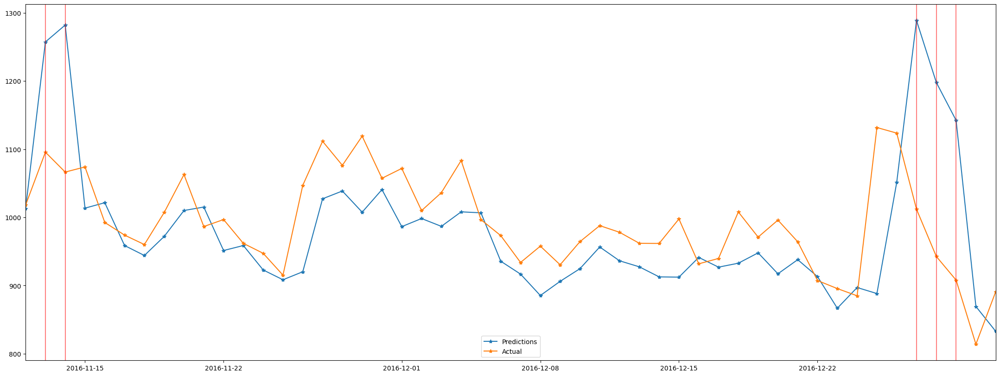

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
www
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,33.493106,41.035506,42.106178,44.635999,41.878689,52.700728,0,1,8
32,37.12907,33.493106,42.025063,44.171071,41.543616,52.700728,0,1,8
33,37.940018,37.12907,42.427703,43.672849,41.601971,60.948227,0,0,8
34,44.208561,37.940018,41.791994,43.45641,41.171198,60.948227,0,0,8
35,41.889312,44.208561,41.706375,43.516958,41.230133,60.948227,0,0,8


MAE : 13.797
RMSE : 32.054
MAPE: 0.199


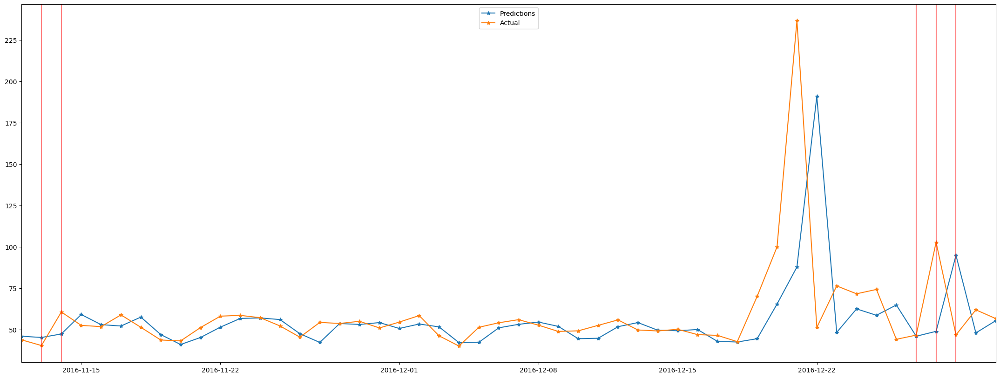

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
zh
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,178.32705,196.155981,210.070817,245.522963,233.844477,365.273779,0,1,8
32,195.850497,178.32705,206.817621,243.514737,228.292832,365.273779,0,1,8
33,217.308238,195.850497,203.779148,242.059233,221.663464,331.505254,0,0,8
34,256.182662,217.308238,203.806521,241.34793,217.794303,331.505254,0,0,8
35,265.671344,256.182662,209.783232,241.816152,217.016131,331.505254,0,0,8


MAE : 12.711
RMSE : 16.306
MAPE: 0.034


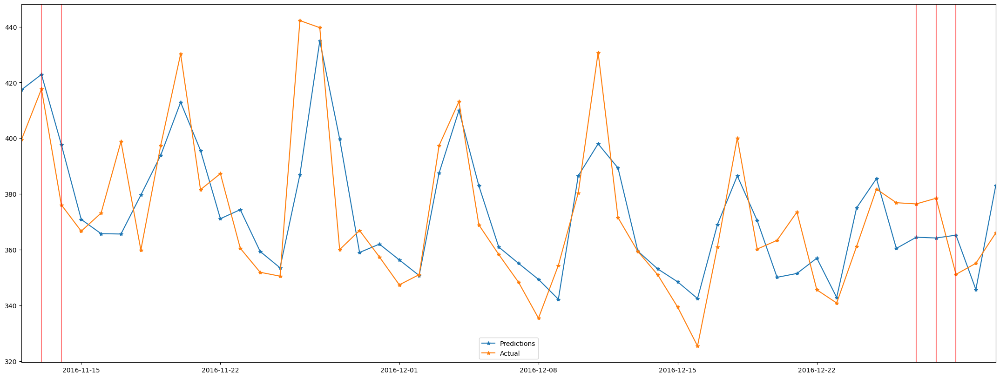

------------------------------------------------------------------------------------------------------------------------------------------------------ 



In [109]:
lr_model_scores = {}
for language in languages:
    print("-" * 150)
    print(f"{language}")
    print("-" * 150,"\n")
    dfo = pd.concat([tsa_train[language] , tsa_test[language]], axis = 0)
    dfo = lr_model_transformation(dfo)

    train = dfo.iloc[:-50].dropna()
    test = dfo.iloc[-50:]
    train_X = train.drop(["Adviews"], axis = 1)
    train_y = train.Adviews
    test_X = test.drop(["Adviews"], axis = 1)
    test_y = test.Adviews

    scaler = StandardScaler()
    scaler.fit(train_X)
    X_sca = scaler.transform(train_X)
    test_x = scaler.transform(test_X)

    model = LinearRegression()
    model.fit(X_sca, train_y)

    y_pred = model.predict(test_x)
    performance(test_y, y_pred)
    lr_model_scores[language] = mape(test_y, y_pred)

    start_date = tsa_test[language].index[0]
    end_date = tsa_test[language].index[-1]
    plt.plot(tsa_test[language].index, y_pred, '-*', label = 'Predictions')
    plt.plot(tsa_test[language].index, test.Adviews, '-*', label = 'Actual')
    for x in tsa_test[language][tsa_test[language]['exog'] == 1].index:
        plt.axvline(x=x, color='red', alpha = 0.5);
    plt.xlim(pd.to_datetime(start_date), pd.to_datetime(end_date))
    plt.legend()
    plt.show()

    print("-" * 150,"\n")

#### XGBRegressor

------------------------------------------------------------------------------------------------------------------------------------------------------
commons
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,136.88843,246.800322,144.942827,123.773817,138.038009,184.294152,0,1,8
32,265.324677,136.88843,147.707892,124.703009,138.724322,184.294152,0,1,8
33,133.153338,265.324677,169.641768,129.65878,149.312201,191.646522,0,0,8
34,156.692473,133.153338,168.555364,130.436166,150.778381,191.646522,0,0,8
35,162.548957,156.692473,172.376661,132.580882,151.7241,191.646522,0,0,8


MAE : 31.295
RMSE : 52.823
MAPE: 0.114


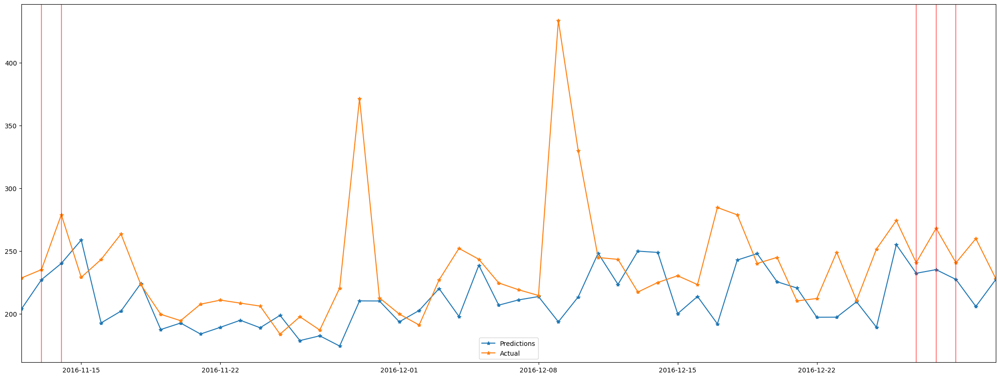

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
de
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,655.223663,669.012198,716.464424,739.774495,741.73901,864.010341,0,1,8
32,677.782211,655.223663,713.651334,737.847245,724.59215,864.010341,0,1,8
33,704.774545,677.782211,709.70367,736.961493,712.631216,885.471966,0,0,8
34,746.449572,704.774545,702.501234,737.861194,707.648347,885.471966,0,0,8
35,714.758075,746.449572,702.110908,741.903051,709.371883,885.471966,0,0,8


MAE : 65.763
RMSE : 88.46
MAPE: 0.069


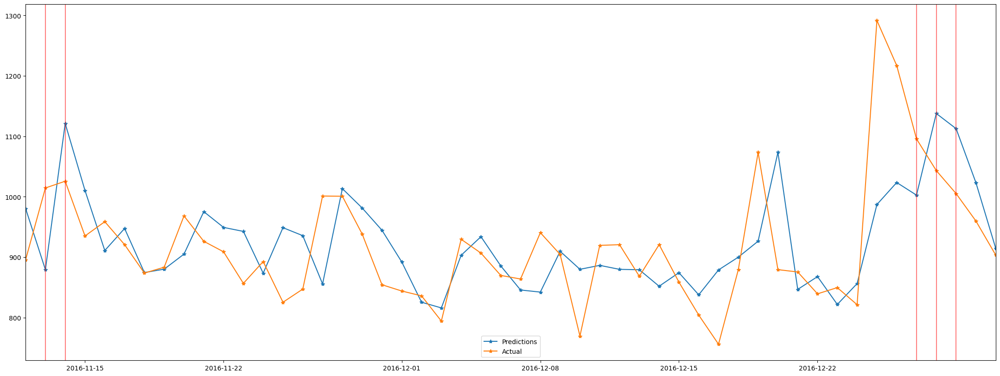

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
en
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,3181.523175,3175.953453,3545.024511,3556.260352,3515.813472,4464.755608,0,1,8
32,3463.016135,3181.523175,3521.381493,3545.539738,3504.824985,4464.755608,0,1,8
33,3267.752304,3463.016135,3503.852701,3544.264766,3499.282563,4493.547125,0,0,8
34,3522.545469,3267.752304,3450.15626,3542.405578,3466.911351,4493.547125,0,0,8
35,3527.43172,3522.545469,3440.511273,3544.355759,3465.35598,4493.547125,0,0,8


MAE : 252.541
RMSE : 307.437
MAPE: 0.049


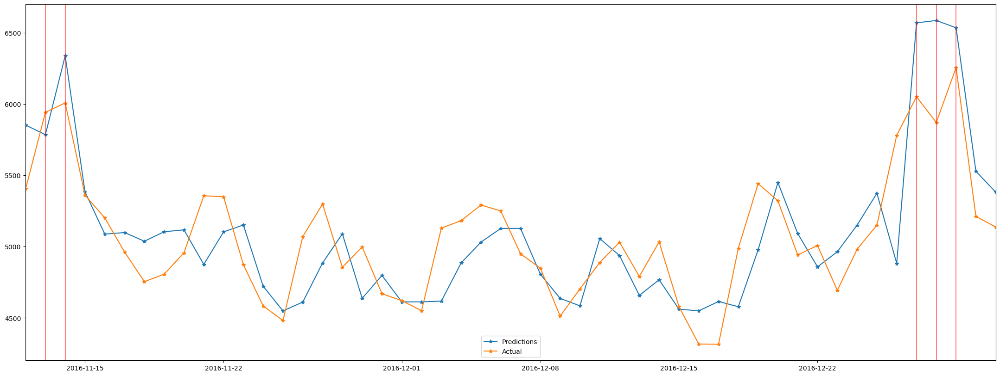

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
es
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,737.823286,844.793093,905.167858,971.540554,920.22348,1065.568342,0,1,8
32,809.903248,737.823286,900.412397,960.309921,915.340211,1065.568342,0,1,8
33,834.691379,809.903248,894.623286,952.95748,911.595241,1314.668939,0,0,8
34,1012.505375,834.691379,873.940922,949.094886,898.858406,1314.668939,0,0,8
35,1024.681296,1012.505375,879.698964,952.850867,899.505893,1314.668939,0,0,8


MAE : 93.376
RMSE : 122.199
MAPE: 0.084


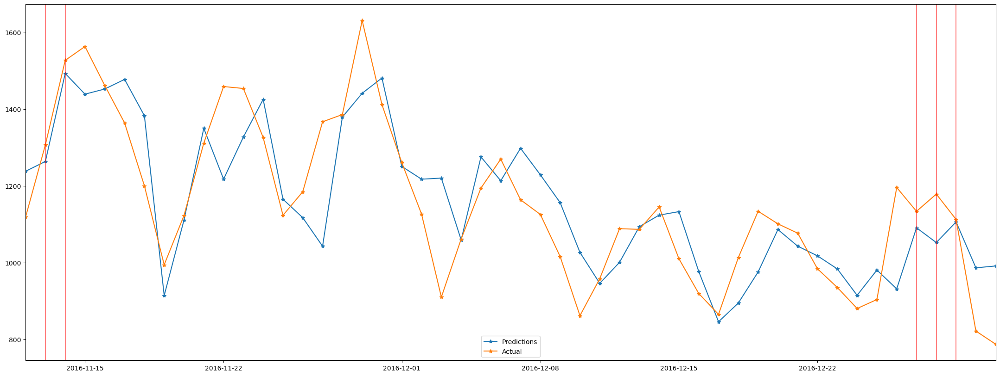

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
fr
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,405.557485,418.801385,440.572434,468.687521,455.281215,679.342496,0,1,8
32,412.956123,405.557485,437.86655,466.442569,451.138116,679.342496,0,1,8
33,420.303908,412.956123,431.059737,464.3378,444.737119,658.564698,0,0,8
34,501.359123,420.303908,427.314673,463.06241,439.751138,658.564698,0,0,8
35,483.681509,501.359123,435.937065,463.379946,441.46779,658.564698,0,0,8


MAE : 53.414
RMSE : 75.651
MAPE: 0.074


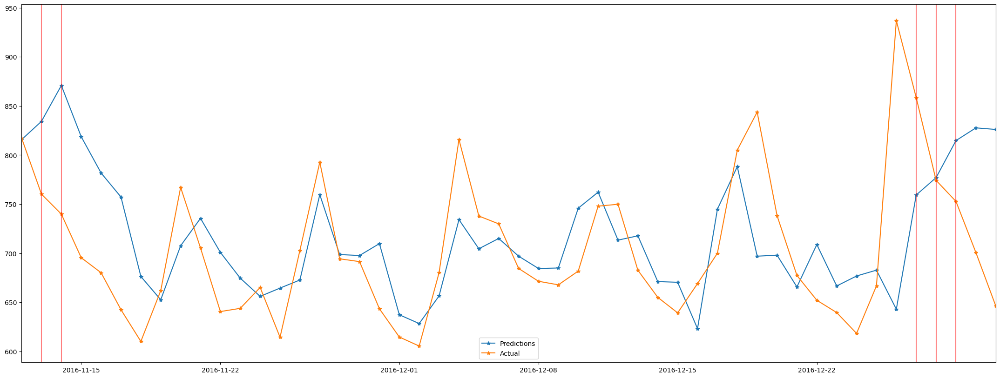

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
ja
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,433.998203,447.072908,489.940634,596.927102,540.205359,825.24792,0,1,8
32,484.147428,433.998203,483.356672,592.196493,523.887739,825.24792,0,1,8
33,522.978652,484.147428,479.086768,586.308532,512.069426,754.895518,0,0,8
34,604.349772,522.978652,482.829118,583.750033,503.012258,754.895518,0,0,8
35,595.014032,604.349772,499.789002,578.841482,505.621323,754.895518,0,0,8


MAE : 107.937
RMSE : 135.504
MAPE: 0.138


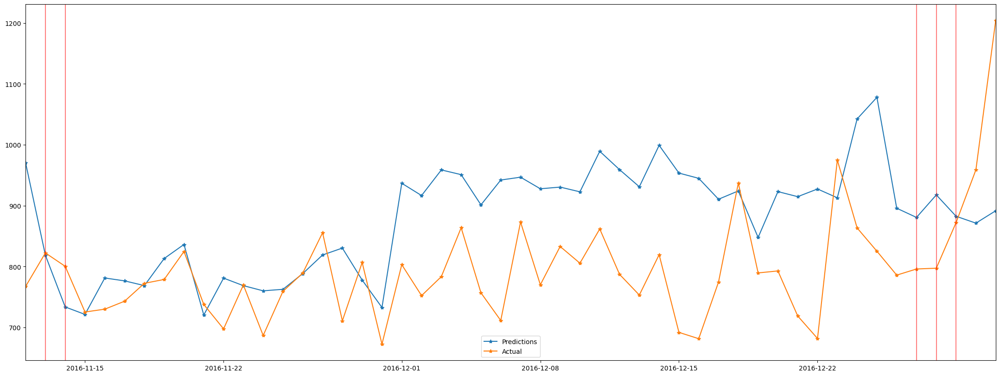

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
ru
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,494.441545,551.990731,565.252831,644.998026,616.298034,986.431048,0,1,8
32,551.781918,494.441545,563.726114,640.625186,605.660664,986.431048,0,1,8
33,700.334313,551.781918,561.940564,637.750239,594.173552,993.200674,0,0,8
34,736.717292,700.334313,574.872098,641.17947,591.970825,993.200674,0,0,8
35,704.54189,736.717292,596.181801,646.920916,593.764921,993.200674,0,0,8


MAE : 68.129
RMSE : 101.728
MAPE: 0.068


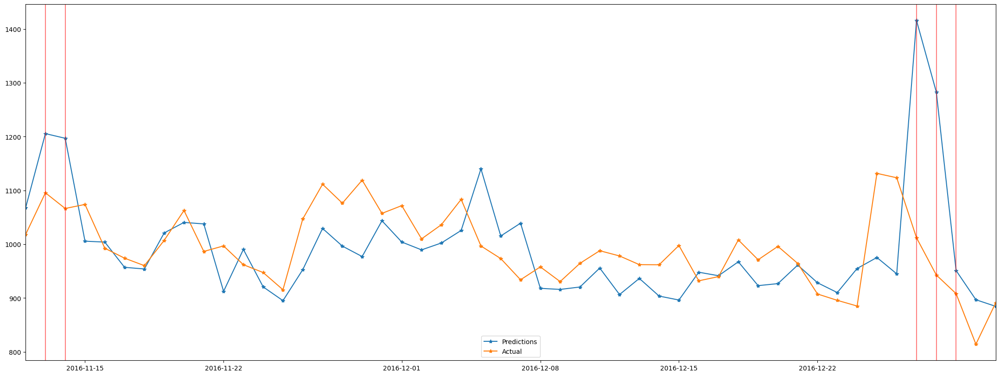

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
www
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,33.493106,41.035506,42.106178,44.635999,41.878689,52.700728,0,1,8
32,37.12907,33.493106,42.025063,44.171071,41.543616,52.700728,0,1,8
33,37.940018,37.12907,42.427703,43.672849,41.601971,60.948227,0,0,8
34,44.208561,37.940018,41.791994,43.45641,41.171198,60.948227,0,0,8
35,41.889312,44.208561,41.706375,43.516958,41.230133,60.948227,0,0,8


MAE : 18.146
RMSE : 34.828
MAPE: 0.286


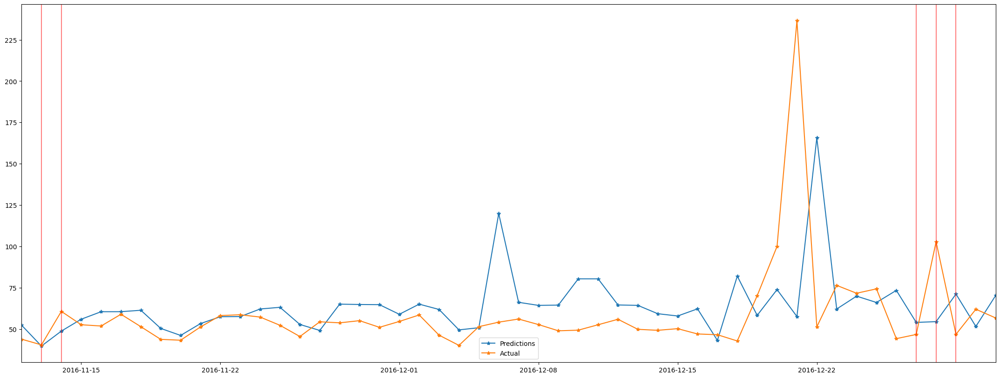

------------------------------------------------------------------------------------------------------------------------------------------------------ 

------------------------------------------------------------------------------------------------------------------------------------------------------
zh
------------------------------------------------------------------------------------------------------------------------------------------------------ 

shape at begining = (550, 6)
shape at end = (519, 44)
training data


,Adviews,Lag_1,last_week_avg_level,last_month_avg_level,last_2week_avg_level,sale_wrt_dow,exog,weekend,month
31,178.32705,196.155981,210.070817,245.522963,233.844477,365.273779,0,1,8
32,195.850497,178.32705,206.817621,243.514737,228.292832,365.273779,0,1,8
33,217.308238,195.850497,203.779148,242.059233,221.663464,331.505254,0,0,8
34,256.182662,217.308238,203.806521,241.34793,217.794303,331.505254,0,0,8
35,265.671344,256.182662,209.783232,241.816152,217.016131,331.505254,0,0,8


MAE : 20.309
RMSE : 26.802
MAPE: 0.054


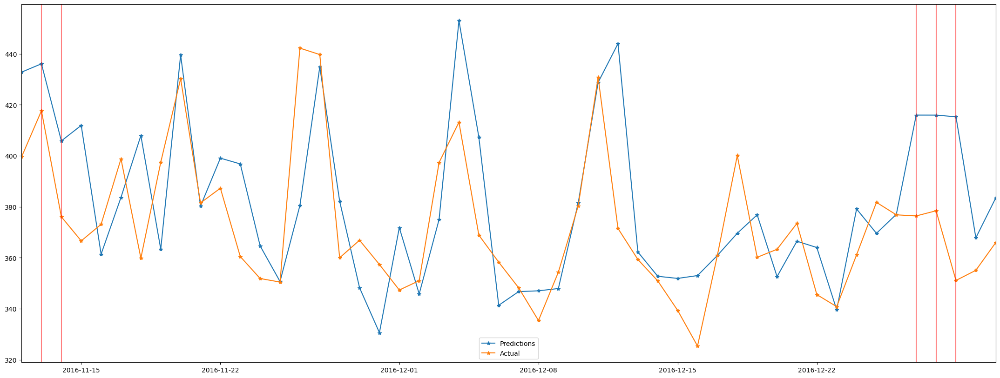

------------------------------------------------------------------------------------------------------------------------------------------------------ 



In [110]:
xgbr_scores = {}
for language in languages:
    print("-" * 150)
    print(f"{language}")
    print("-" * 150,"\n")
    dfo = pd.concat([tsa_train[language] , tsa_test[language]], axis = 0)
    dfo = lr_model_transformation(dfo)

    train = dfo.iloc[:-50].dropna()
    test = dfo.iloc[-50:]
    train_X = train.drop(["Adviews"], axis = 1)
    train_y = train.Adviews
    test_X = test.drop(["Adviews"], axis = 1)
    test_y = test.Adviews

    scaler = StandardScaler()
    scaler.fit(train_X)
    X_sca = scaler.transform(train_X)
    test_x = scaler.transform(test_X)

    model = XGBRegressor()
    model.fit(X_sca, train_y)

    y_pred = model.predict(test_x)
    performance(test_y, y_pred)
    xgbr_scores[language] = mape(test_y, y_pred)

    start_date = tsa_test[language].index[0]
    end_date = tsa_test[language].index[-1]
    plt.plot(tsa_test[language].index, y_pred,'-*', label = 'Predictions')
    plt.plot(tsa_test[language].index, test.Adviews, '-*', label = 'Actual')
    for x in tsa_test[language][tsa_test[language]['exog'] == 1].index:
        plt.axvline(x=x, color='red', alpha = 0.5);
    plt.xlim(pd.to_datetime(start_date), pd.to_datetime(end_date))
    plt.legend()
    plt.show()
    
    print("-" * 150,"\n")

#### scores

In [111]:
pd.DataFrame((lr_model_scores, prophet_model_score, xgbr_scores), index=['lr_model', 'prophet_model', 'xgbr'])

,commons,de,en,es,fr,ja,ru,www,zh
lr_model,0.099828,0.060088,0.044834,0.081600,0.051358,0.064629,0.063488,0.198957,0.033609
prophet_model,0.119034,0.063374,0.055136,0.284808,0.063257,0.067649,0.042503,0.147243,0.052040
xgbr,0.114053,0.069021,0.048638,0.083574,0.074249,0.137745,0.067610,0.286104,0.054304


In [112]:
prophet_model_used

{'commons': [{'is_exog': False, 'is_parameter': True}],
 'de': [{'is_exog': False, 'is_parameter': False}],
 'en': [{'is_exog': False, 'is_parameter': False}],
 'es': [{'is_exog': False, 'is_parameter': False}],
 'fr': [{'is_exog': False, 'is_parameter': False}],
 'ja': [{'is_exog': False, 'is_parameter': False}],
 'ru': [{'is_exog': False, 'is_parameter': False}],
 'www': [{'is_exog': False, 'is_parameter': False}],
 'zh': [{'is_exog': False, 'is_parameter': True}]}